In [1]:
import datetime
import os
import random
import readline
from datetime import date

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cftime
import matplotlib.colors as mcolors
import matplotlib.dates as mdates
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
import netCDF4
import numpy
import pandas
import scipy
import seaborn
import xarray as xr
from cartopy.mpl.gridliner import LATITUDE_FORMATTER, LONGITUDE_FORMATTER
from matplotlib import colors, font_manager, pyplot
from matplotlib.cm import ScalarMappable
from mpl_toolkits.mplot3d import Axes3D
from PIL import Image
from scipy import fft, linalg, stats
from scipy.stats import poisson, ttest_ind
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.preprocessing import normalize
from statsmodels.tsa.ar_model import AutoReg

In [2]:
Diri = '/glade/u/home/whimkao//ExtraTrack/Output_Files/'

In [3]:
# Open File
def Open_File(File):
    DF = pandas.read_csv(File)
    DF = DF.drop("Unnamed: 0", axis=1)
    return (DF)

In [4]:
# Open Each File
def Files_Open(Model, Diri):
    Data_DF = Open_File(Diri+Model+'_Data_Output_V2.csv')
    ET_DF = Open_File(Diri+Model+'_ET_Output_V2.csv')
    Codes_DF = Open_File(Diri+Model+'_Codes_Output_V2.csv')
    Time = []
    Start_Time = []
    End_Time = []
    for i in range(len(Data_DF)):
        Time.append(Datetime(Data_DF["Time(Z)"][i]))
    for j in range(len(ET_DF)):
        Start_Time.append(Datetime(ET_DF["Start Time"][j]))
        End_Time.append(Datetime(ET_DF["End Time"][j]))
    Data_DF["Time(Z)"] = Time
    ET_DF["Start Time"] = Start_Time
    ET_DF["End Time"] = End_Time
    return (Data_DF, ET_DF, Codes_DF)

In [5]:
def Datetime(Time):
    New_Time = datetime.datetime.strptime(Time, '%Y-%m-%d %H:%M:%S')
    return (New_Time)

In [6]:
Control_Data, Control_ET, Control_Codes = Files_Open("Control", Diri)
RCP45_Data, RCP45_ET, RCP45_Codes = Files_Open("RCP45", Diri)
RCP85_Data, RCP85_ET, RCP85_Codes = Files_Open("RCP85", Diri)

In [7]:
Control_Data[280:285]

,Code,Name,Lon,Lat,SLP(hPa),Winds(m/s),B,VLT,VUT,Time(Z),Type
280,TC190105,Lydia,-59.59,28.39,921.57,64.1,-0.84,370.86,425.07,1901-09-22 18:00:00,Tropical
281,TC190105,Lydia,-60.54,28.77,920.25,64.4,-3.11,372.15,446.44,1901-09-23 00:00:00,Tropical
282,TC190105,Lydia,-60.94,28.96,919.96,65.9,-5.57,372.20,460.03,1901-09-23 06:00:00,Tropical
283,TC190105,Lydia,-61.51,29.14,917.78,65.1,-4.46,370.60,471.26,1901-09-23 12:00:00,Tropical
284,TC190105,Lydia,-61.38,29.60,916.02,67.2,-3.70,367.19,472.79,1901-09-23 18:00:00,Tropical


In [8]:
Control_ET[4:7]

,Code,Name,Path Type,Start Time,End Time,ET Duration (hr),Start SLP,End SLP,Min SLP,Start Lon,Start Lat,End Lon,End Lat,ET Distance (km),Tropical Duration (hr)
4,TC190102,Harrison,1.0,1901-05-28 12:00:00,1901-05-30 18:00:00,54.0,991.56,1008.78,980.89,-43.71,30.04,-34.75,24.00,1112.101864,132.0
5,TC190103,Jessica,1.0,1901-07-12 00:00:00,1901-07-15 06:00:00,78.0,1006.39,1013.44,1001.93,-53.11,40.34,-30.00,37.75,2004.448676,78.0
6,TC190105,Lydia,1.0,1901-09-27 12:00:00,1901-09-29 18:00:00,54.0,953.76,970.00,913.33,-53.37,39.19,-42.82,48.53,1335.846025,384.0


In [9]:
Control_Codes[4:7]

,ABC,Orig Code,New Code,Name
4,A,78,TC190102,Harrison
5,A,81,TC190103,Jessica
6,A,89,TC190105,Lydia


In [10]:
# Define Cyclone Type, Set Shape and Colour Code
SLP_Colours = ['darkviolet', 'mediumvioletred', 'magenta', 'red', 'orangered', \
'darkorange', 'orange', 'gold', 'yellow', 'greenyellow', 'limegreen', 'deepskyblue', 'cyan']
SLP_Bounds = numpy.arange(900,1020,10)
#SLP_Bounds = numpy.array([900,910,920,930,940,950,960,970,980,990,1000,1005,1010])
#SLP_Colour_Labels = ['>1010hPa', '1005-1010hPa', '1000-1005hPa', '995-1000hPa', '990-995hPa', \
#'985-990hPa', '980-985hPa', '975-980hPa', '970-975hPa', '965-970hPa', '960-965hPa', \
#'955-960hPa', '950-955hPa', '945-950hPa', '940-945hPa', '935-940hPa', '930-935hPa', '<=930hPa'].reverse()
def Cyclone_Type(DF, ET_DF, Storm_List):
# Cyclone Type and Shape Code
    Cyclone_Type = []
    Plot_Shape = []
    for i in range(len(DF["Type"])):
        if DF["Type"][i] == "Tropical":
            Plot_Shape.append('o')
        elif DF["Type"][i] == "Transition":
            Plot_Shape.append('s')
        elif DF["Type"][i] == "Extratropical":
            Plot_Shape.append('^')
        else:
            print (DF["Type"][i])
    #print (Plot_Shape)
    DF["Shape"] = Plot_Shape
#    
# SLP Colour Code
    Plot_Colour = []
    for i in range(len(DF['SLP(hPa)'])):
        for k in range(len(SLP_Colours)):
            if k == 0:
                if DF['SLP(hPa)'][i] <= SLP_Bounds[k]:
                    Plot_Colour.append(SLP_Colours[k])
            elif k != len(SLP_Colours)-1:
                if DF['SLP(hPa)'][i] <= SLP_Bounds[k] and DF['SLP(hPa)'][i] > SLP_Bounds[k-1]:
                    Plot_Colour.append(SLP_Colours[k])
            else:
                if DF['SLP(hPa)'][i] > SLP_Bounds[k-1]:
                    Plot_Colour.append(SLP_Colours[k])
    #print (Plot_Colour)
    DF["Colour"] = Plot_Colour
    return (DF)

In [11]:
Control_Data_Plot = Cyclone_Type(Control_Data, Control_ET, Control_Codes["New Code"])
RCP45_Data_Plot = Cyclone_Type(RCP45_Data, RCP45_ET, RCP45_Codes["New Code"])
RCP85_Data_Plot = Cyclone_Type(RCP85_Data, RCP85_ET, RCP85_Codes["New Code"])

In [12]:
# Create Legend
def Plot_TC_Legend(Loc):
    pyplot.scatter([-728], [-728], c='cyan', marker='o', linewidths=0.8, edgecolors='black', label='Tropical')
    pyplot.scatter([-728], [-728], c='cyan', marker='s', linewidths=0.8, edgecolors='black', label='Transition')
    pyplot.scatter([-728], [-728], c='cyan', marker='^', linewidths=0.8, edgecolors='black', label='Extratropical')
    pyplot.legend(loc=Loc, fontsize=12)

In [13]:
# Plot Cyclone Track
def Plot_Cyclone_Track(Storm_Code, DF, ET_DF, Bounds, Colours, Loc, Trans, Model, Savefig, Figsize):
    DF_Storm = DF[DF['Code'] == Storm_Code].reset_index()
    Lon = numpy.array(DF_Storm['Lon'])
    Lat = numpy.array(DF_Storm['Lat'])
    Plot_Colour = list(DF_Storm['Colour'])
    Plot_Shape = list(DF_Storm['Shape'])
#
# Plotting
    Fig = pyplot.figure(figsize=Figsize)
    Axis = Fig.add_subplot(1,1,1, projection=ccrs.PlateCarree())
    Axis.coastlines(linewidth=0.5)
    Axis.add_feature(cfeature.BORDERS, linewidth=0.5)
    Axis.add_feature(cfeature.STATES, linewidth=0.3)
    Axis.plot(Lon, Lat, c='black', linewidth=0.5, alpha=0.8)
    for k in range(len(Lon)):
#        if Plot_Shape[k] != 's':
        pyplot.scatter(Lon[k], Lat[k], c=Plot_Colour[k], marker=Plot_Shape[k], linewidths=0.5, edgecolors='black', s=78)
#        else:
#            pyplot.scatter(Lon[k], Lat[k], c=Plot_Colour[k], marker=Plot_Shape[k], linewidths=0.5, edgecolors='black', s=78)
    if Trans == True:
        ET_Storm = ET_DF[ET_DF["Code"] == Storm_Code].reset_index()
        pyplot.scatter(ET_Storm["Start Lon"][0], ET_Storm["Start Lat"][0], marker='s', linewidths=4.8, \
        facecolors='none', edgecolors='black', s=178)
        pyplot.scatter(ET_Storm["End Lon"][0], ET_Storm["End Lat"][0]+0.1, marker='^', linewidths=4.2, \
        facecolors='none', edgecolors='black', s=208)
#
# Formatting
    x_Min = (int(round((numpy.min(Lon)+1.5) / 5)) - 1) * 5
    x_Max = (int(round((numpy.max(Lon)-1.5) / 5)) + 1) * 5
    y_Min = (int(round((numpy.min(Lat)+1.5) / 5)) - 1) * 5
    y_Max = (int(round((numpy.max(Lat)-1.5) / 5)) + 1) * 5
    x_Axis = numpy.arange(x_Min,x_Max+5,5)
    y_Axis = numpy.arange(y_Min,y_Max+5,5)
    Axis.set_xticks(x_Axis)
    Axis.set_yticks(y_Axis)
    Axis.set_xlim(x_Min,x_Max)
    Axis.set_ylim(y_Min,y_Max)
    Title = str(Model + ': ' + DF_Storm['Code'][0] + ' ' + DF_Storm['Name'][0])
    Axis.set_title(Title, fontsize=16)
    Gridline = Axis.gridlines(crs=ccrs.PlateCarree(), linewidth=0.3, color='silver', linestyle='-')
    Gridline.xlocator = mticker.FixedLocator(x_Axis)
    Gridline.ylocator = mticker.FixedLocator(y_Axis)
#
# Colour Bar
    C_Map = mcolors.LinearSegmentedColormap.from_list("SLP(hPa)", Colours, N=len(Colours))
    Norm = mcolors.BoundaryNorm(Bounds, C_Map.N, extend='both')
    Cax = Axis.inset_axes([0.025, -0.12, 0.95, 0.05], transform=Axis.transAxes)
    Fig.colorbar(ScalarMappable(cmap=C_Map, norm=Norm), orientation='horizontal', spacing='proportional', \
    cax=Cax, label='SLP(hPa)', shrink=0.7)
    Plot_TC_Legend(Loc)
#
# Save Fig
    if Savefig == True:
        Figname = str(DF_Storm['Code'][0] + '_' + DF_Storm['Name'][0] + '_Track.png')
        Fig.savefig('/glade/u/home/whimkao//ExtraTrack/Storm_Figs_V2/'+Figname, bbox_inches='tight')

In [14]:
# Plot Cyclone SLP
def Plot_Cyclone_SLP(Storm_Code, DF, ET_DF, Bounds, Colours, Loc, Trans, Model, Savefig):
    DF_Storm = DF[DF['Code'] == Storm_Code].reset_index()
    Time = list(DF_Storm['Time(Z)'])
    SLP = numpy.array(DF_Storm['SLP(hPa)'])
    Plot_Colour = list(DF_Storm['Colour'])
    Plot_Shape = list(DF_Storm['Shape'])
#
# Plotting
    Fig = pyplot.figure(figsize=(12,7))
    Axis = Fig.add_subplot(1,1,1)
    Axis.plot(Time, SLP, c='black', linewidth=0.5, alpha=0.8)
    for k in range(len(Time)):
        Axis.scatter(Time[k], SLP[k], c=Plot_Colour[k], marker=Plot_Shape[k], linewidths=0.8, edgecolors='black', s=78)
    if Trans == True:
        ET_Storm = ET_DF[ET_DF["Code"] == Storm_Code].reset_index()
        pyplot.scatter(ET_Storm["Start Time"][0], ET_Storm["Start SLP"][0], marker='s', linewidths=4.8, \
        facecolors='none', edgecolors='black', s=178)
        pyplot.scatter(ET_Storm["End Time"][0], ET_Storm["End SLP"][0]+0.2, marker='^', linewidths=4.2, \
        facecolors='none', edgecolors='black', s=208)
#
# Formatting
    pyplot.xlabel('Time (Z)', fontsize=12)
    pyplot.ylabel('Sea Level Pressure (SLP)', fontsize=12)
    x_Min = Time[0] + datetime.timedelta(hours=-6)
    x_Max = Time[len(Time)-1] + datetime.timedelta(hours=6)
    x_Start = datetime.date(x_Min.year,x_Min.month,x_Min.day) + datetime.timedelta(1)
    x_End = datetime.date(x_Max.year,x_Max.month,x_Max.day) + datetime.timedelta(1)
    if len(Time) < 40:
        x_Axis = pandas.date_range(x_Start,x_End,freq='D')
    elif len(Time) < 80:
        x_Axis = pandas.date_range(x_Start,x_End,freq='2D')
    else:
        x_Axis = pandas.date_range(x_Start,x_End,freq='3D')
    y_Min = (int(round(numpy.min(SLP) / 5)) - 1) * 5
    y_Max = (int(round(numpy.max(SLP) / 5)) + 1) * 5
    if y_Max - y_Min < 60:
        y_Axis = numpy.arange(y_Min,y_Max+5,5)
    else:
        if y_Min % 10 == 0:
            y_Axis = numpy.arange(y_Min,y_Max+10,10)
        else:
            y_Axis = numpy.arange(y_Min-5,y_Max+15,10)
    Axis.set_xticks(x_Axis)
    Axis.set_yticks(y_Axis)
    Axis.set_xlim(x_Min,x_Max)
    Axis.set_ylim(y_Min,y_Max)
    Title = str(Model + ': ' + DF_Storm['Code'][0] + ' ' + DF_Storm['Name'][0])
    Axis.set_title(Title, fontsize=16)
    Gridline = Axis.grid(linewidth=0.3, color='silver', linestyle='-')
    Plot_TC_Legend(Loc)
#
# Save Fig
    if Savefig == True:
        Figname = str(DF_Storm['Code'][0] + '_' + DF_Storm['Name'][0] + '_SLP.png')
        Fig.savefig('/glade/u/home/whimkao//ExtraTrack/Storm_Figs_V2/'+Figname, bbox_inches='tight')

In [15]:
# Plot Cyclone Phase Diagram
def Plot_Cyclone_Phase(Storm_Code, DF, ET_DF, Bounds, Colours, Loc, Trans, Model, Savefig):
    DF_Storm = DF[DF['Code'] == Storm_Code].reset_index()
    VLT = numpy.array(DF_Storm['VLT'])[1:]
    VUT = numpy.array(DF_Storm['VUT'])[1:]
    B = numpy.array(DF_Storm['B'])[1:]
    Plot_Colour = list(DF_Storm['Colour'])[1:]
    Plot_Shape = list(DF_Storm['Shape'])[1:]
#
# Plotting VUT VLT
    Fig = pyplot.figure(figsize=(16,8))
    Axis = Fig.add_subplot(1,2,1)
    x_Axis = numpy.arange(-500,600,100)
    y_Axis = numpy.arange(-30,130,10)
    Axis.set_xticks(x_Axis)
    Axis.set_yticks(y_Axis)
    pyplot.xlim(-500,500)
    pyplot.ylim(-30,120)
    pyplot.fill_between([0,500], 15, 120, color='violet', alpha=0.2)
    pyplot.fill_between([-500,0], 15, 120, color='mediumblue', alpha=0.2)
    pyplot.fill_between([0,500], -30, 15, color='red', alpha=0.2)
    pyplot.fill_between([-500,0], -30, 15, color='darkgrey', alpha=0.2)
    pyplot.plot([-500,500], [15,15], 'black', linewidth=0.5)
    pyplot.plot([0,0], [-30,120], 'black', linewidth=0.5)
    pyplot.xlabel('VLT', fontsize=12)
    pyplot.ylabel('B', fontsize=12)
    Axis.plot(VLT, B, c='black', linewidth=0.5, alpha=0.5)
    for k in range(len(VLT)):
        Axis.scatter(VLT[k], B[k], c=Plot_Colour[k], marker=Plot_Shape[k], linewidths=0.5, edgecolors='black', s=78)
    if Trans == True:
        ET_Storm = ET_DF[ET_DF["Code"] == Storm_Code].reset_index()
        Start_Time = ET_Storm["Start Time"][0]
        End_Time = ET_Storm["End Time"][0]
        Start_DF = DF_Storm[DF_Storm["Time(Z)"] == Start_Time]
        End_DF = DF_Storm[DF_Storm["Time(Z)"] == End_Time]
#        print (Start_DF)
        pyplot.scatter(Start_DF["VLT"], Start_DF["B"], marker='s', linewidths=4.8, \
        facecolors='none', edgecolors='black', s=178)
        pyplot.scatter(End_DF["VLT"], End_DF["B"]+0.5, marker='^', linewidths=4.2, \
        facecolors='none', edgecolors='black', s=208)
    Title = str(Model + ': ' + DF_Storm['Code'][0] + ' ' + DF_Storm['Name'][0])
    Axis.set_title(Title, fontsize=18)
    Plot_TC_Legend(Loc)
#
# Plotting VUT VLT
    Axis = Fig.add_subplot(1,2,2)
    x_Axis = numpy.arange(-500,600,100)
    y_Axis = numpy.arange(-500,600,100)
    Axis.set_xticks(x_Axis)
    Axis.set_yticks(y_Axis)
    pyplot.xlim(-500,500)
    pyplot.ylim(-500,500)
    pyplot.fill_between([0,500], 500, color='red', alpha=0.2)
    pyplot.fill_between([-500,0], 500, color='lightskyblue', alpha=0.2)
    pyplot.fill_between([0,500], -500, color='orangered', alpha=0.2)
    pyplot.fill_between([-500,0], -500, color='mediumblue', alpha=0.2)
    pyplot.plot([-500,500], [0,0], 'black', linewidth=0.5)
    pyplot.plot([0,0], [-500,500], 'black', linewidth=0.5)
    pyplot.xlabel('VLT', fontsize=12)
    pyplot.ylabel('VUT', fontsize=12)
    Axis.plot(VLT, VUT, c='black', linewidth=0.5, alpha=0.5)
    for k in range(len(VLT)):
        Axis.scatter(VLT[k], VUT[k], c=Plot_Colour[k], marker=Plot_Shape[k], linewidths=0.5, edgecolors='black', s=78)
    if Trans == True:
        ET_Storm = ET_DF[ET_DF["Code"] == Storm_Code].reset_index()
        Start_Time = ET_Storm["Start Time"][0]
        End_Time = ET_Storm["End Time"][0]
        Start_DF = DF_Storm[DF_Storm["Time(Z)"] == Start_Time]
        End_DF = DF_Storm[DF_Storm["Time(Z)"] == End_Time]
        pyplot.scatter(Start_DF["VLT"], Start_DF["VUT"], marker='s', linewidths=4.8, \
        facecolors='none', edgecolors='black', s=178)
        pyplot.scatter(End_DF["VLT"], End_DF["VUT"]+0.5, marker='^', linewidths=4.2, \
        facecolors='none', edgecolors='black', s=208)
    Axis.set_title(Title, fontsize=18)
#
# Colour Bar
    C_Map = mcolors.LinearSegmentedColormap.from_list("SLP(hPa)", Colours, N=len(Colours))
    Norm = mcolors.BoundaryNorm(Bounds, C_Map.N, extend='both')
    Cax = Axis.inset_axes([-0.75, -0.15, 1.3, 0.05], transform=Axis.transAxes)
    Fig.colorbar(ScalarMappable(cmap=C_Map, norm=Norm), orientation='horizontal', spacing='proportional', \
    cax=Cax, label='SLP(hPa)', shrink=0.7)
#
# Save Fig
    if Savefig == True:
        Figname = str(DF_Storm['Code'][0] + '_' + DF_Storm['Name'][0] + '_Phase.png')
        Fig.savefig('/glade/u/home/whimkao//ExtraTrack/Storm_Figs_V2/'+Figname, bbox_inches='tight')

In [16]:
# Plot Some Cycline Tracks, SLP and Phase Plots

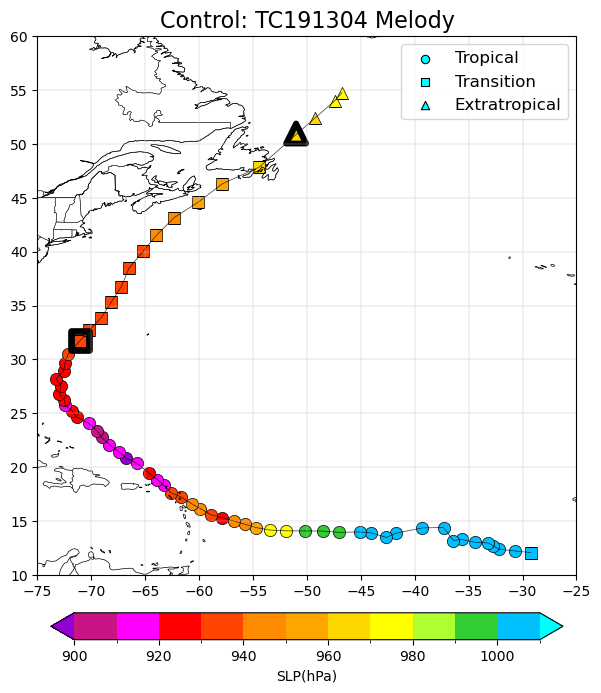

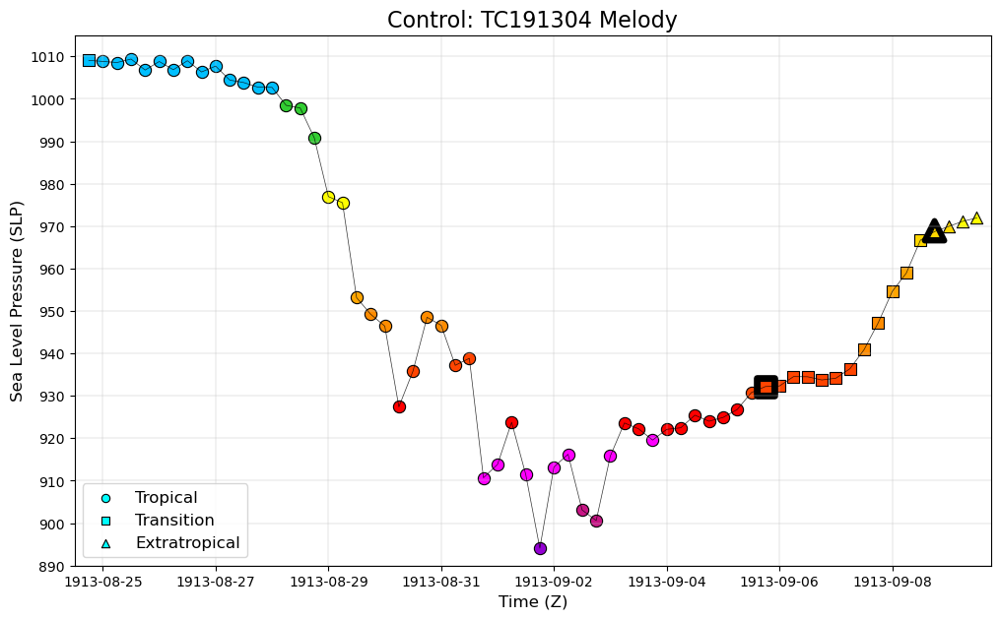

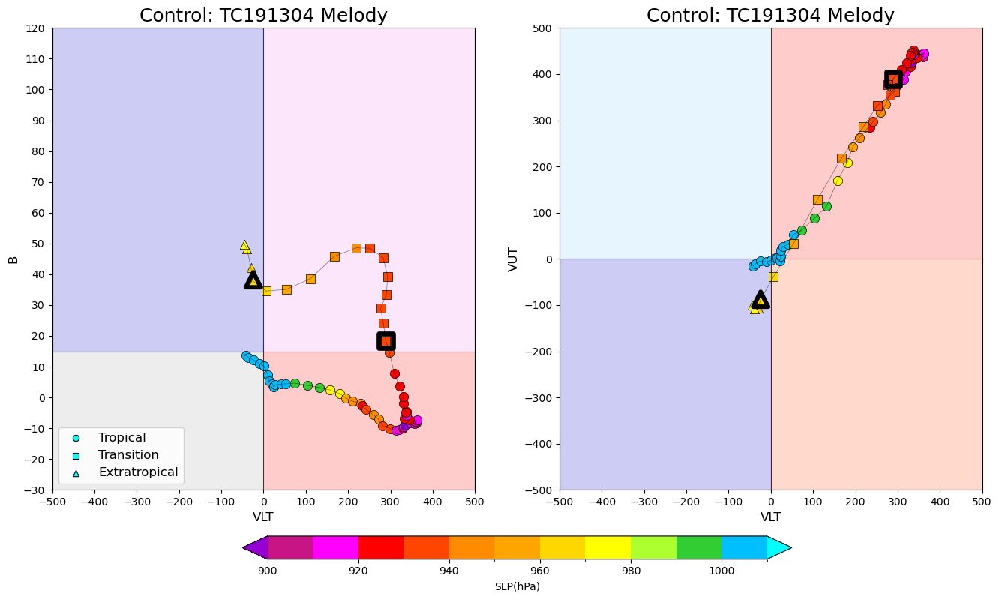

In [17]:
# Input Code
Code = 'TC191304'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 1, True, "Control", True, (7,7))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

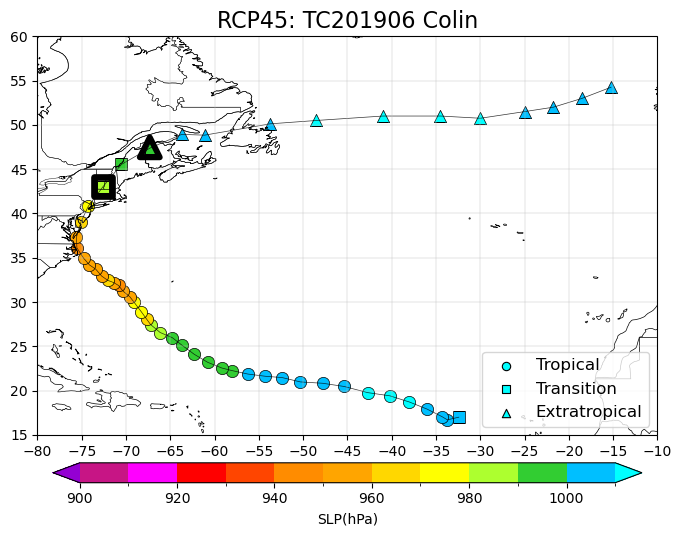

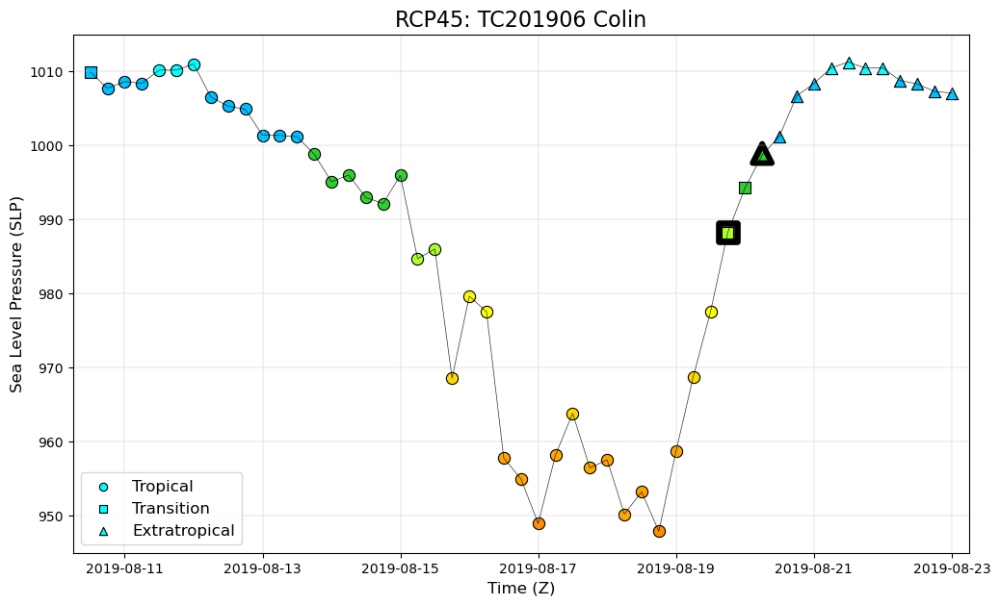

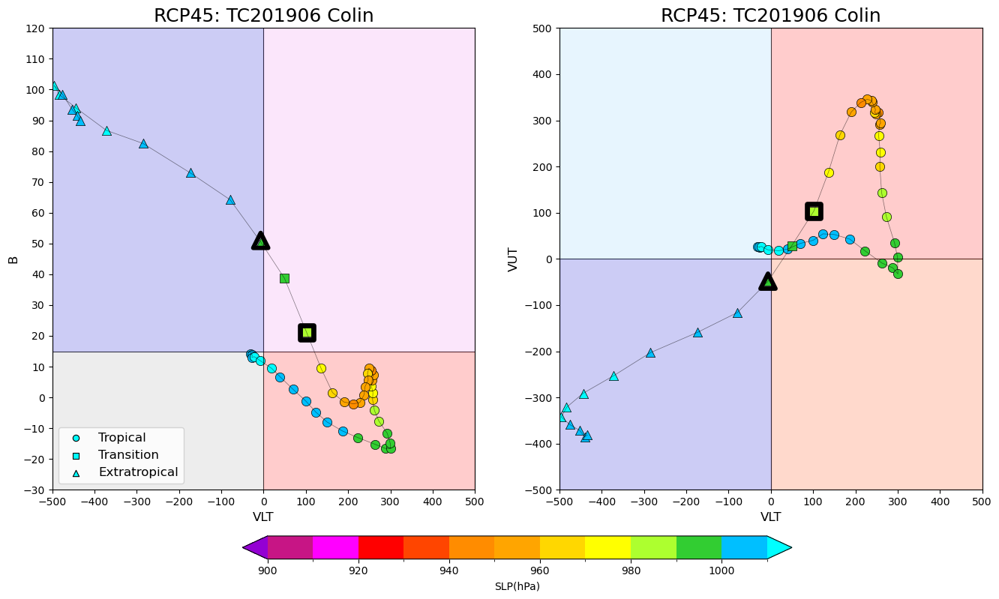

In [18]:
# Input Code
Code = 'TC201906'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 4, True, "RCP45", True, (8,7))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)

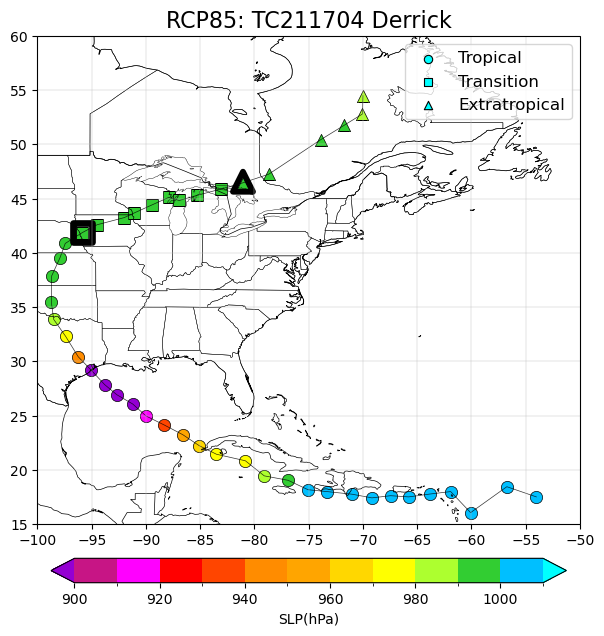

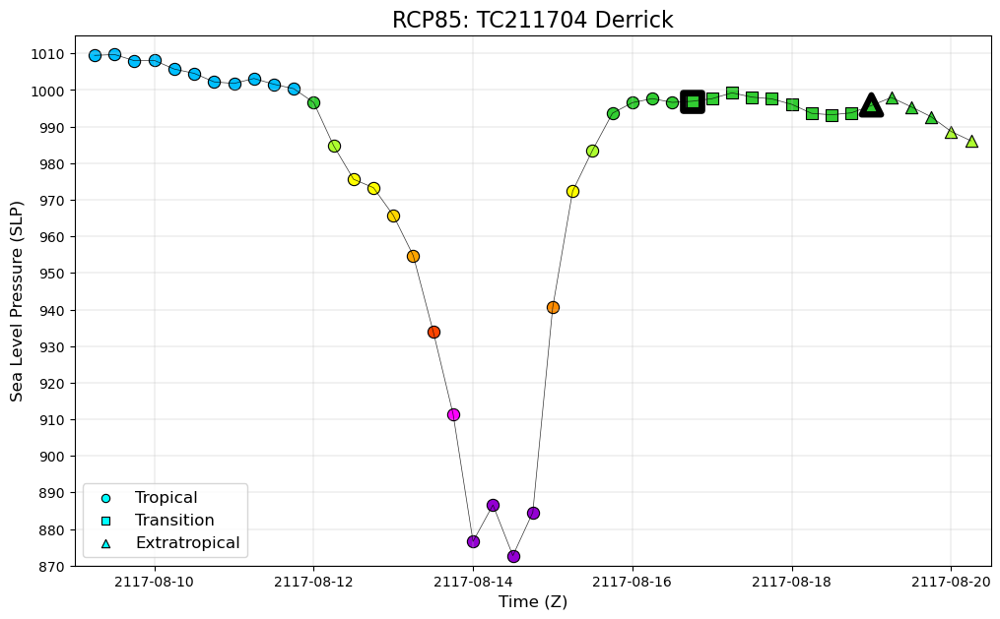

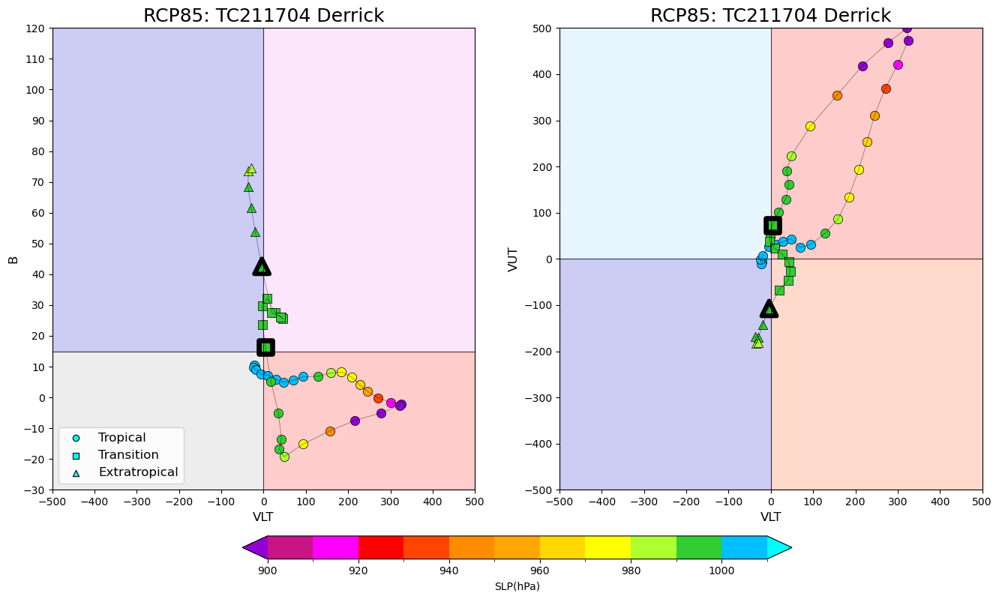

In [19]:
# Input Code
Code = 'TC211704'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 1, True, "RCP85", True, (7,7))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)

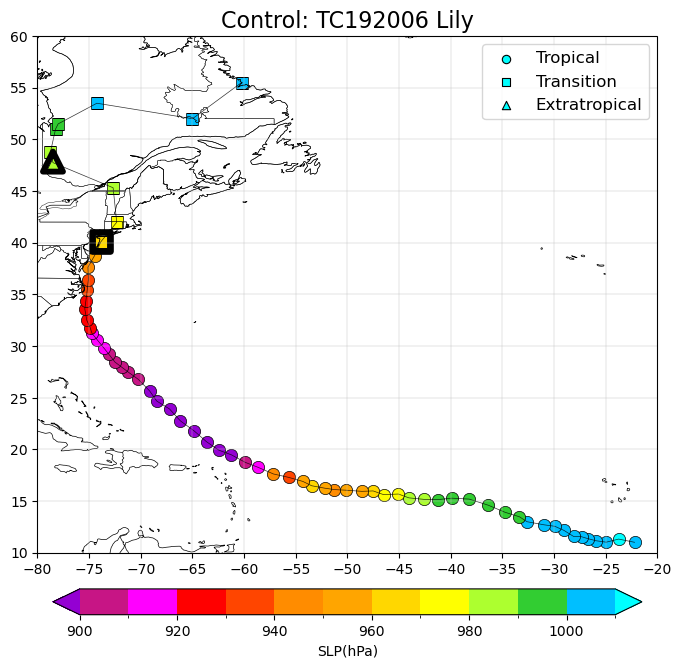

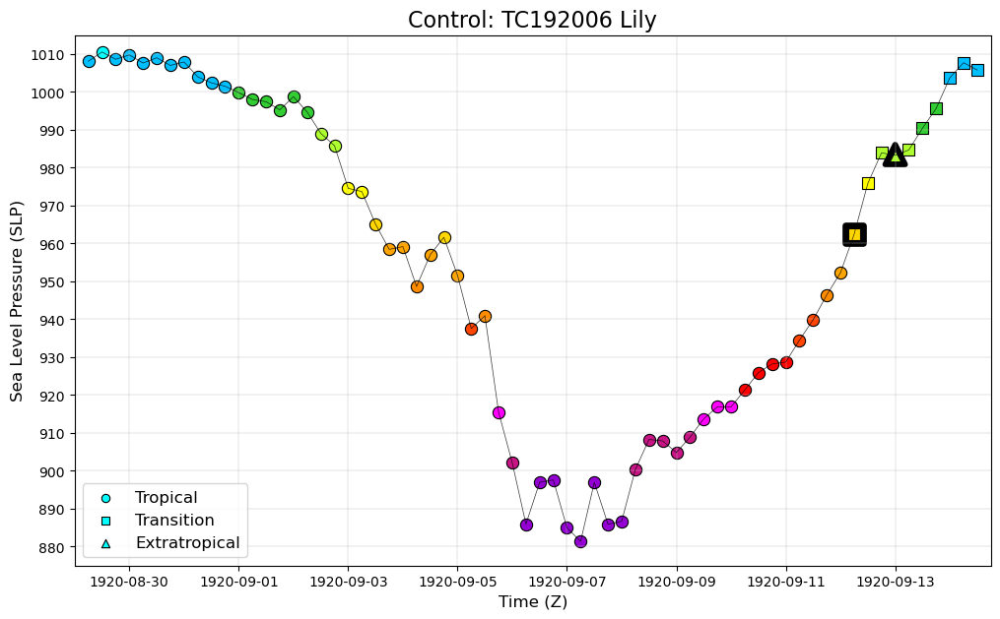

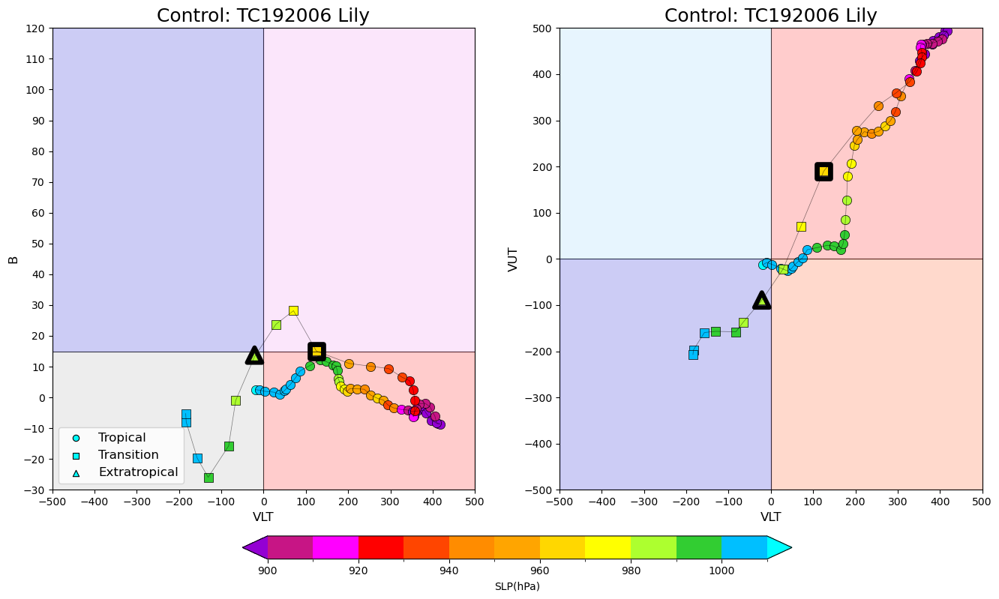

In [20]:
# Input Code
Code = 'TC192006'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 1, True, "Control", True, (8,7))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

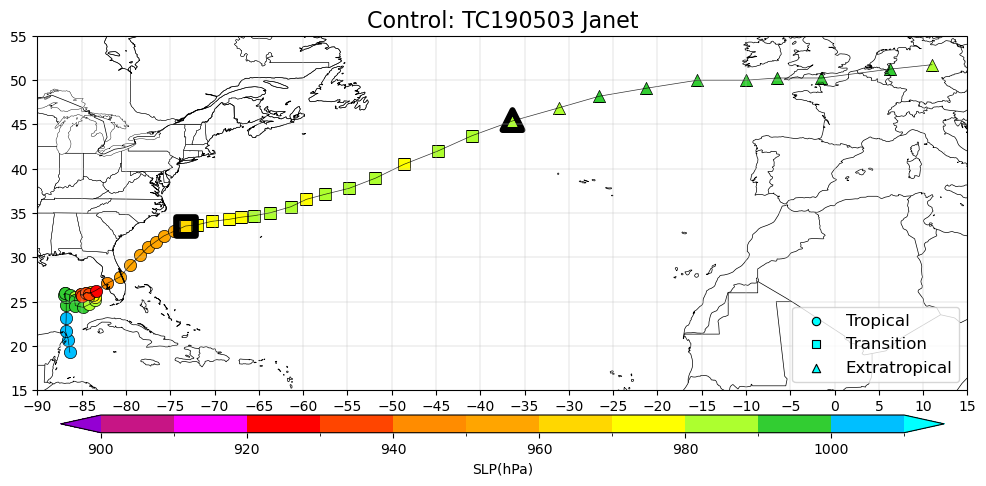

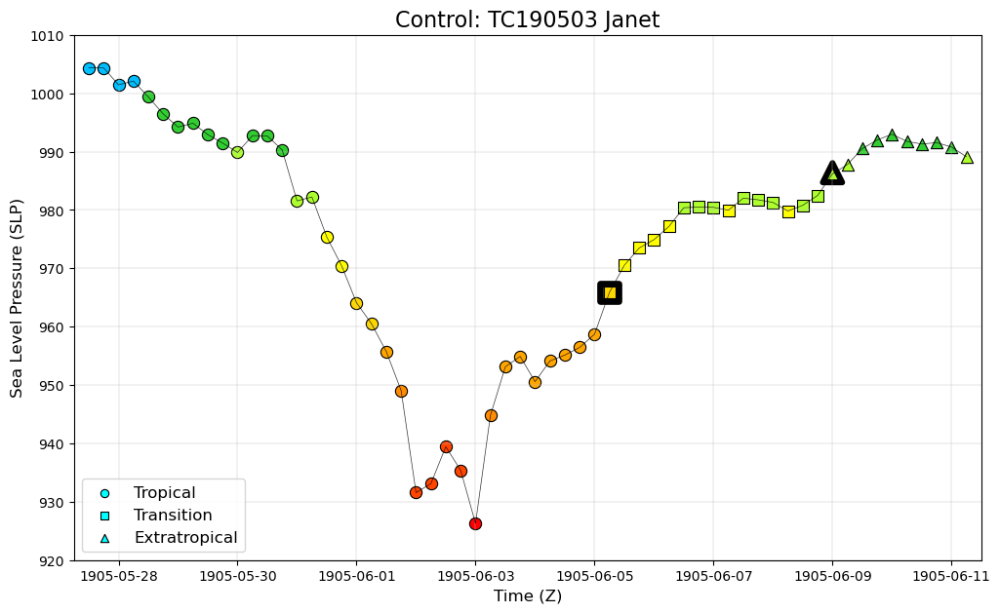

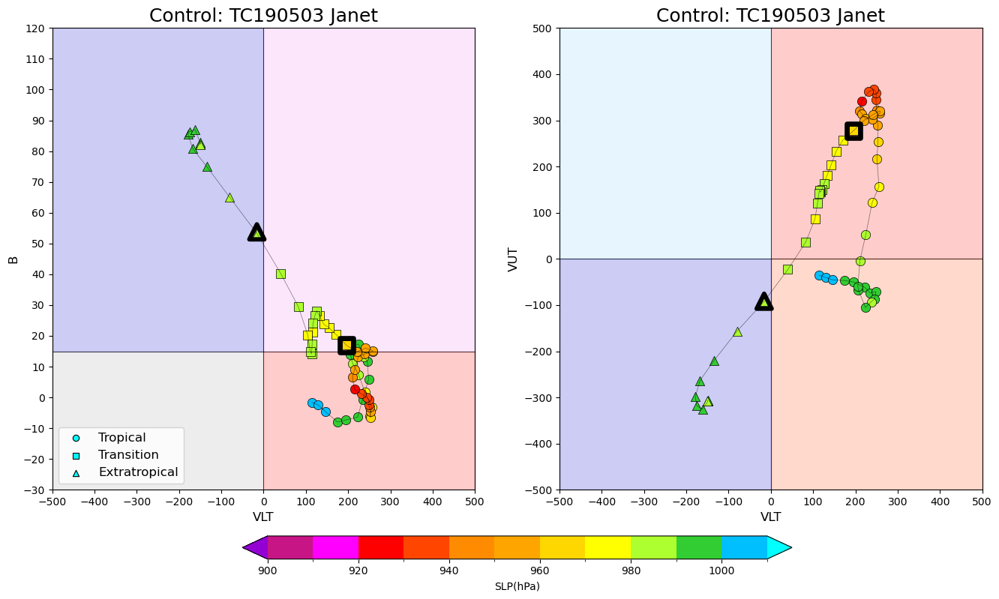

In [21]:
# Input Code
Code = 'TC190503'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 4, True, "Control", True, (12,5))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

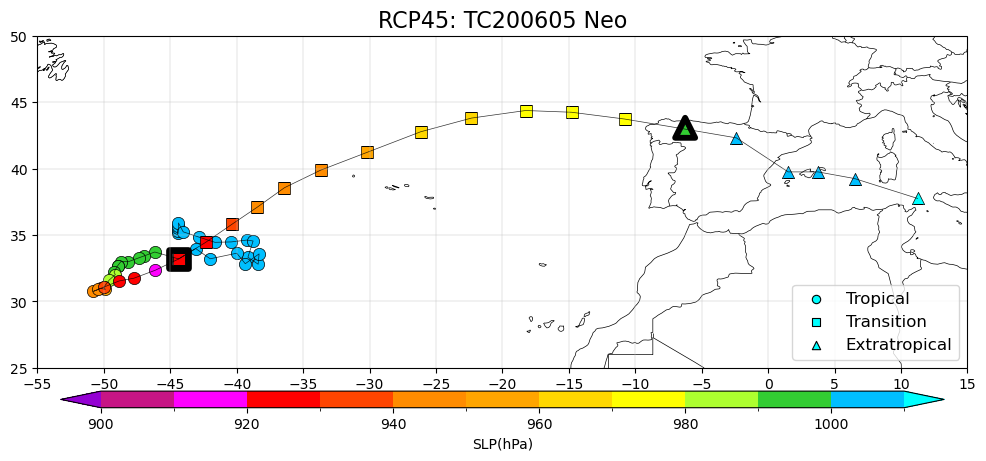

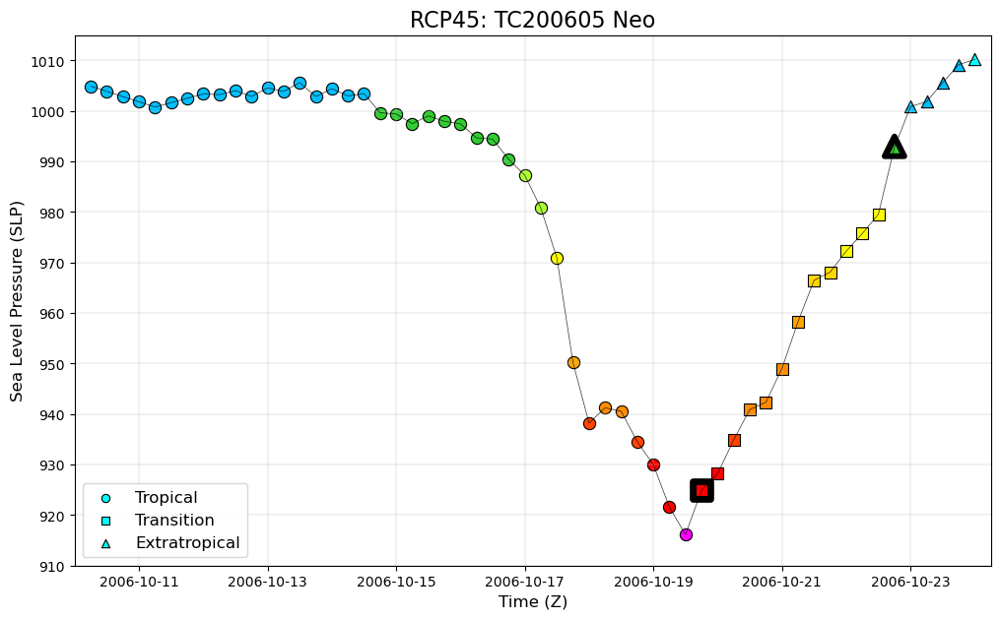

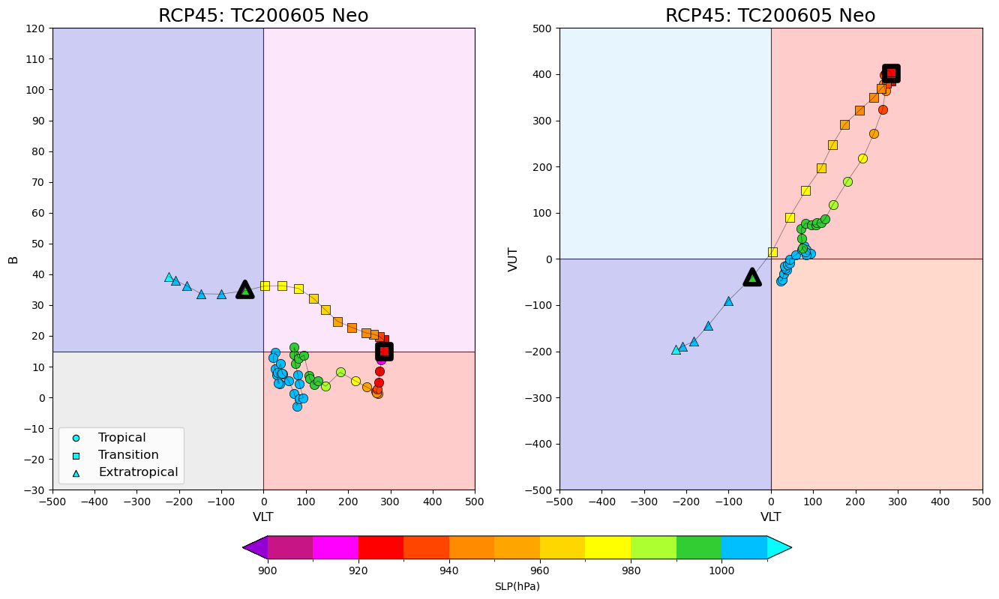

In [22]:
# Input Code
Code = 'TC200605'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 4, True, "RCP45", True, (12,5))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)

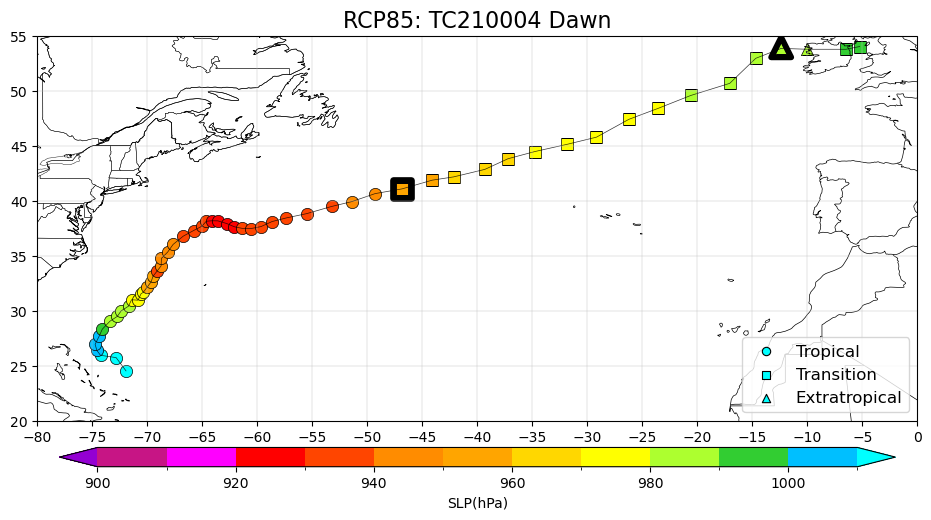

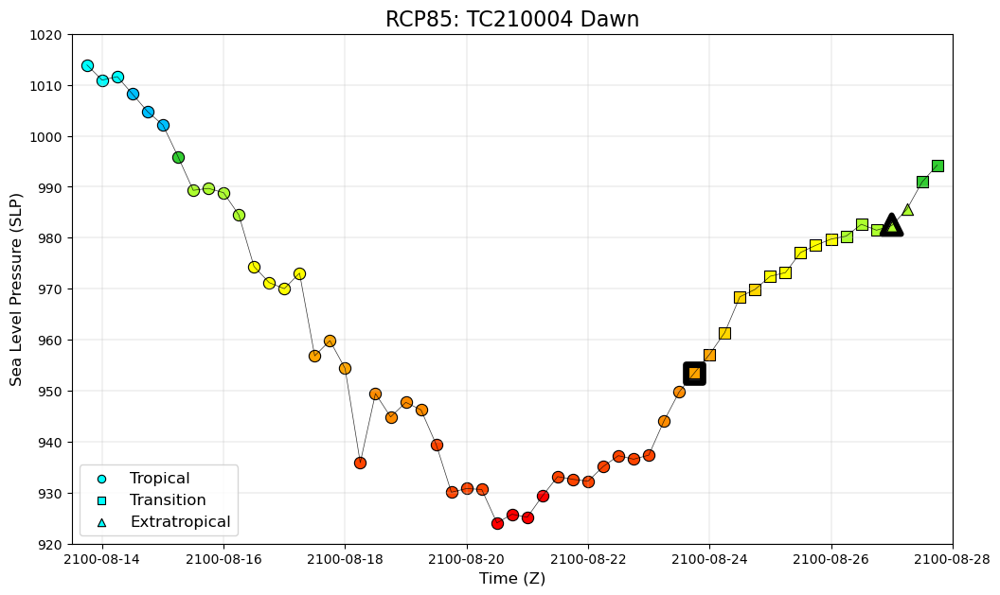

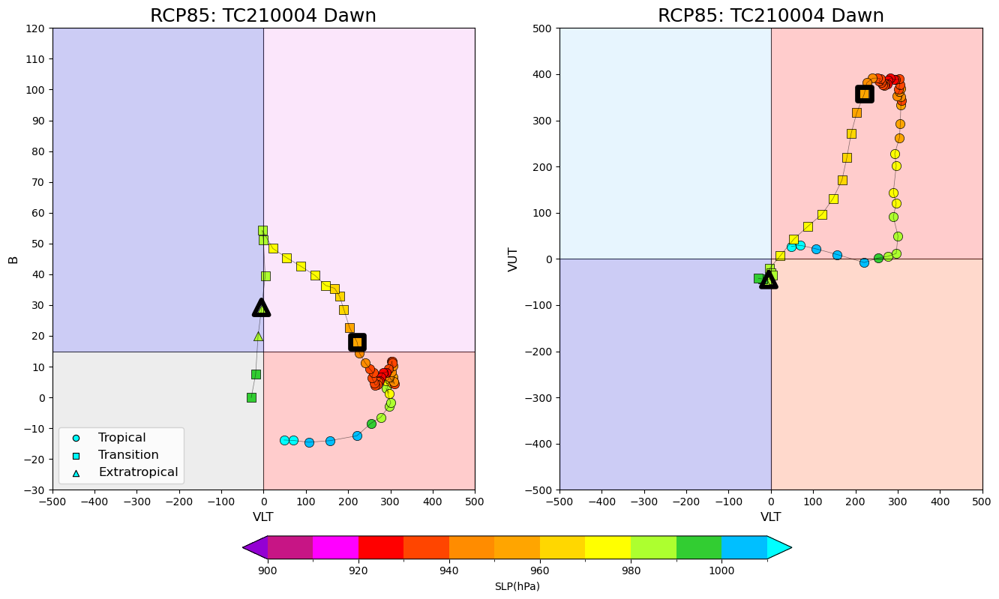

In [23]:
# Input Code
Code = 'TC210004'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 4, True, "RCP85", True, (12,5))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)

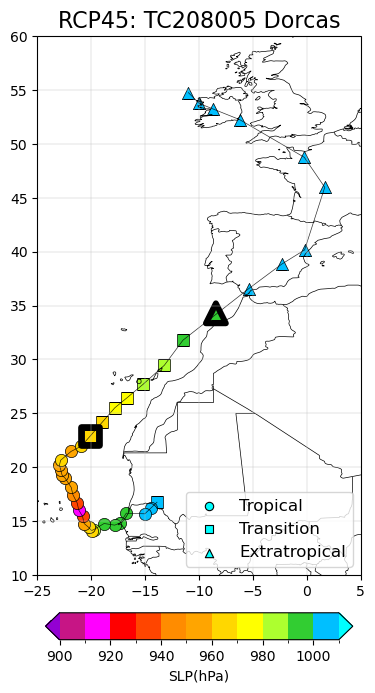

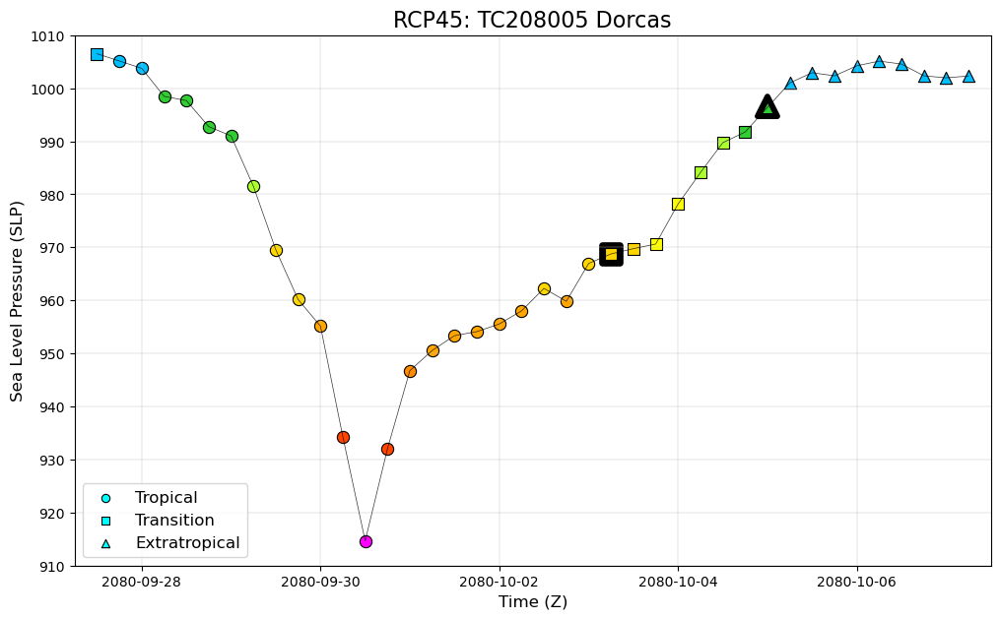

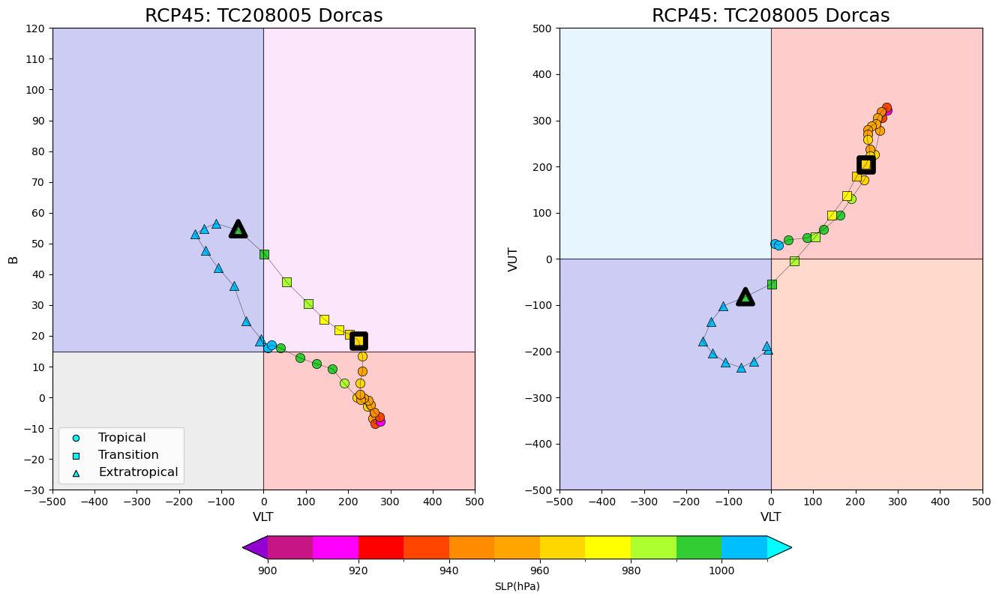

In [24]:
# Input Code
Code = 'TC208005'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 4, True, "RCP45", True, (5,7))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)

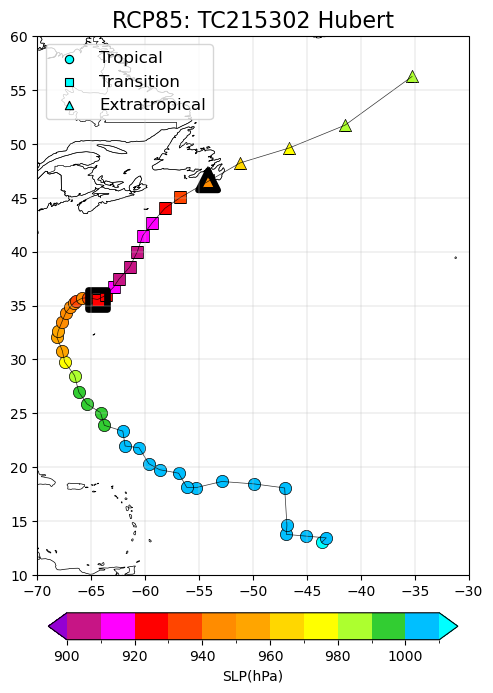

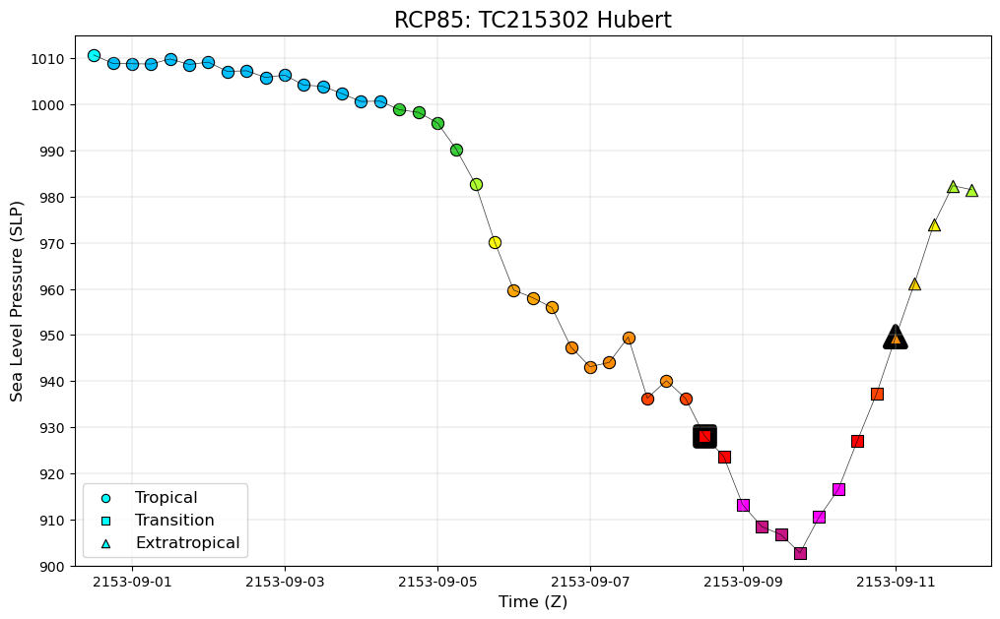

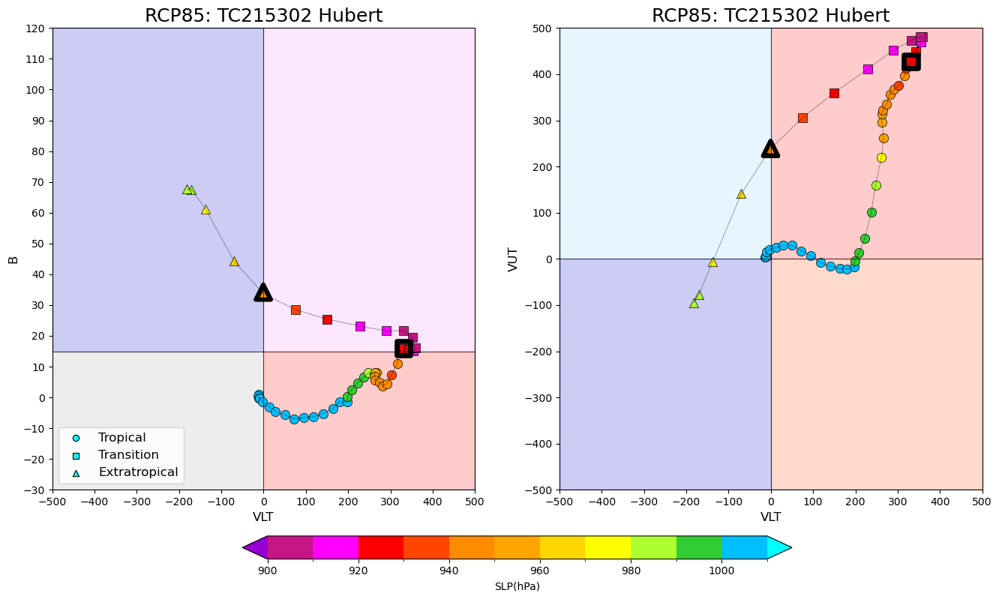

In [25]:
# Input Code
Code = 'TC215302'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP85", True, (6,7))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)

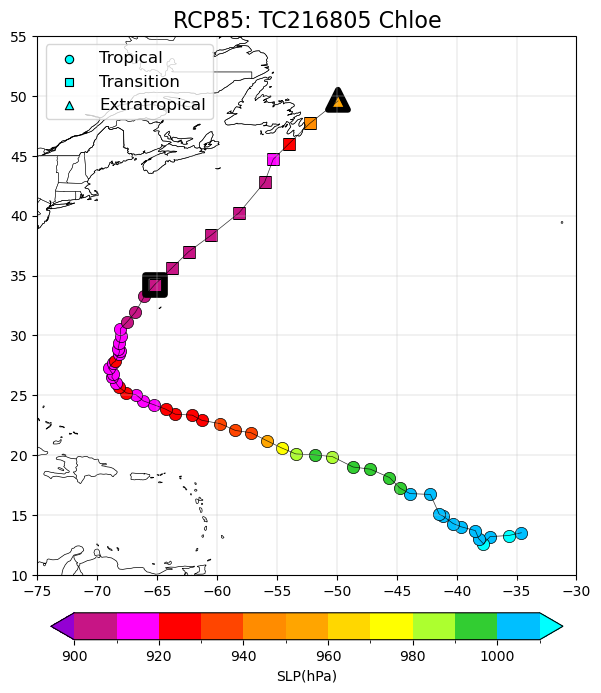

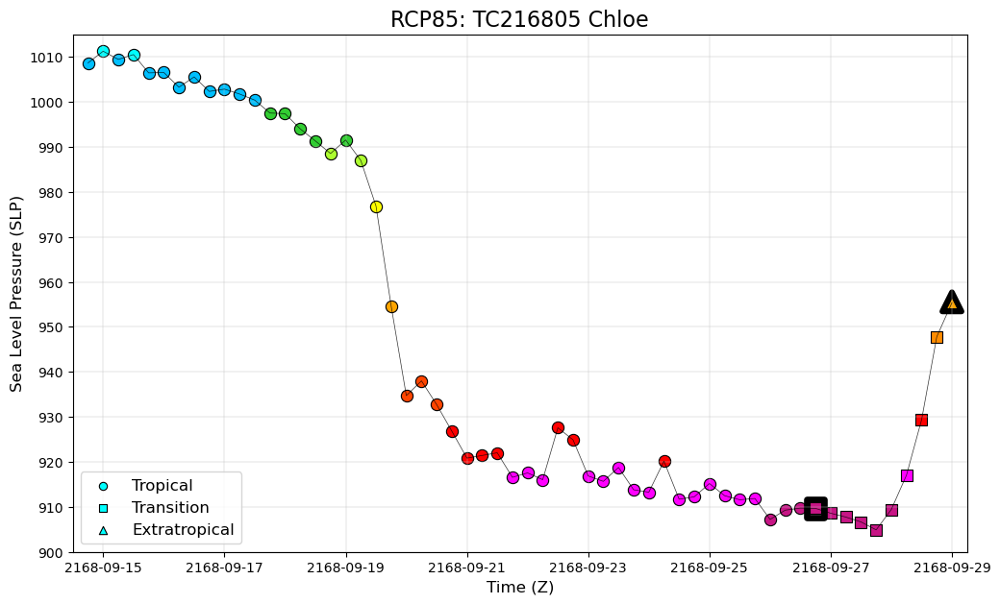

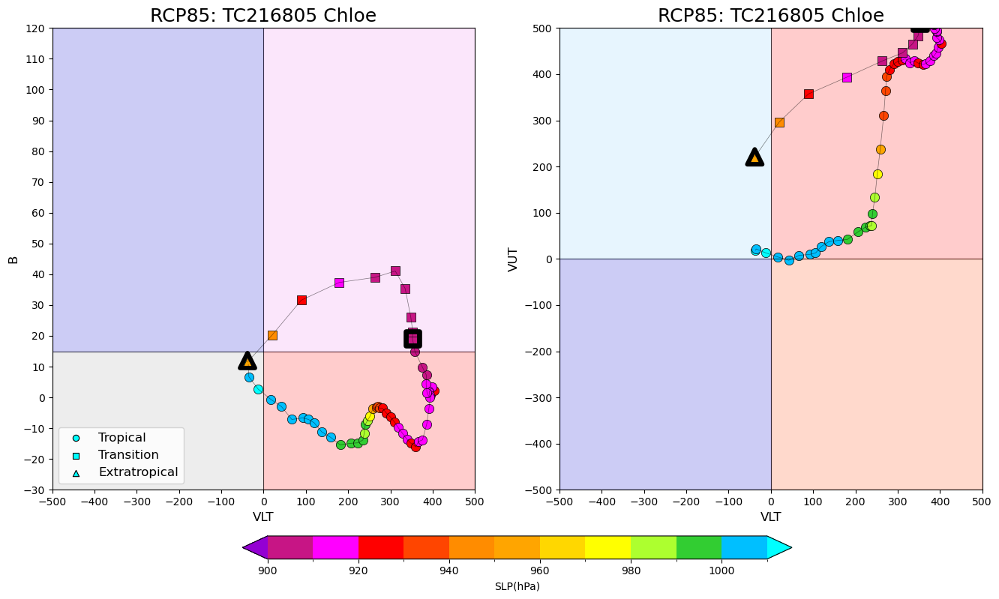

In [26]:
# Input Code
Code = 'TC216805'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP85", True, (7,7))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)

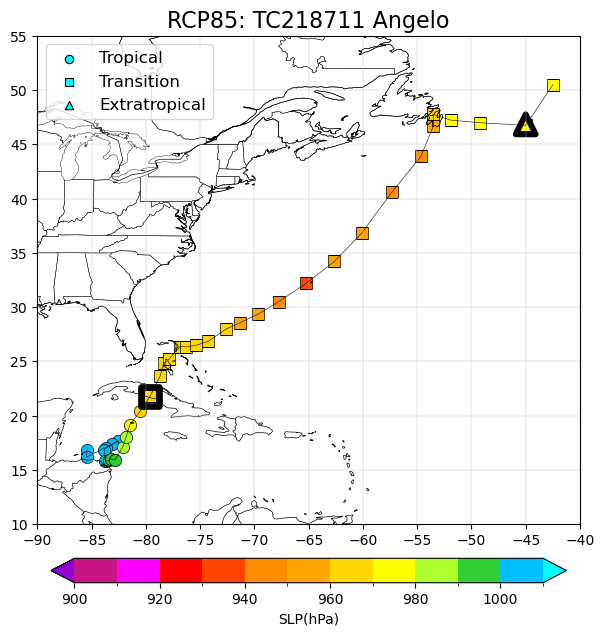

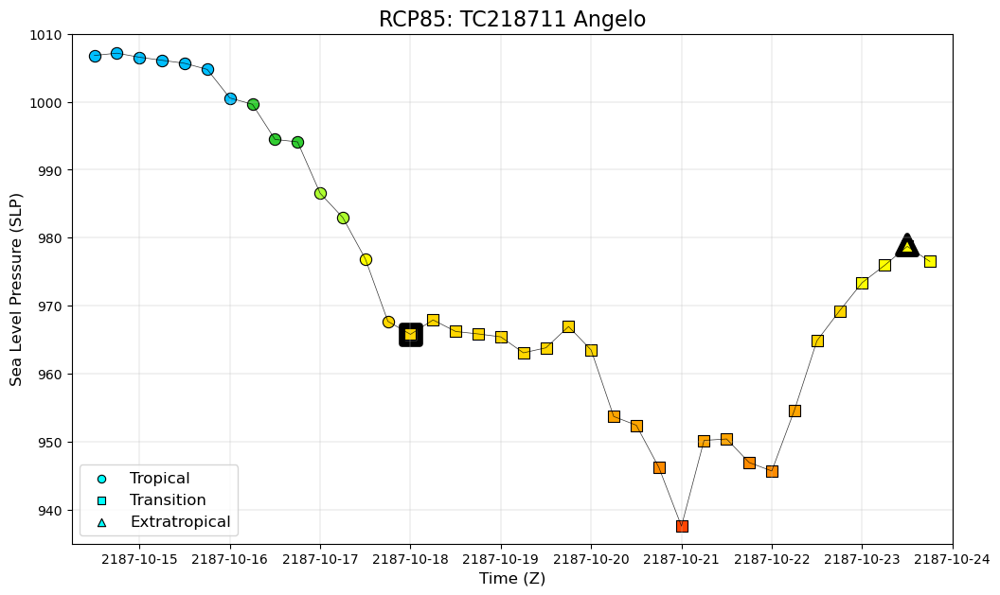

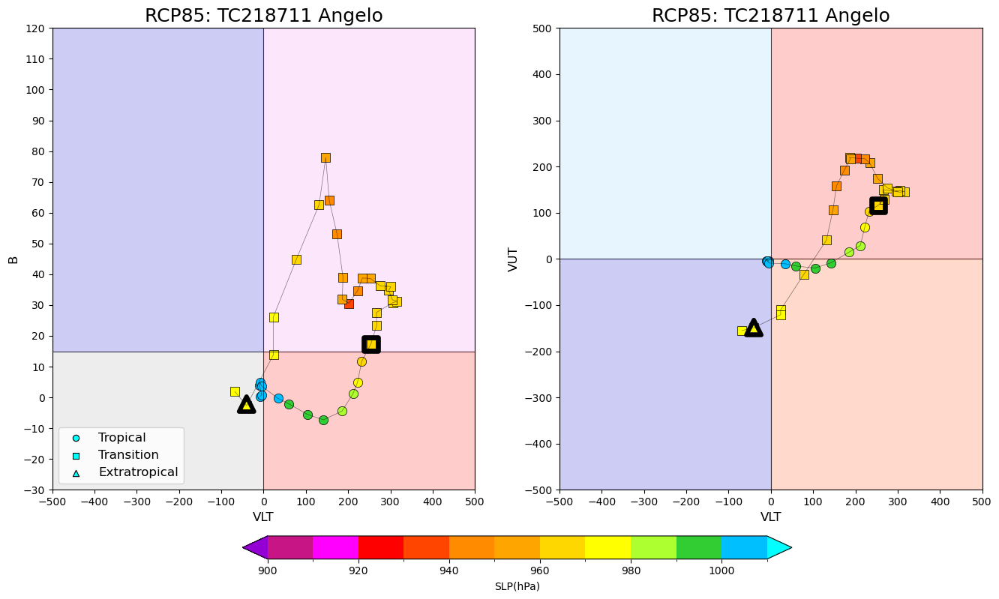

In [27]:
# Input Code
Code = 'TC218711'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP85", True, (7,7))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)

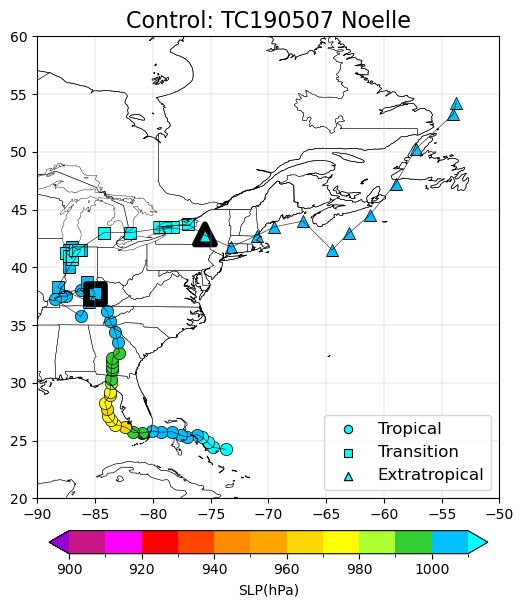

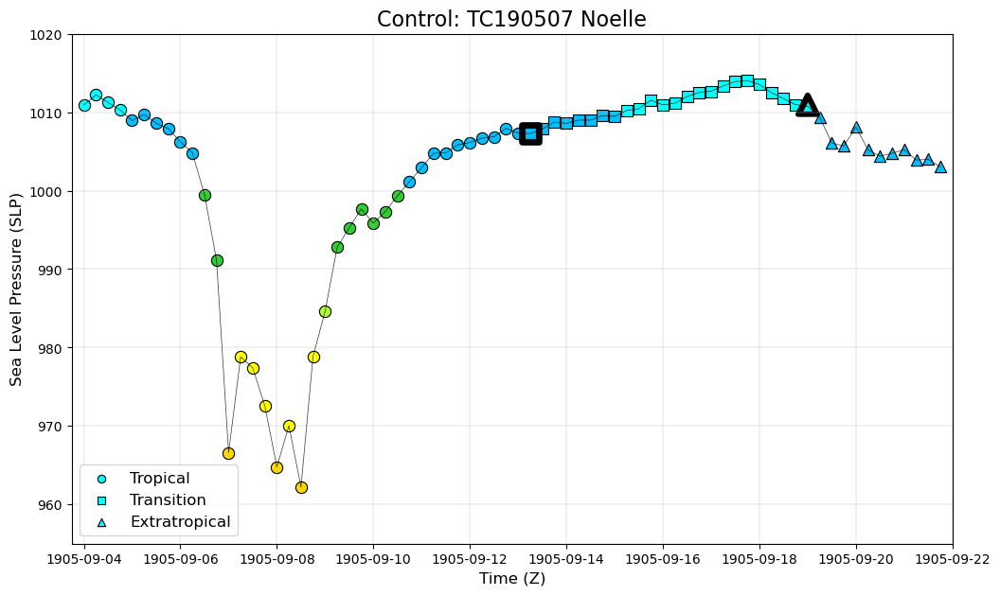

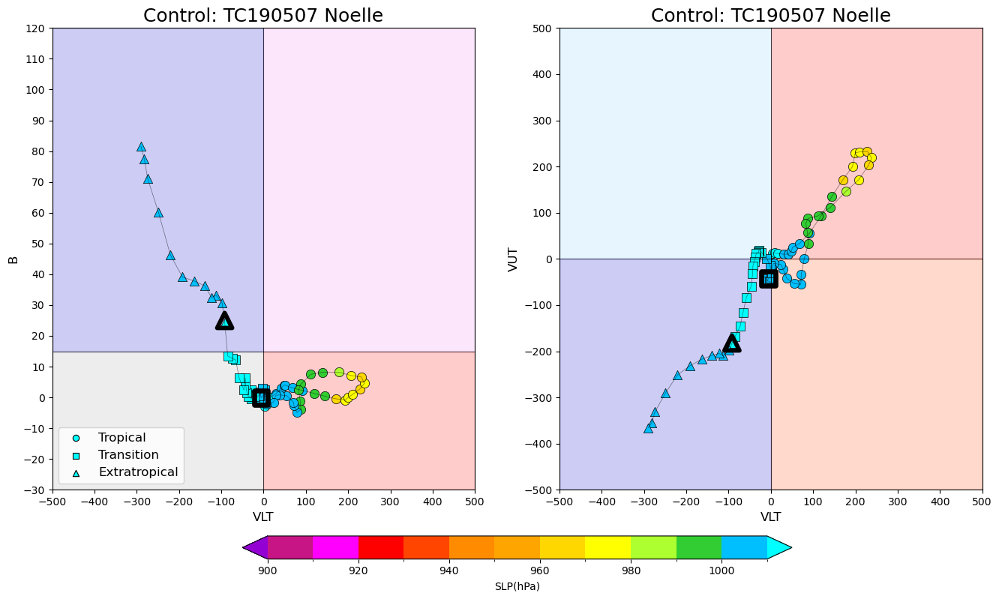

In [28]:
# Input Code
Code = 'TC190507'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 4, True, "Control", True, (6,6))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

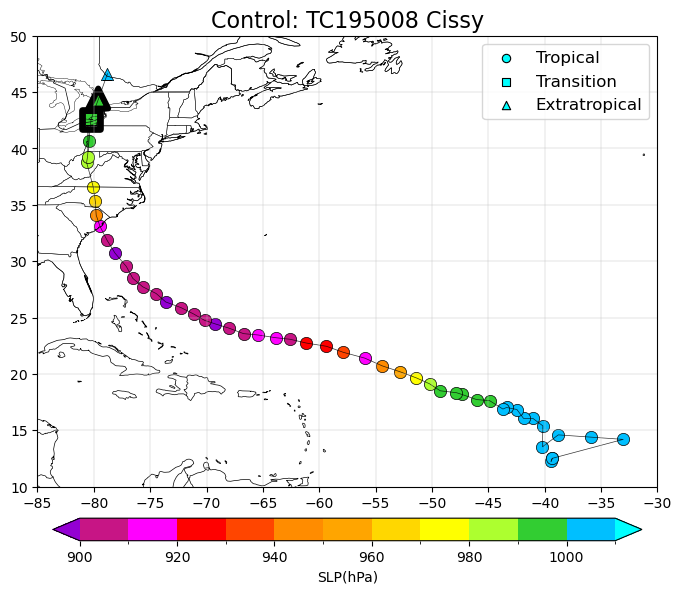

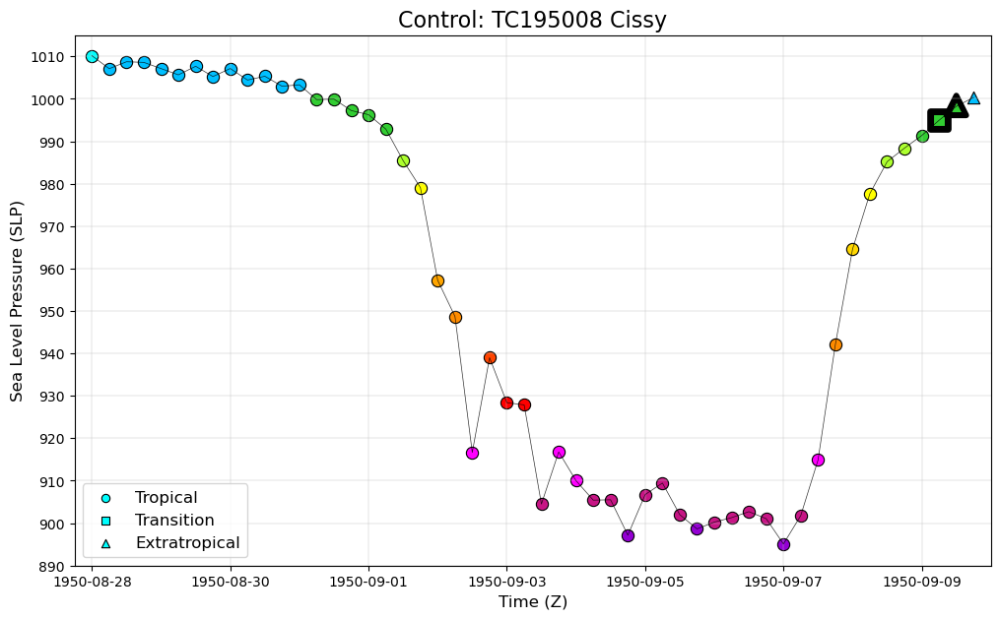

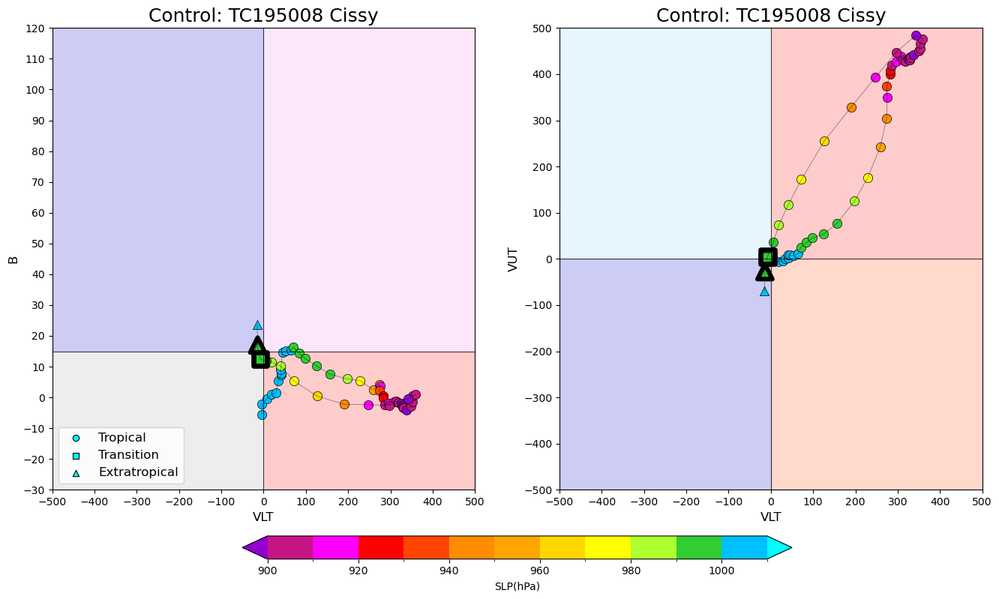

In [29]:
# Input Code
Code = 'TC195008'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 1, True, "Control", True, (8,6))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

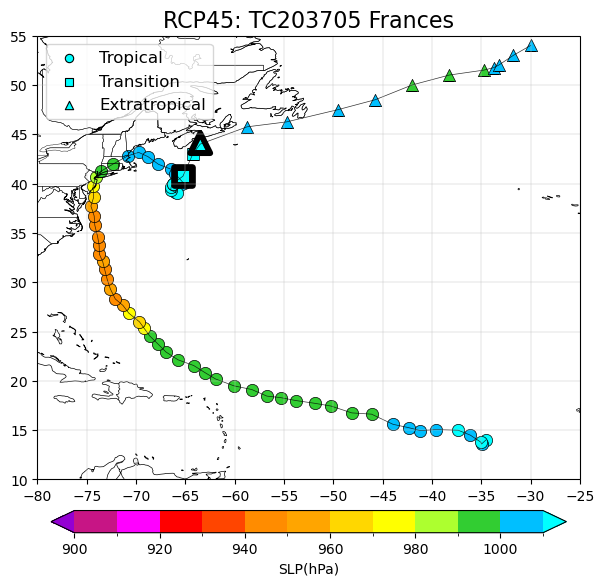

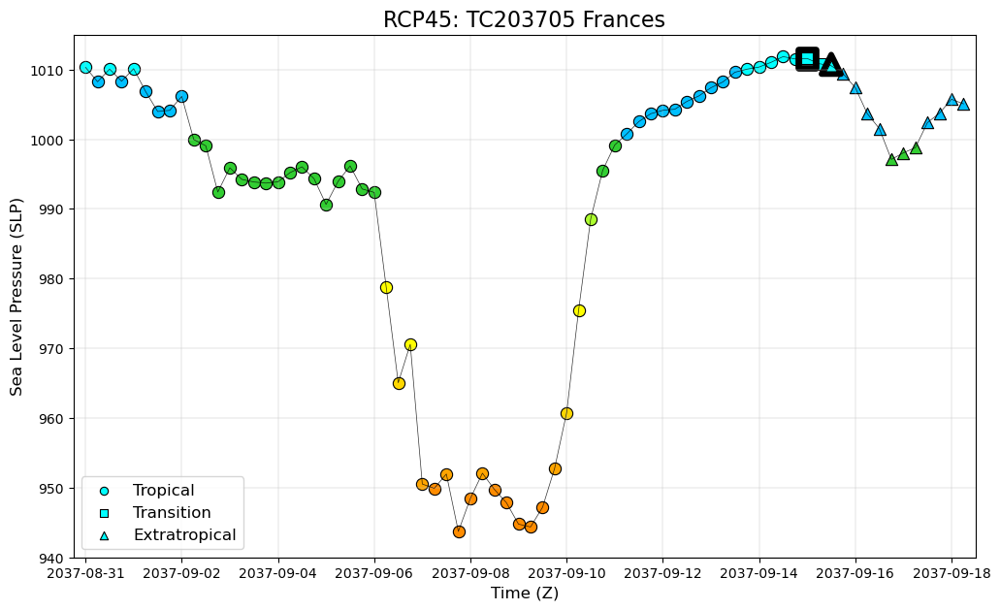

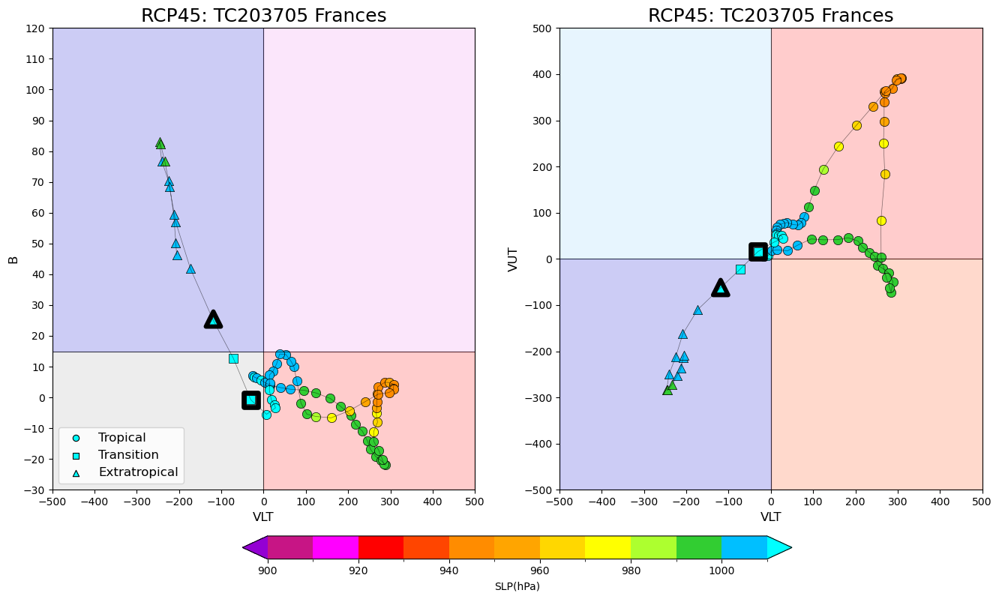

In [30]:
# Input Code
Code = 'TC203705'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP45", True, (7,7))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)

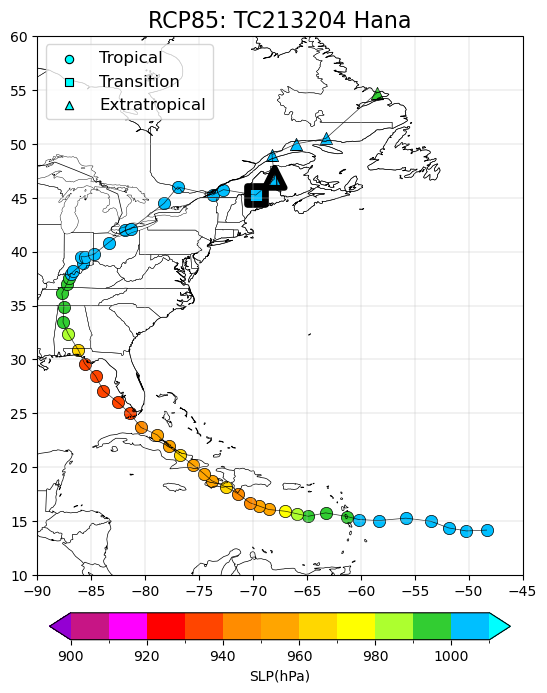

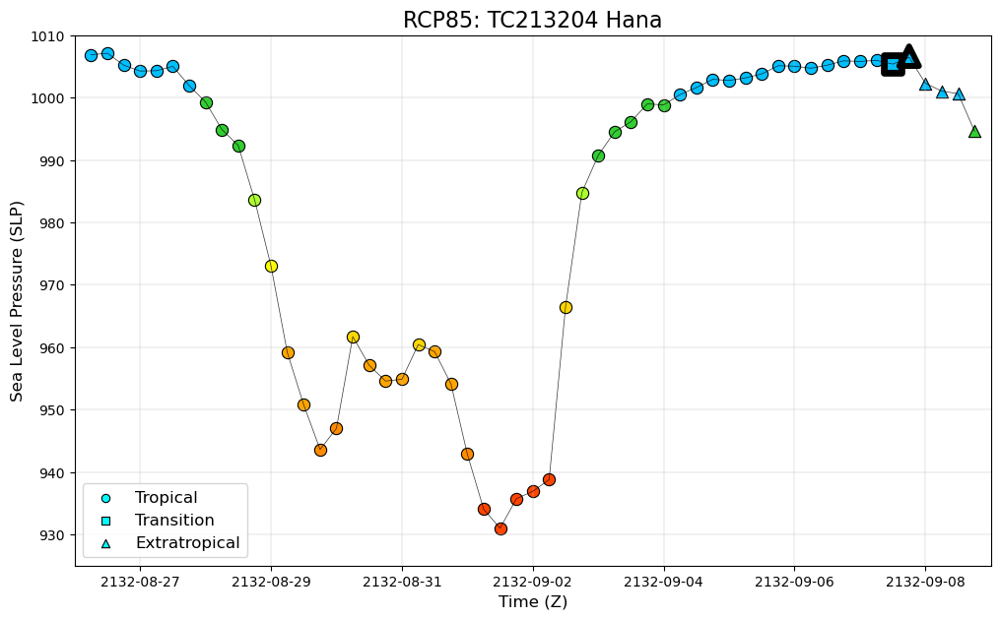

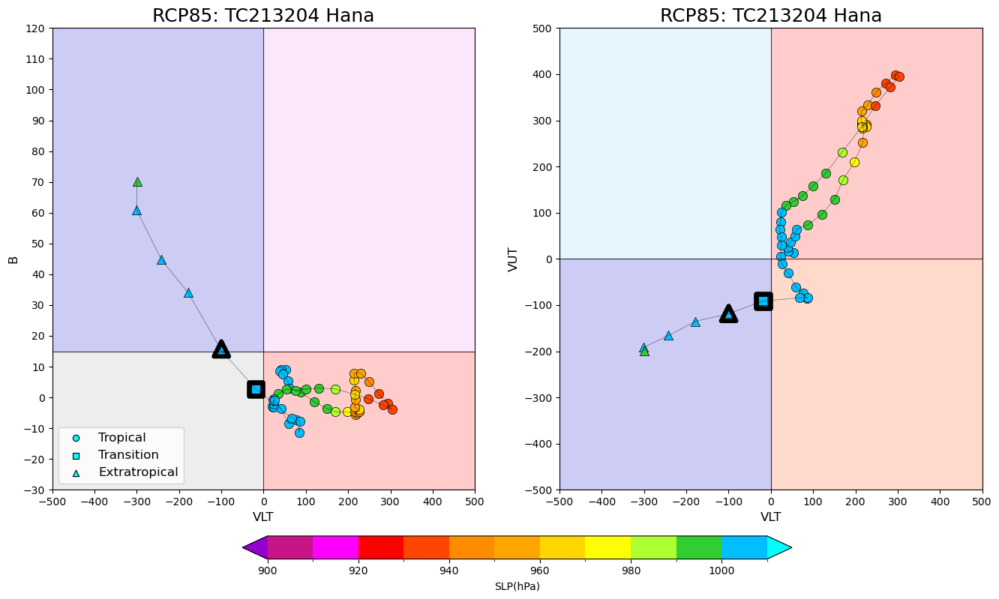

In [31]:
# Input Code
Code = 'TC213204'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP85", True, (7,7))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)

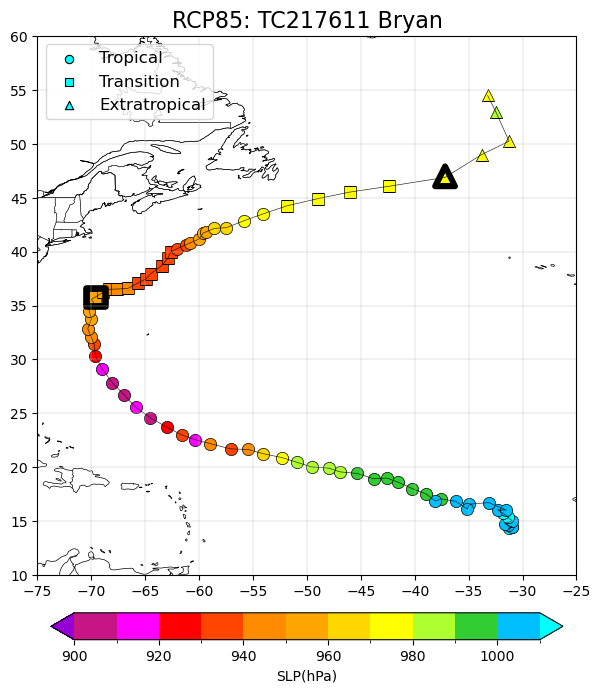

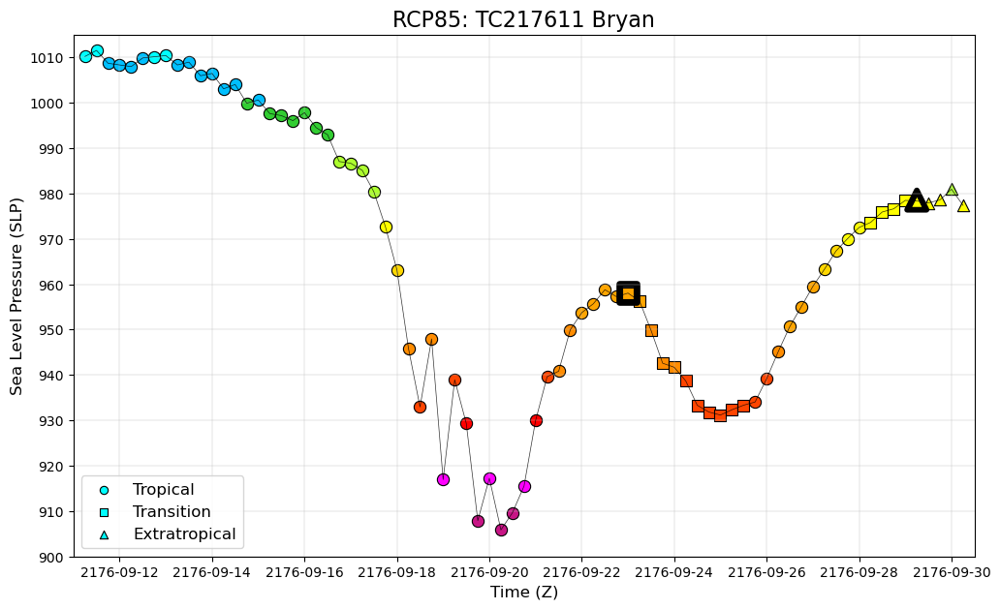

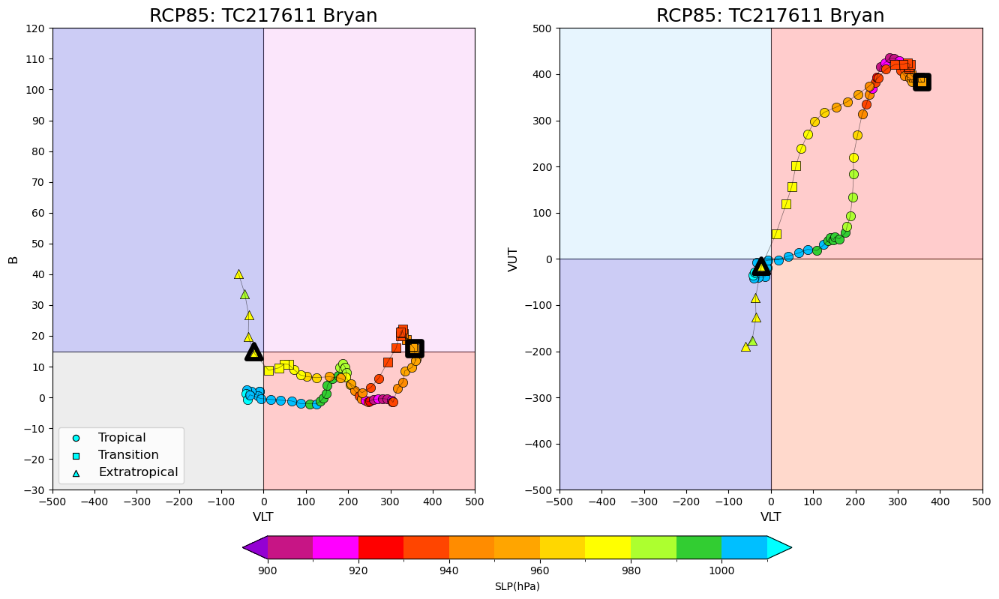

In [32]:
# Input Code
Code = 'TC217611'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP85", True, (7,7))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)

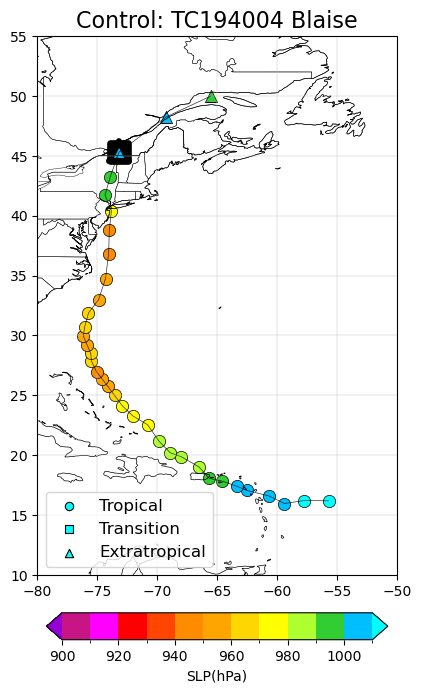

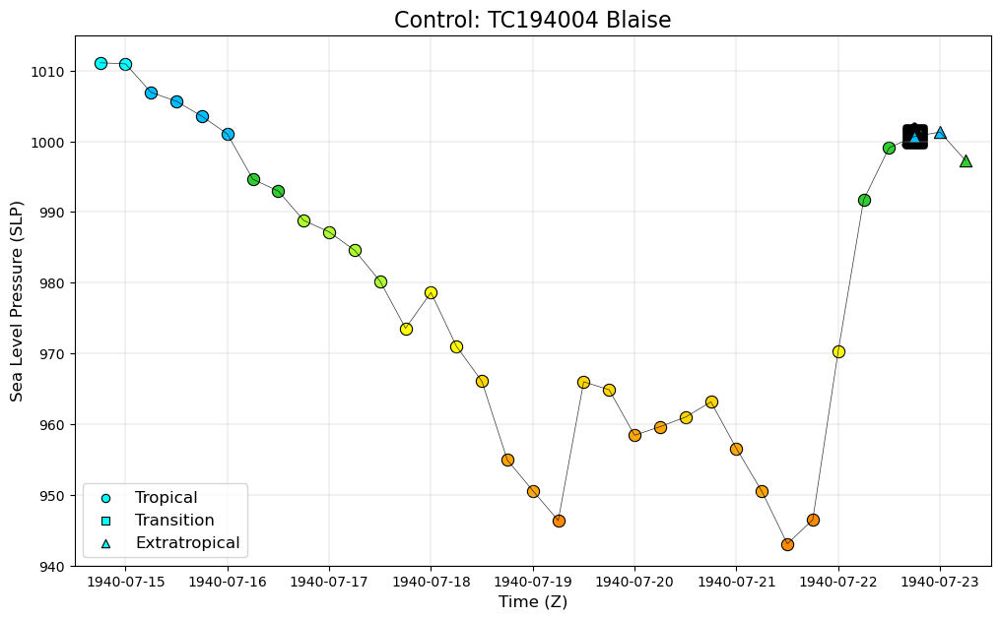

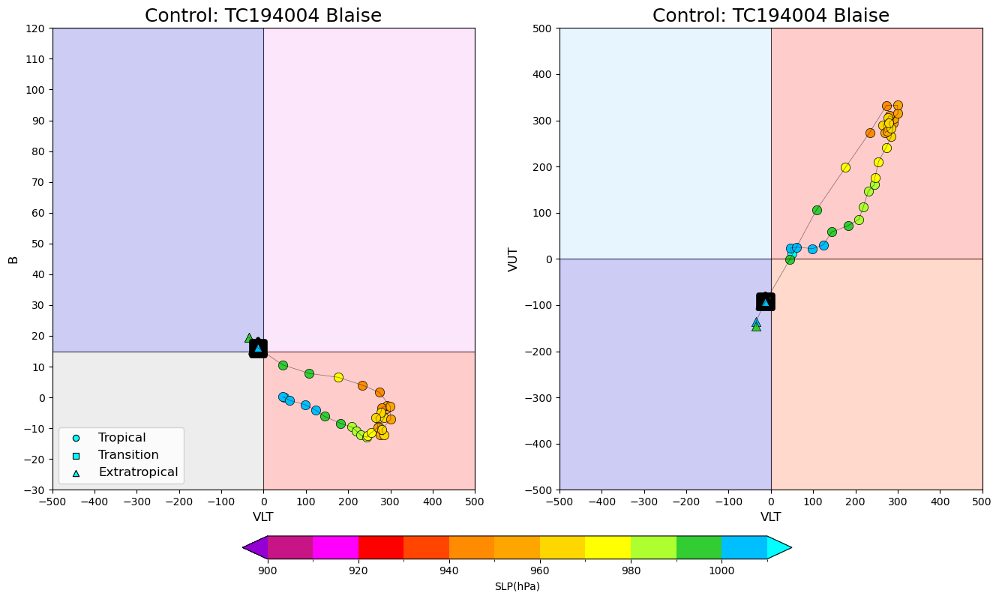

In [33]:
# Input Code
Code = 'TC194004'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True, (5,7))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

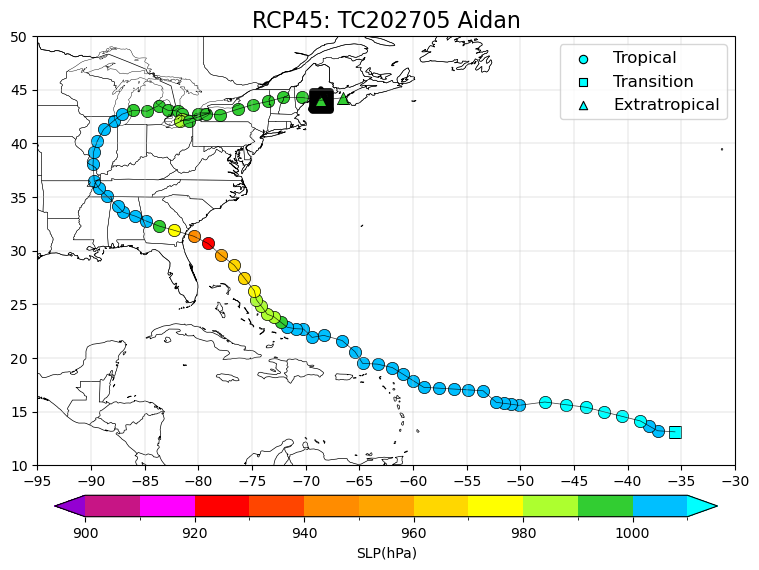

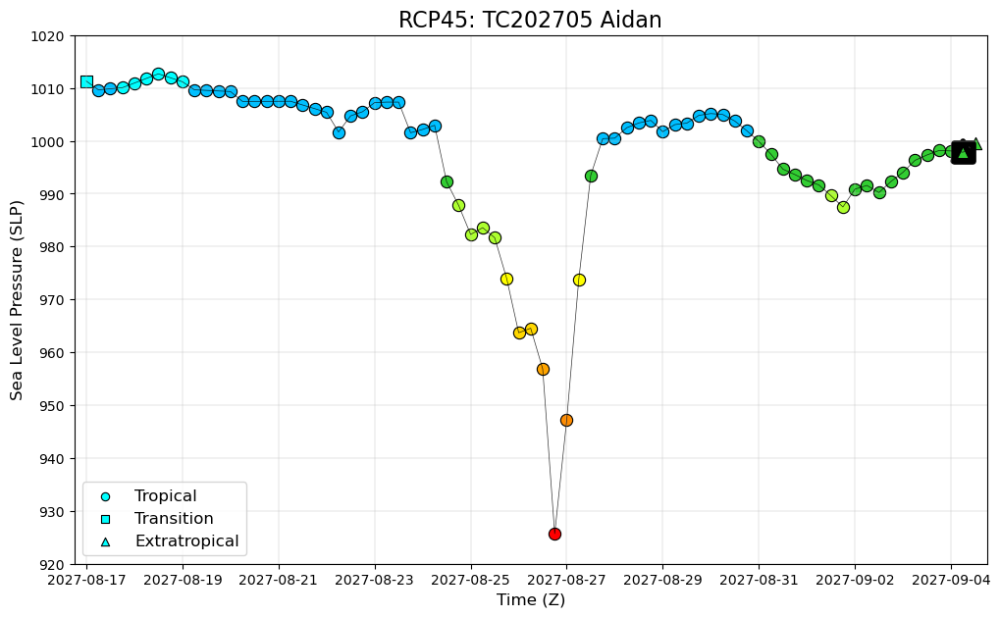

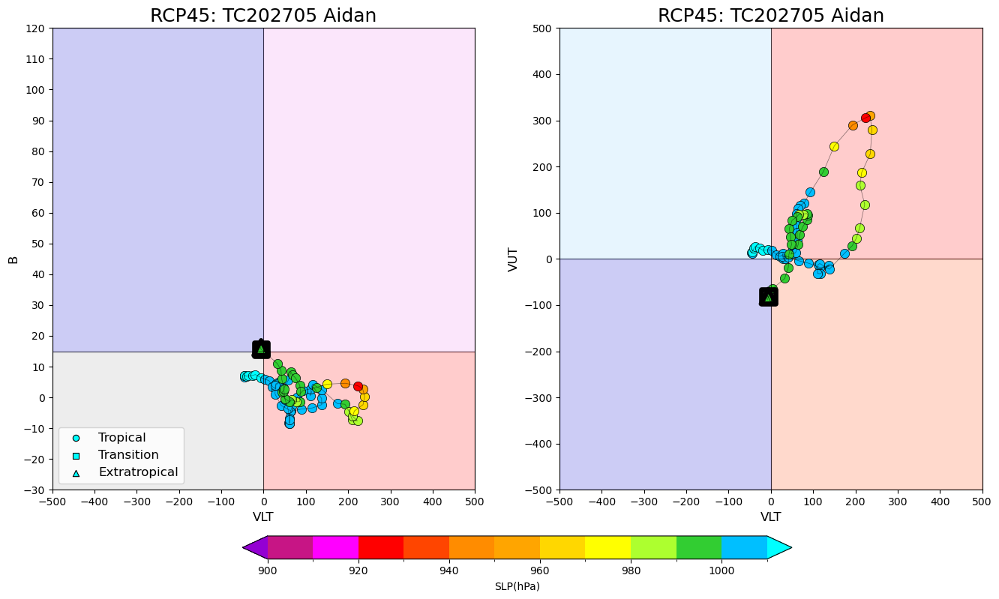

In [34]:
# Input Code
Code = 'TC202705'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 1, True, "RCP45", True, (9,6))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)

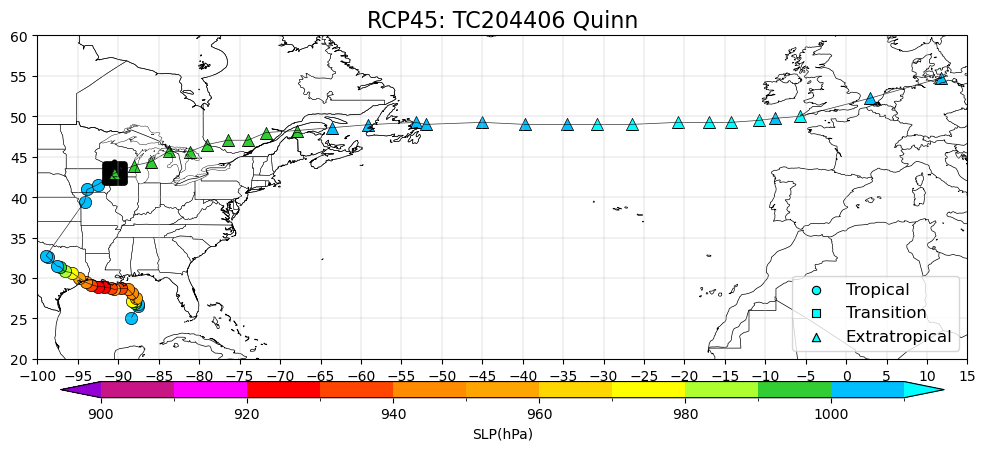

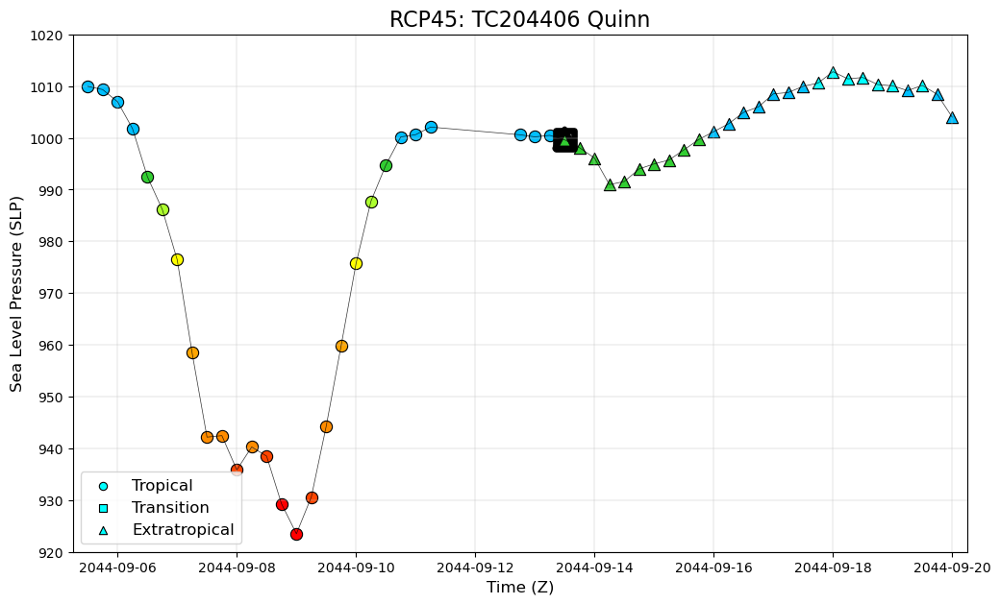

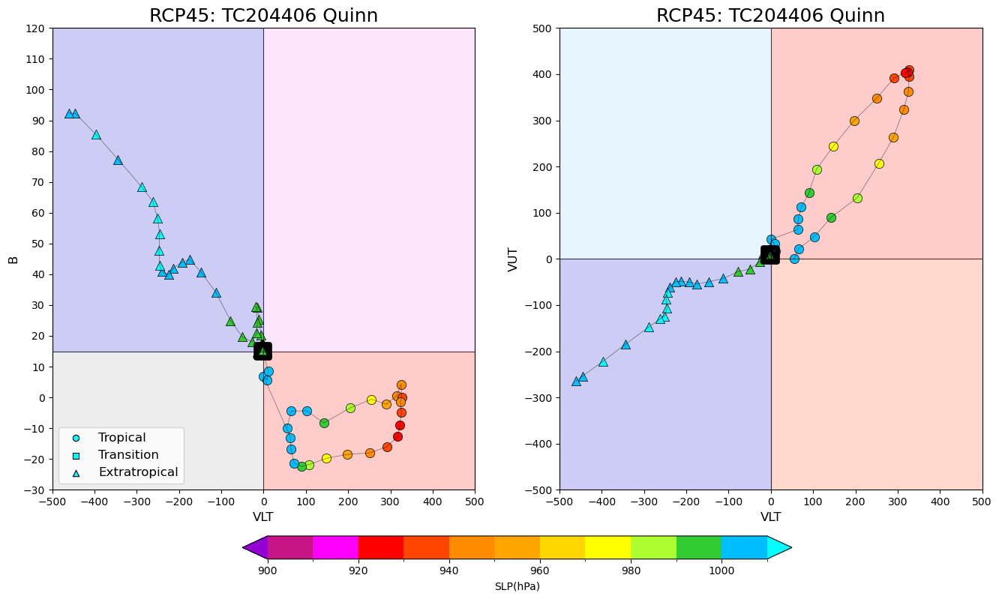

In [35]:
# Input Code
Code = 'TC204406'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 4, True, "RCP45", True, (12,5))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)

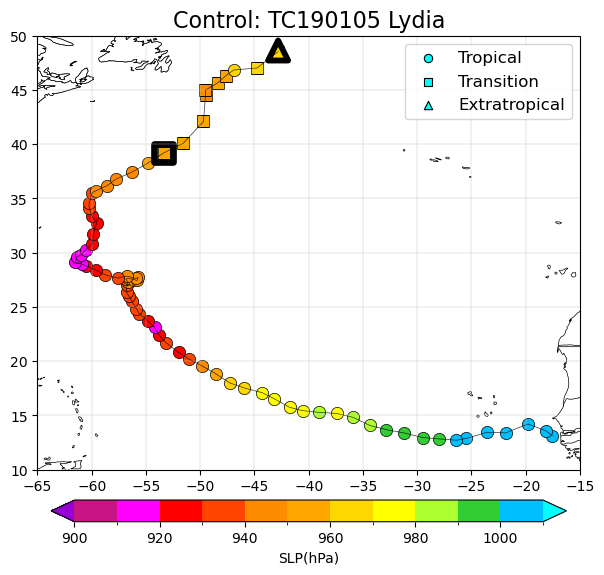

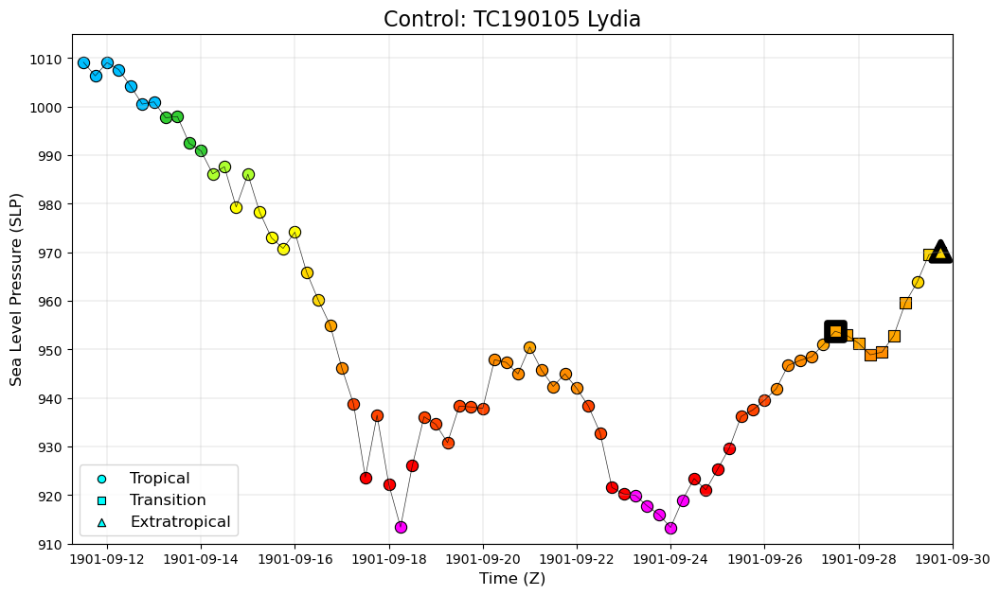

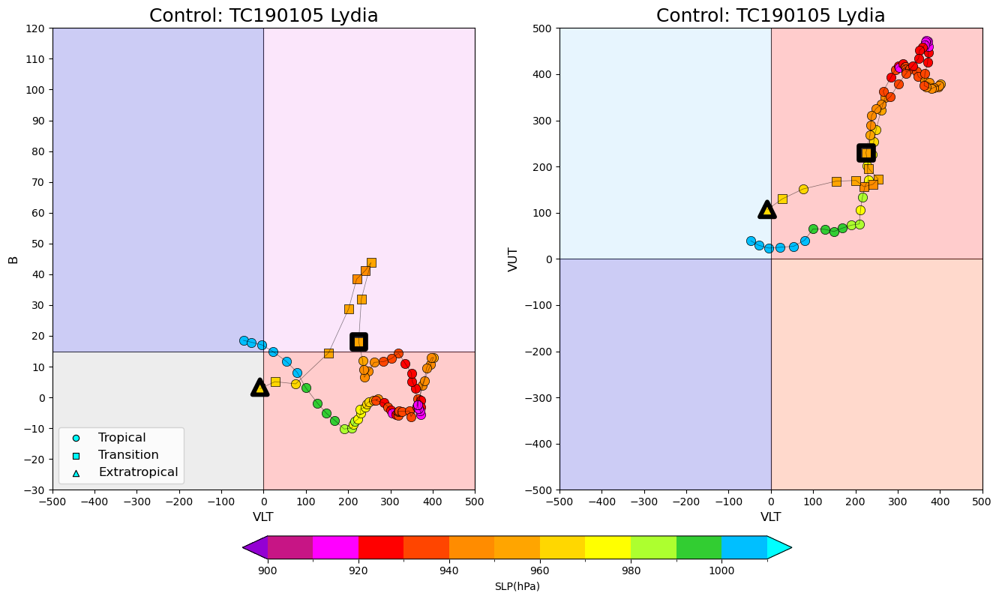

In [36]:
# Input Code
Code = 'TC190105'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 1, True, "Control", True, (7,7))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

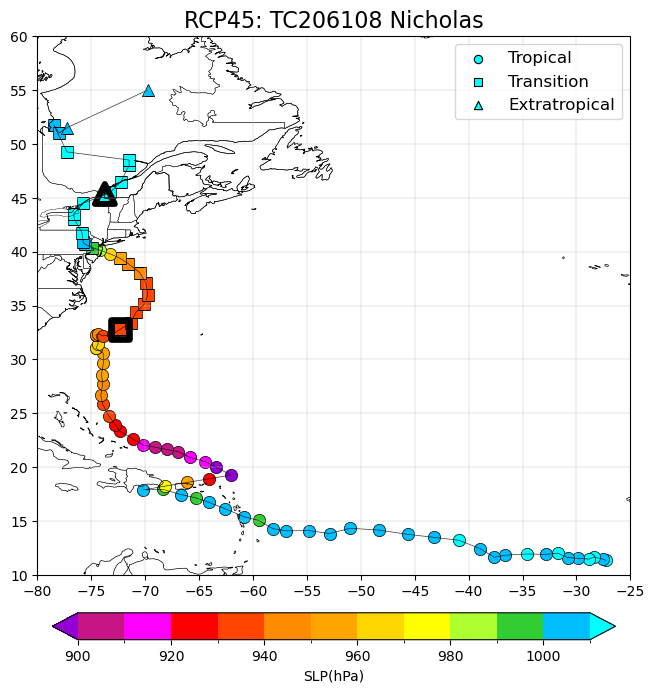

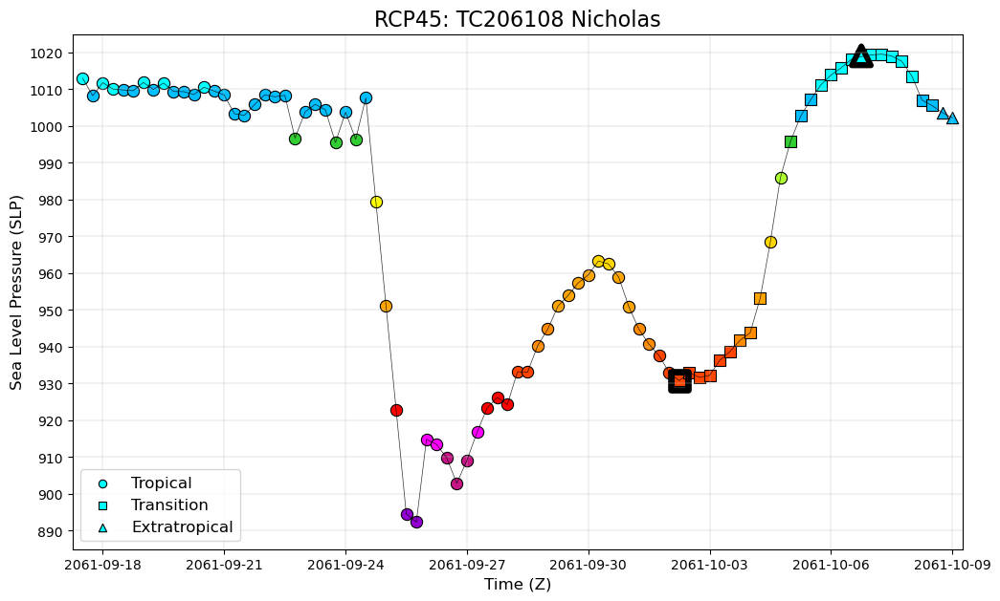

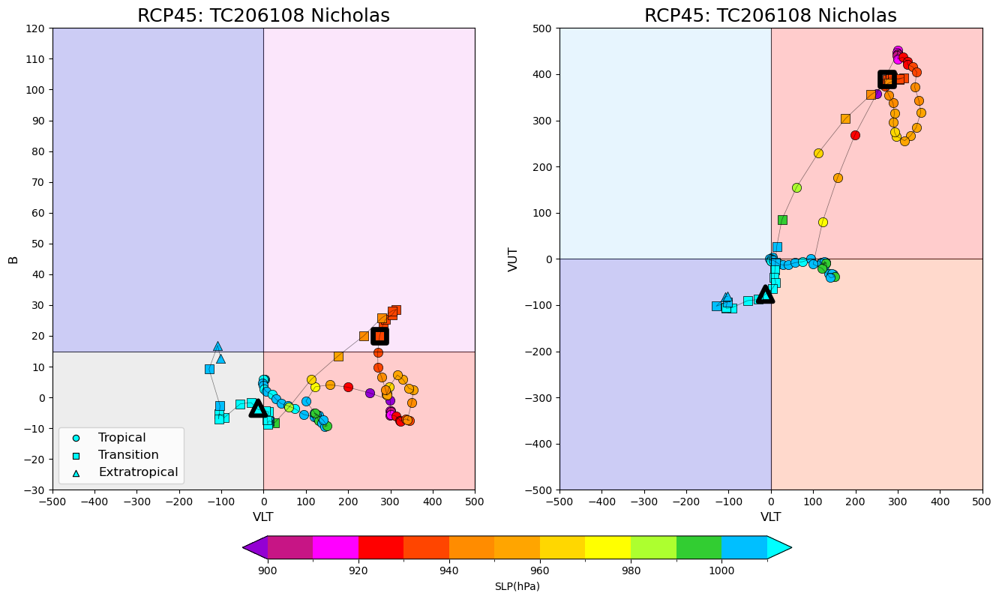

In [37]:
# Input Code
Code = 'TC206108'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 1, True, "RCP45", True, (8,7))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)

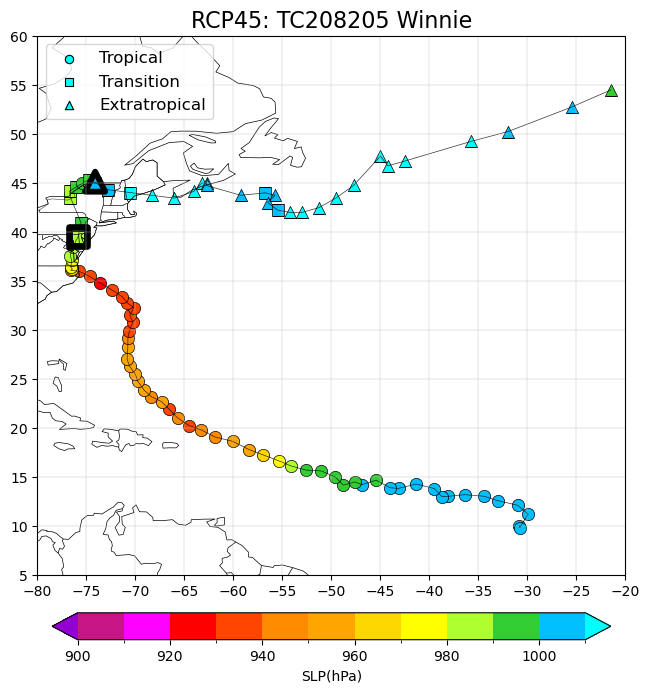

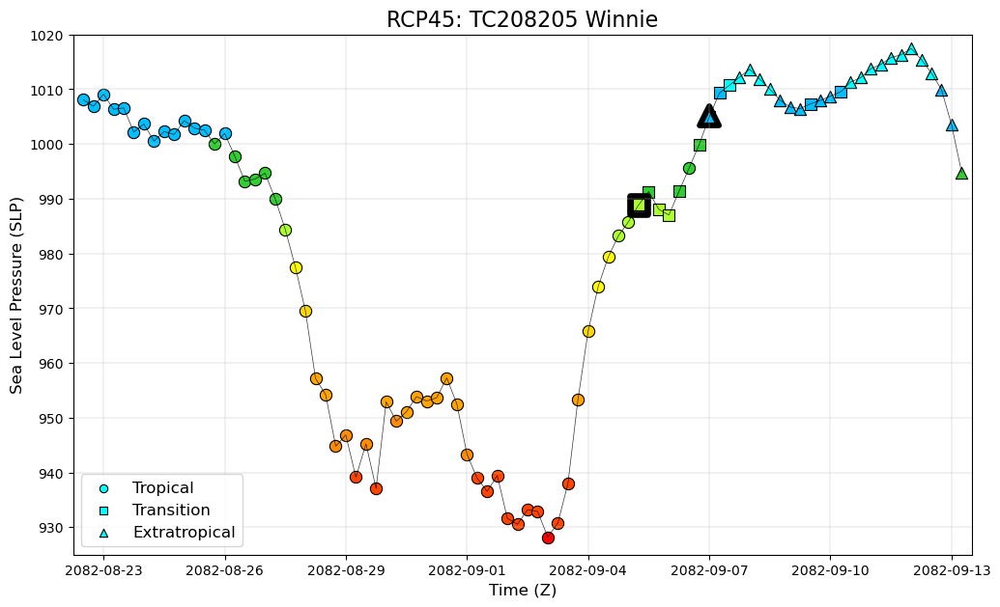

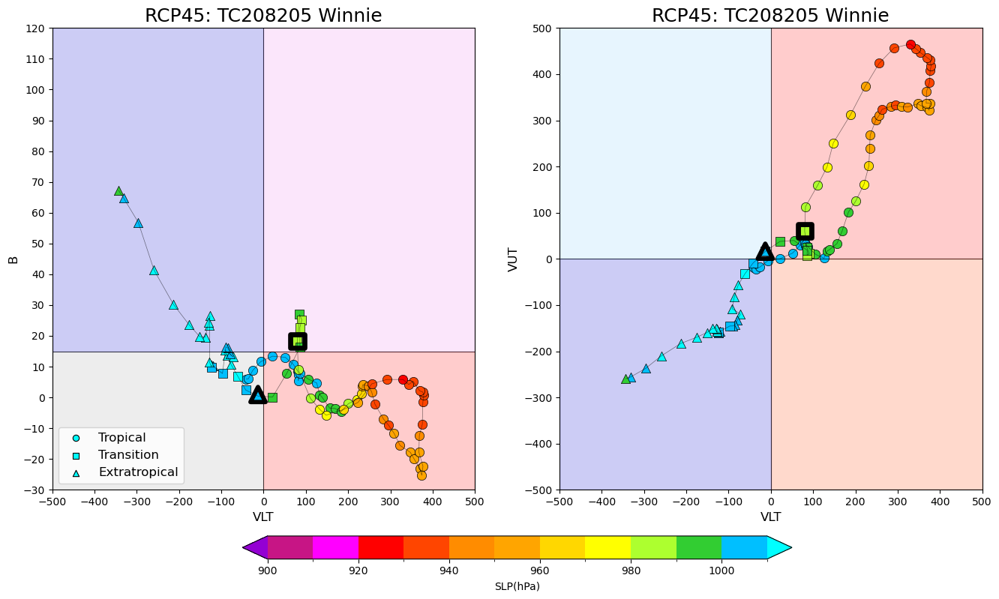

In [38]:
# Input Code
Code = 'TC208205'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP45", True, (8,7))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)

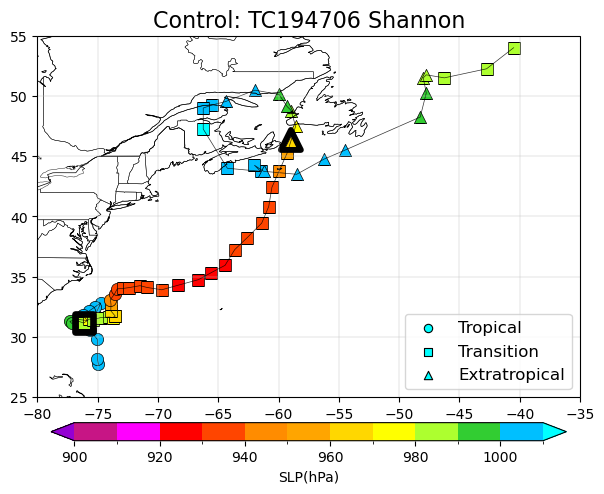

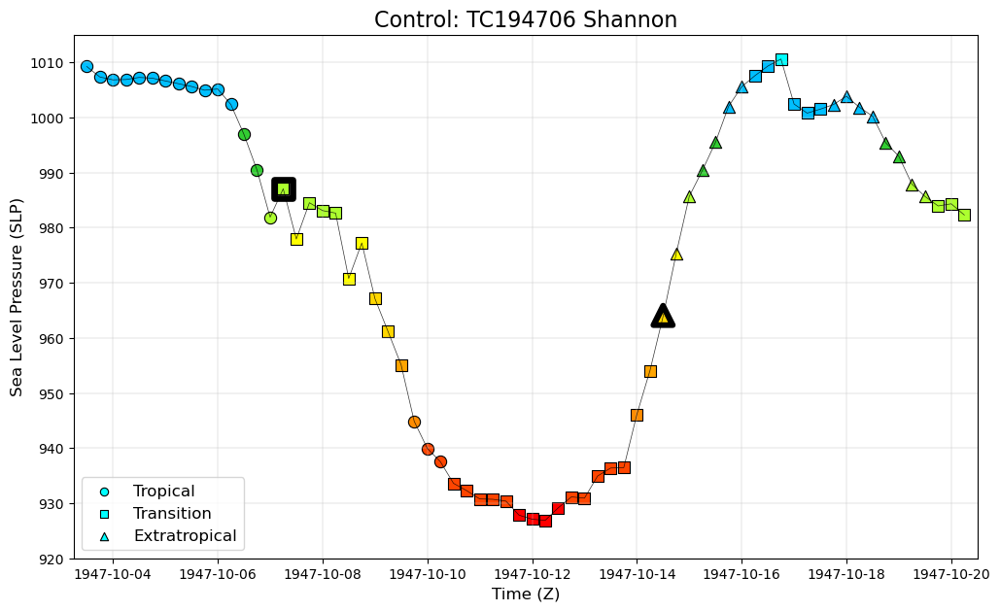

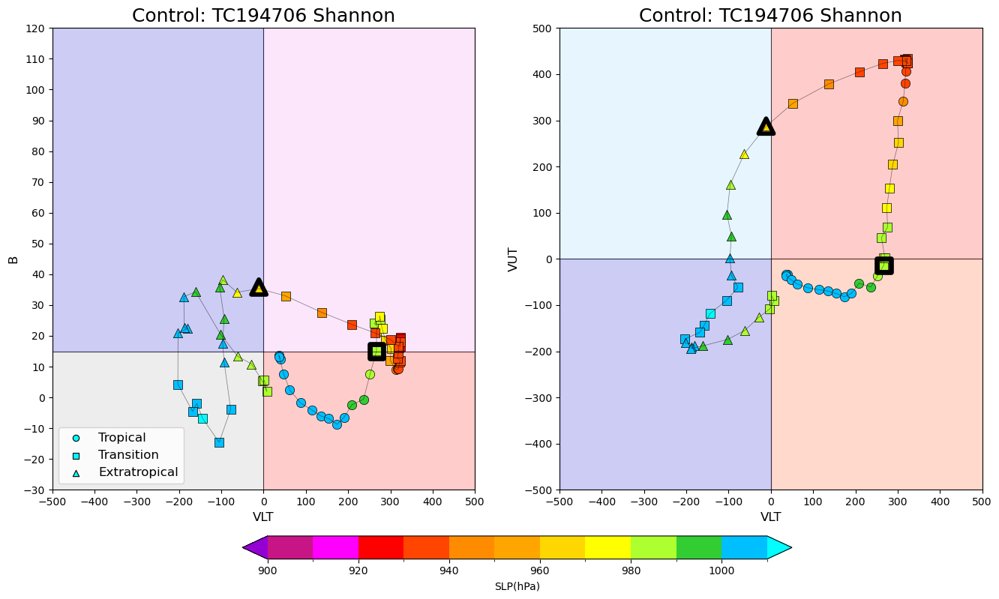

In [39]:
# Input Code
Code = 'TC194706'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 4, True, "Control", True, (7,6))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

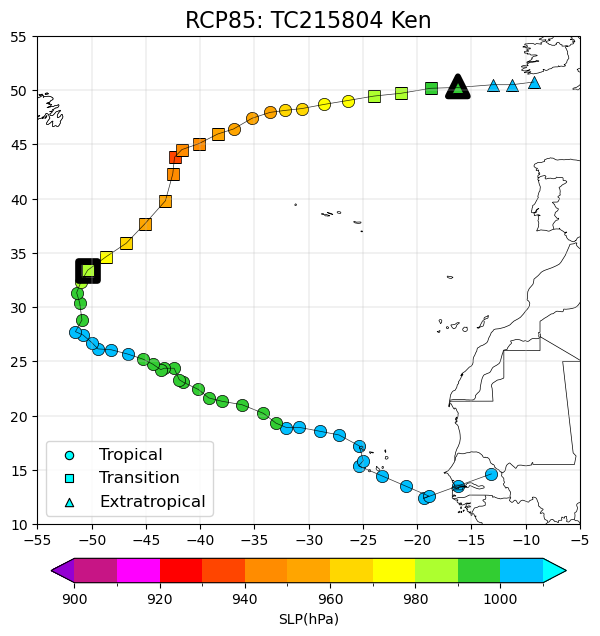

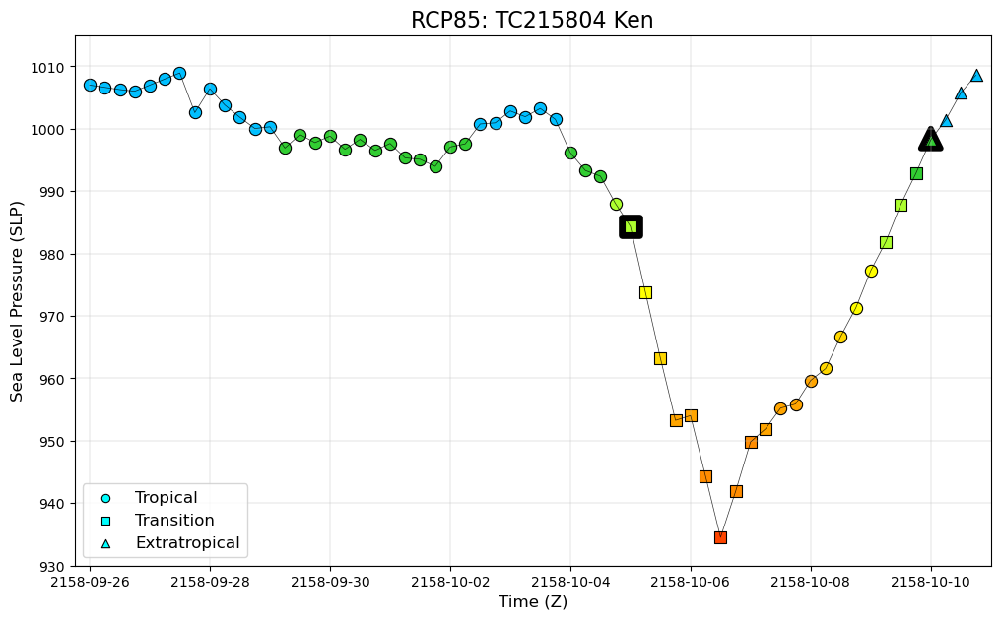

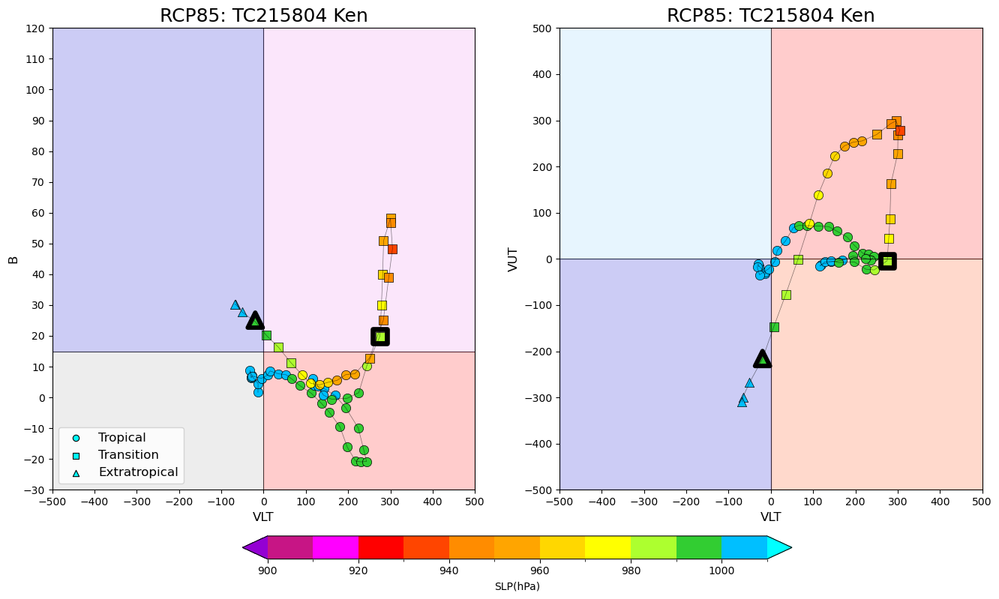

In [40]:
# Input Code
Code = 'TC215804'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True, (7,7))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)

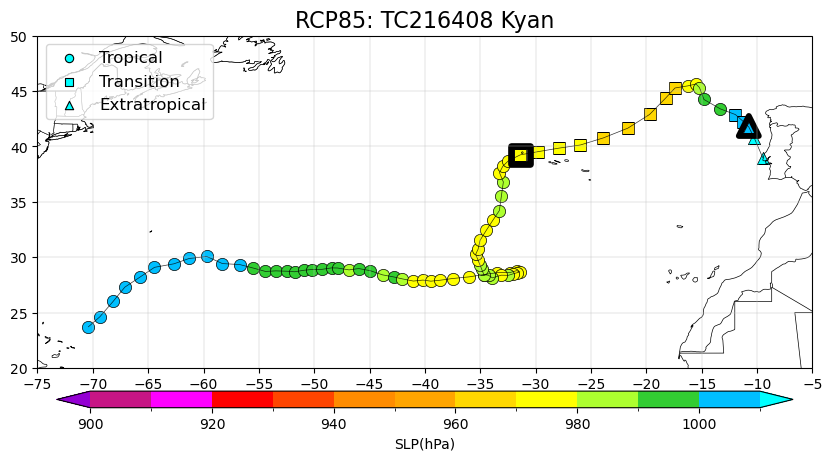

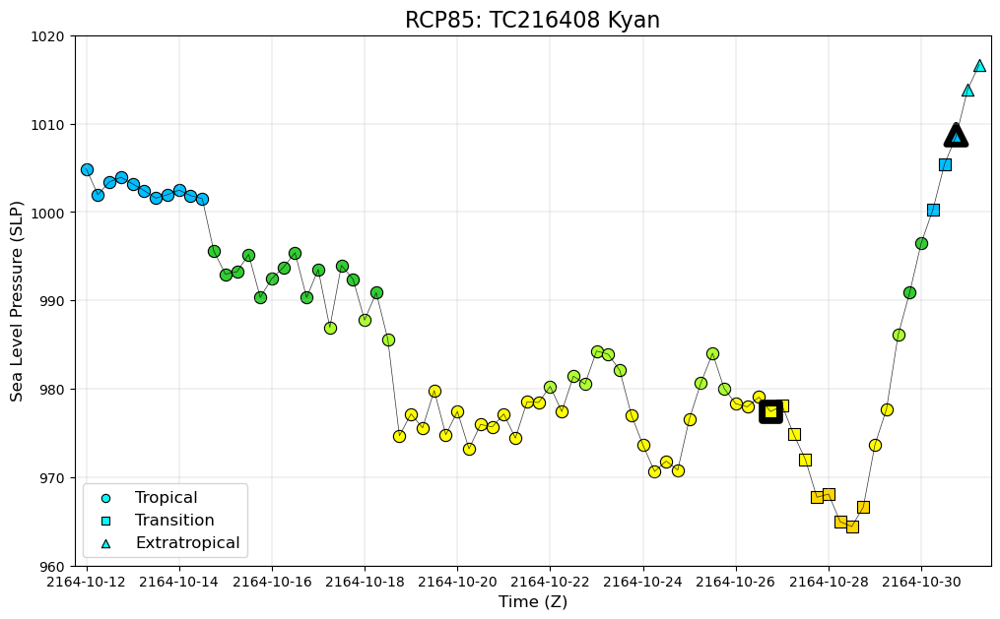

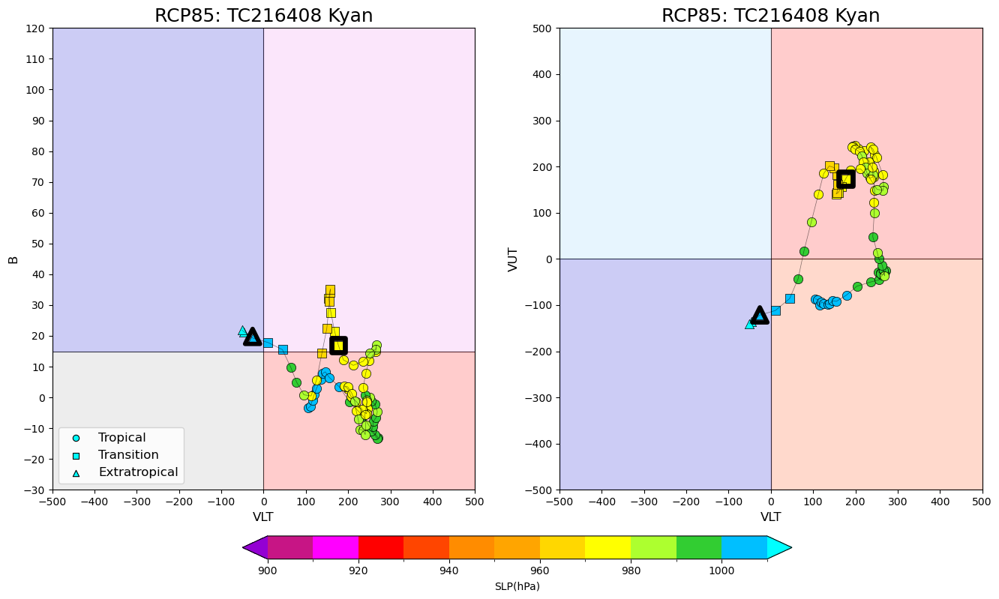

In [41]:
# Input Code
Code = 'TC216408'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP85", True, (10,5))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)

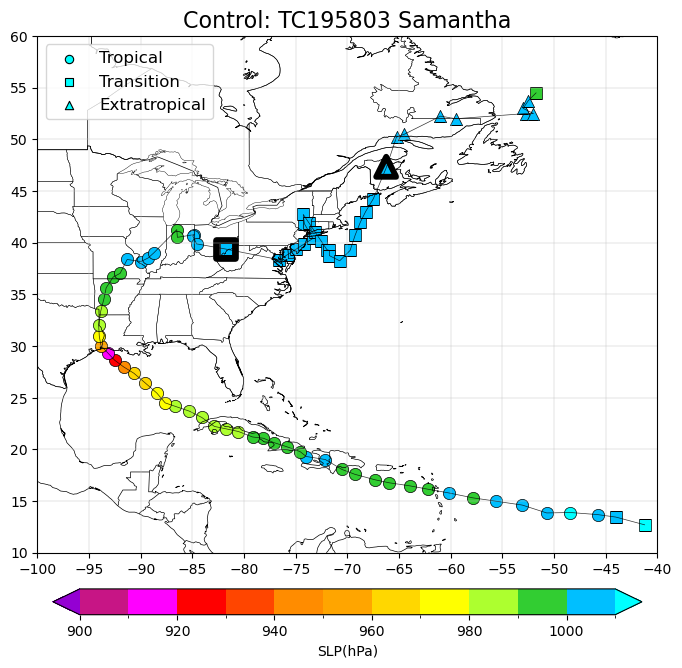

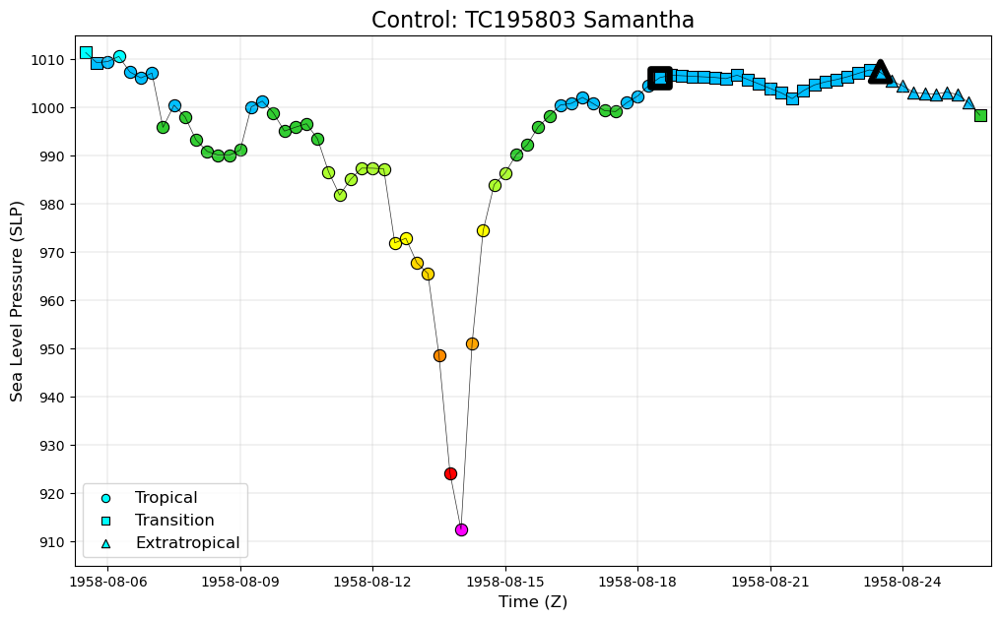

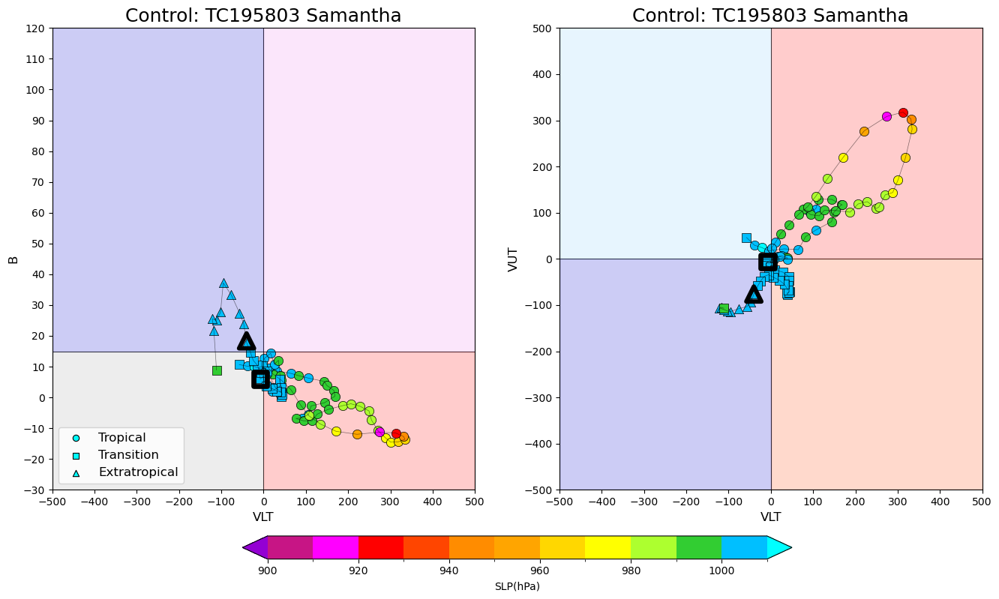

In [42]:
# Input Code
Code = 'TC195803'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 2, True, "Control", True, (8,7))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

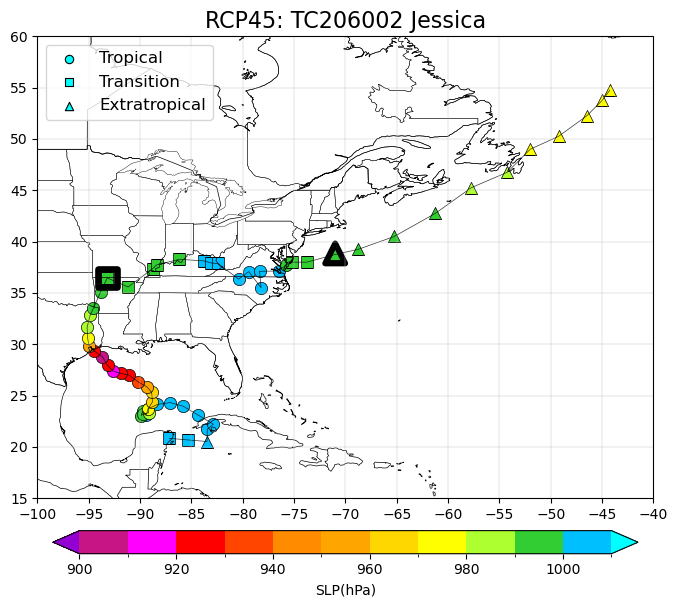

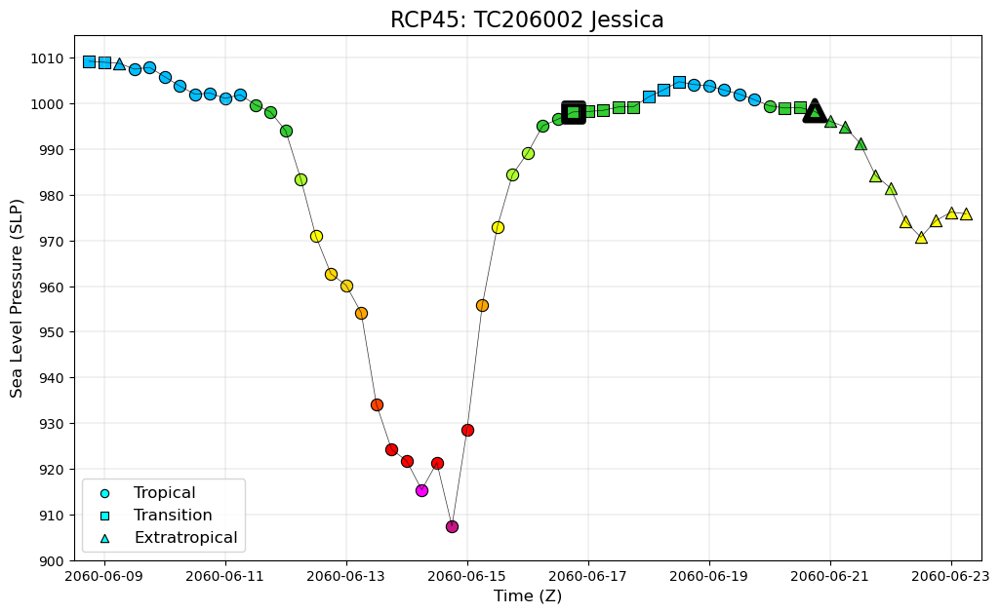

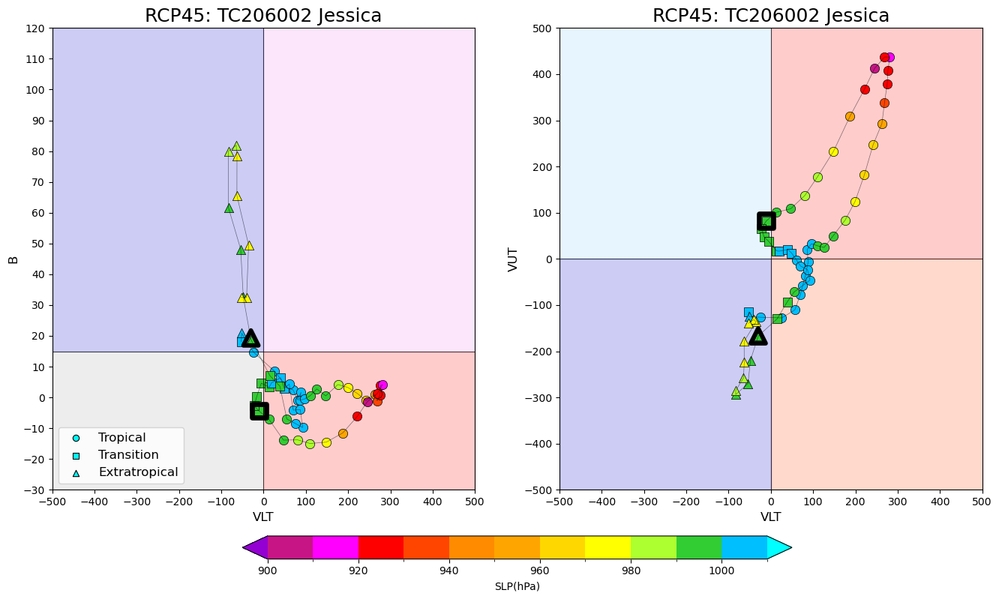

In [43]:
# Input Code
Code = 'TC206002'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP45", True, (8,6))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)

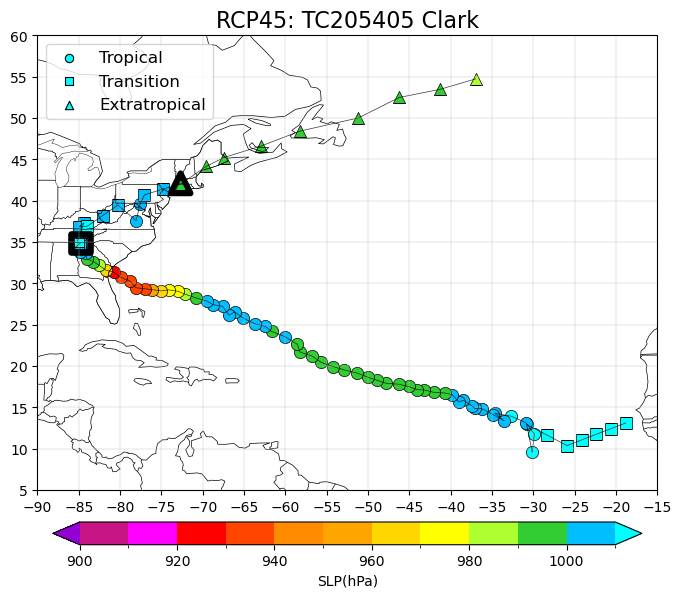

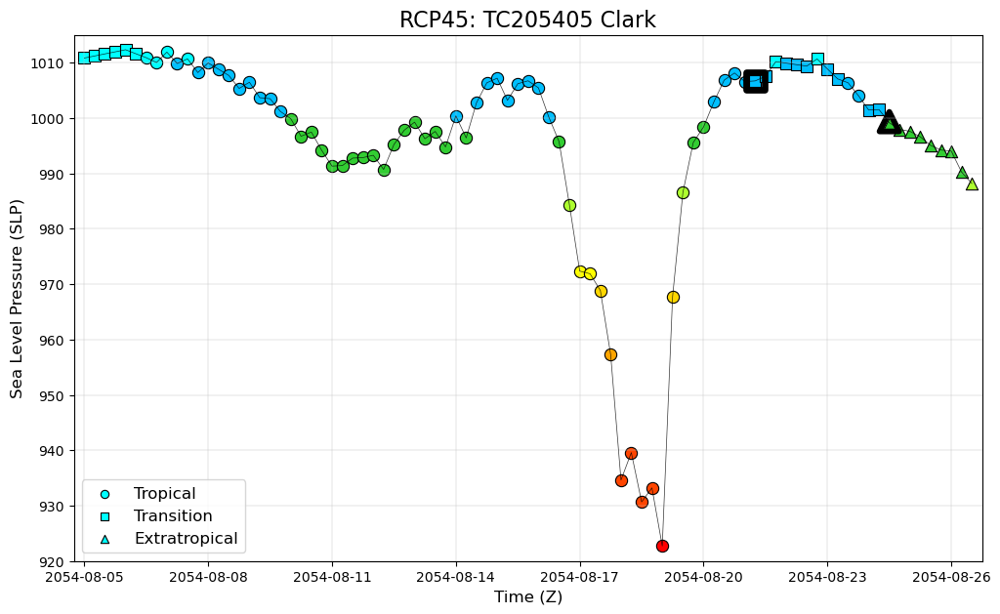

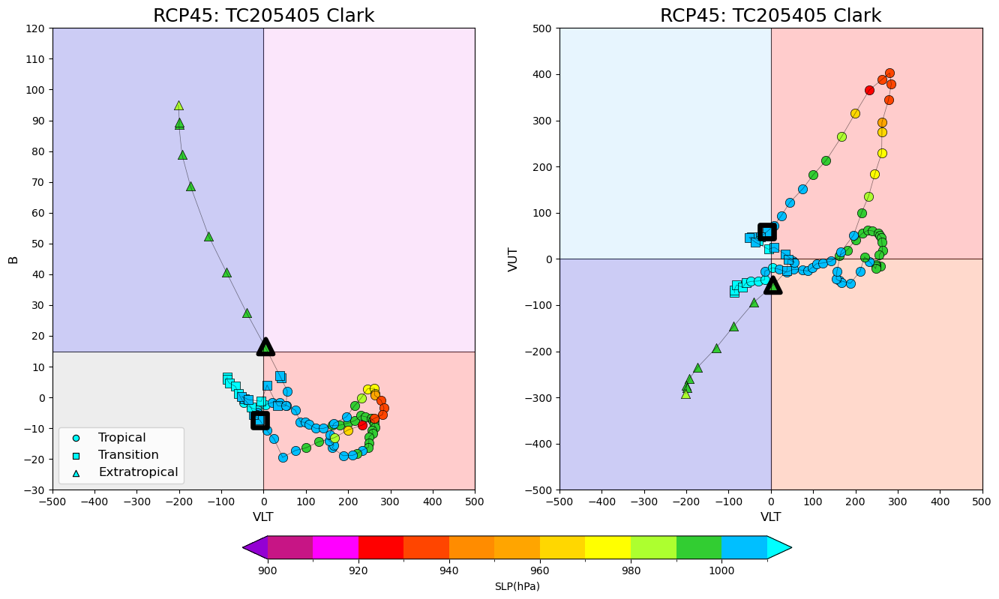

In [44]:
# Input Code
Code = 'TC205405'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP45", True, (8,7))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)

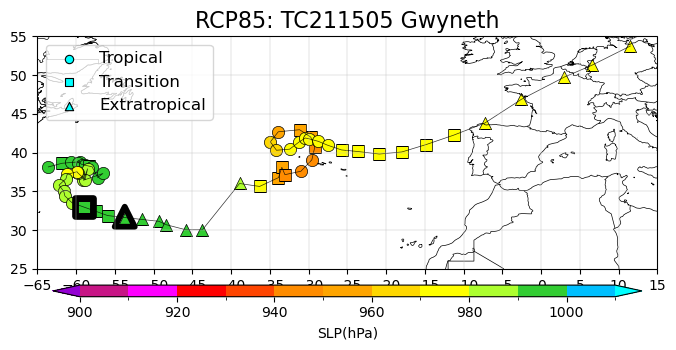

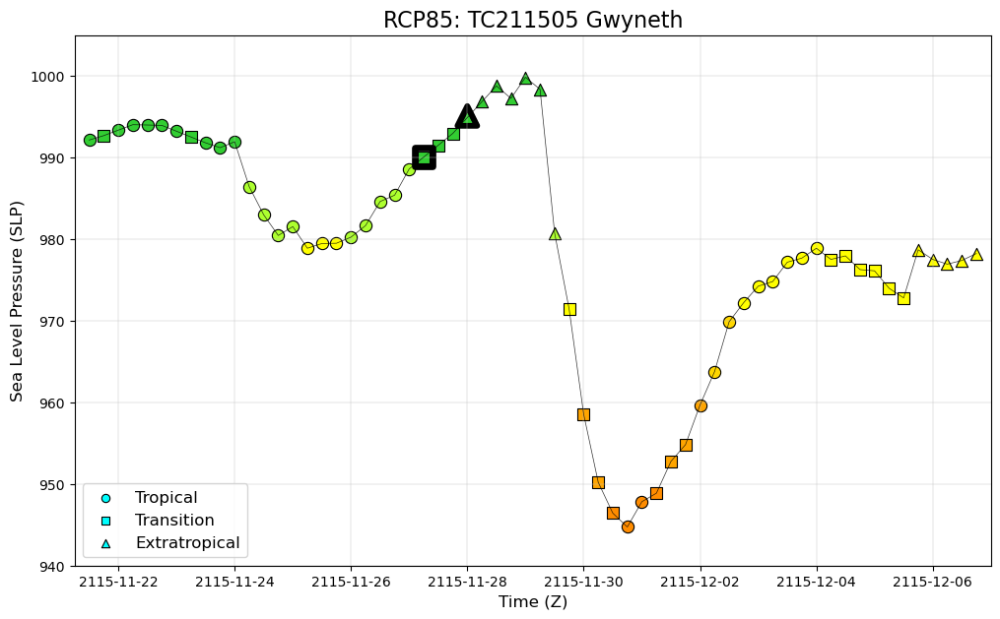

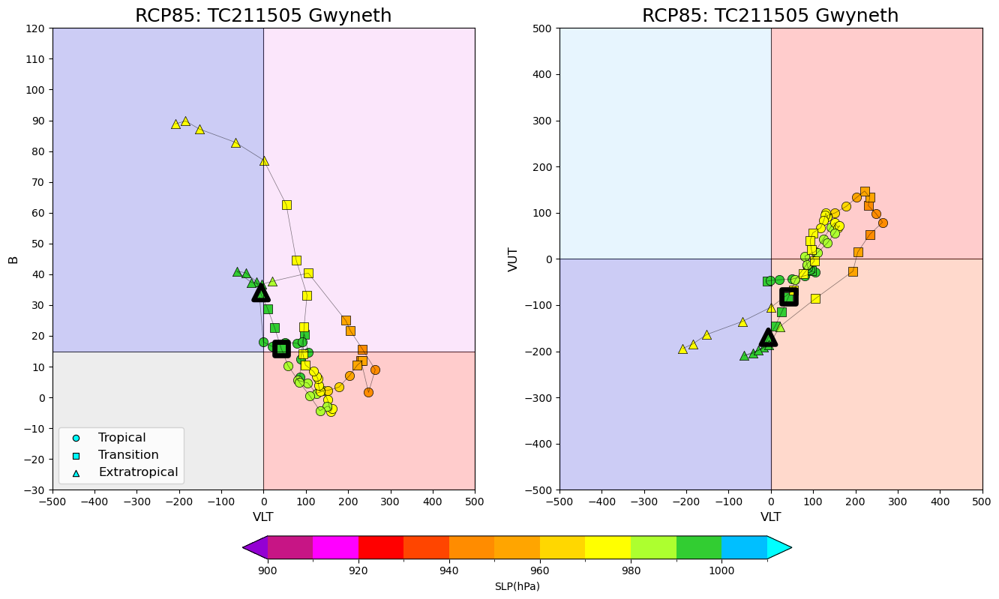

In [45]:
# Input Code
Code = 'TC211505'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP85", True, (8,7))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)

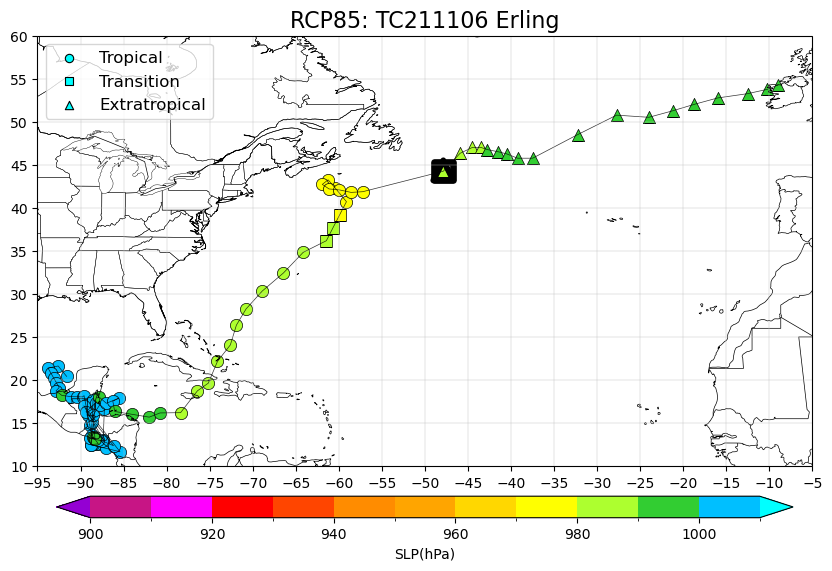

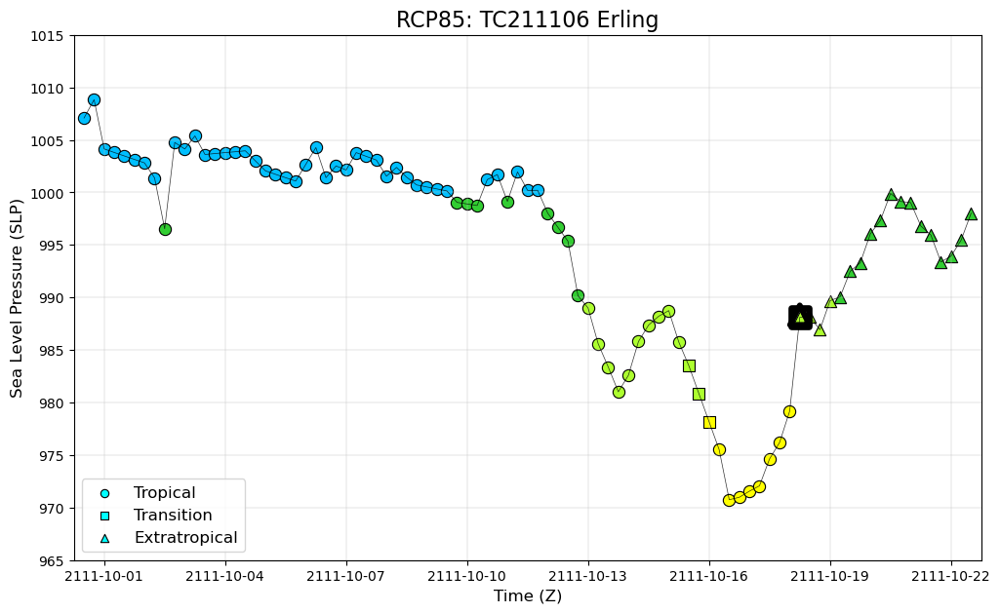

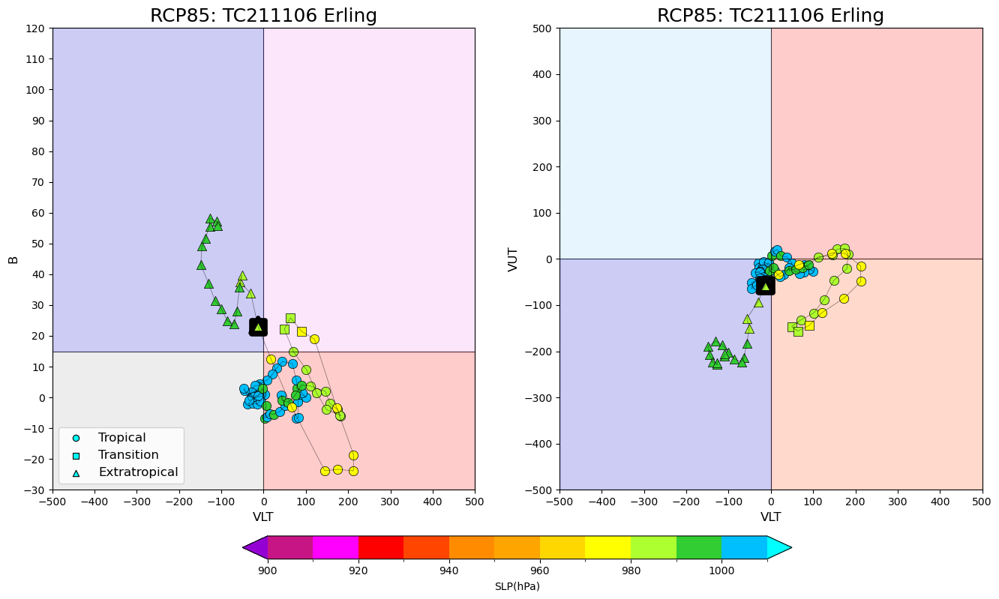

In [46]:
# Input Code
Code = 'TC211106'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP85", True, (10,6))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)

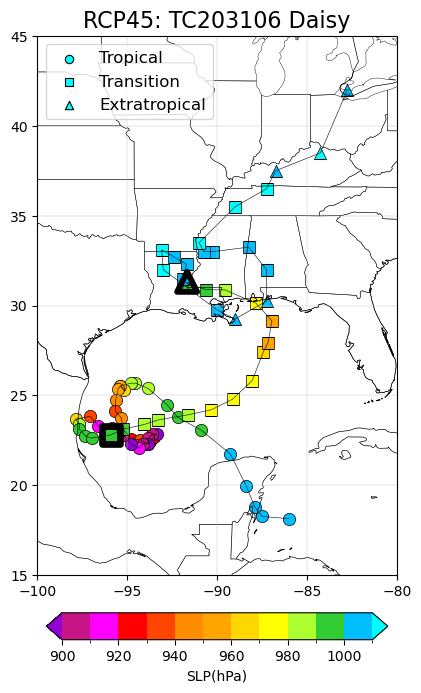

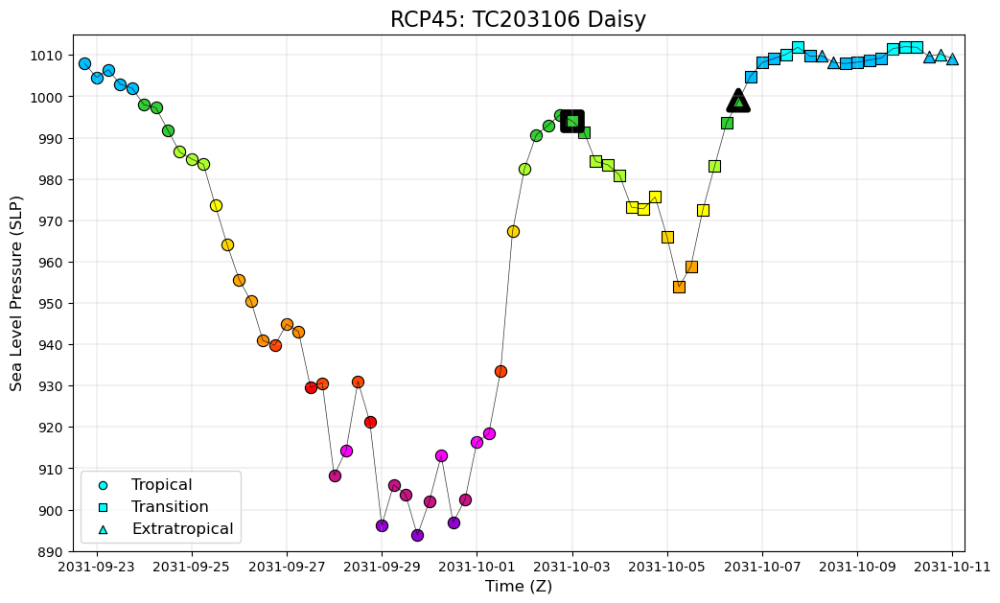

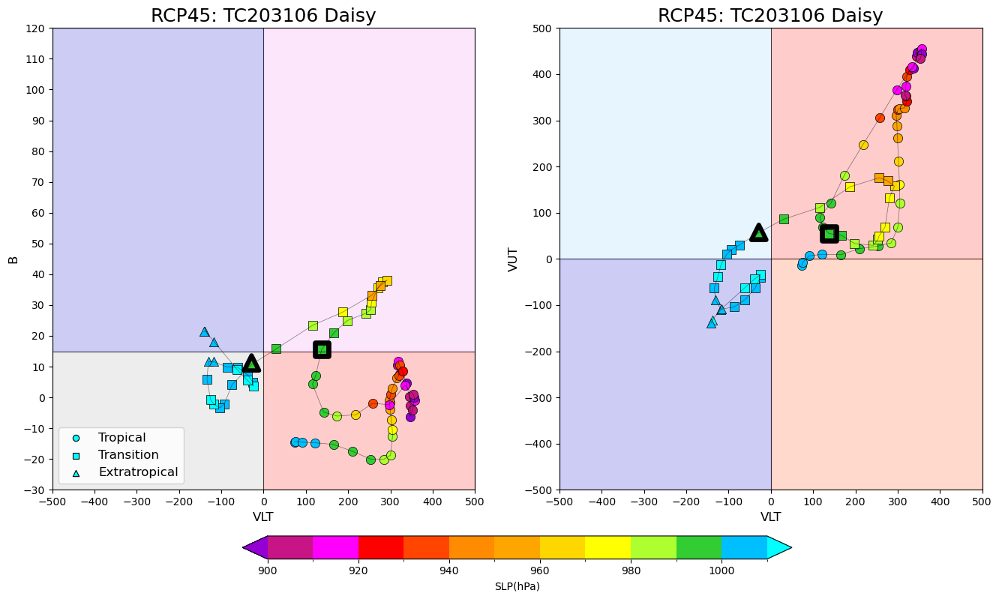

In [47]:
# Input Code
Code = 'TC203106'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP45", True, (5,7))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)

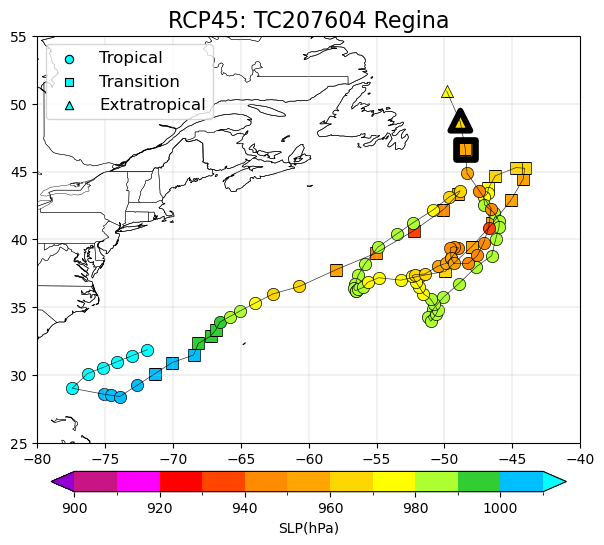

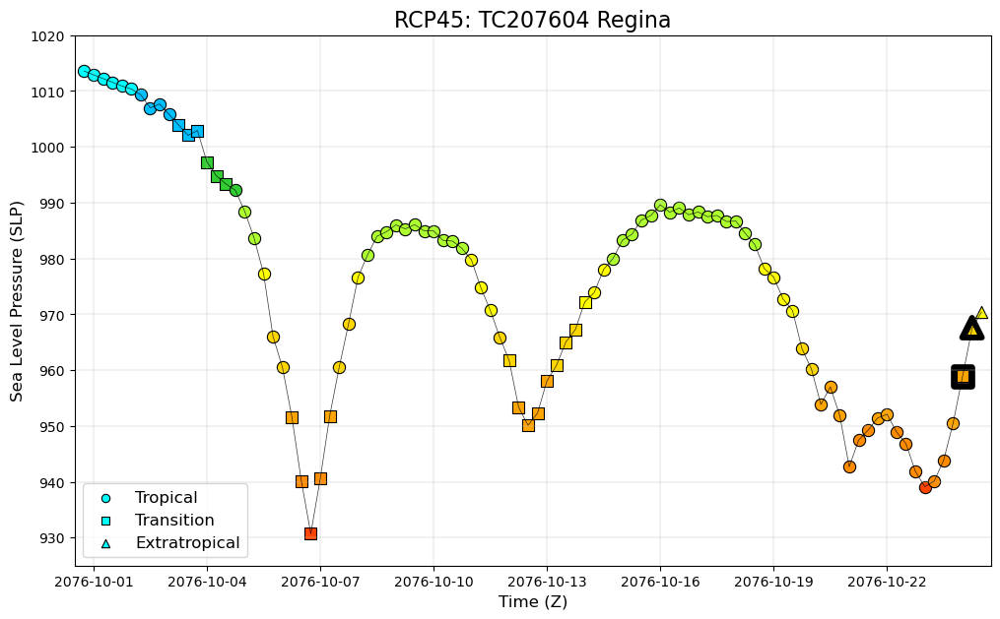

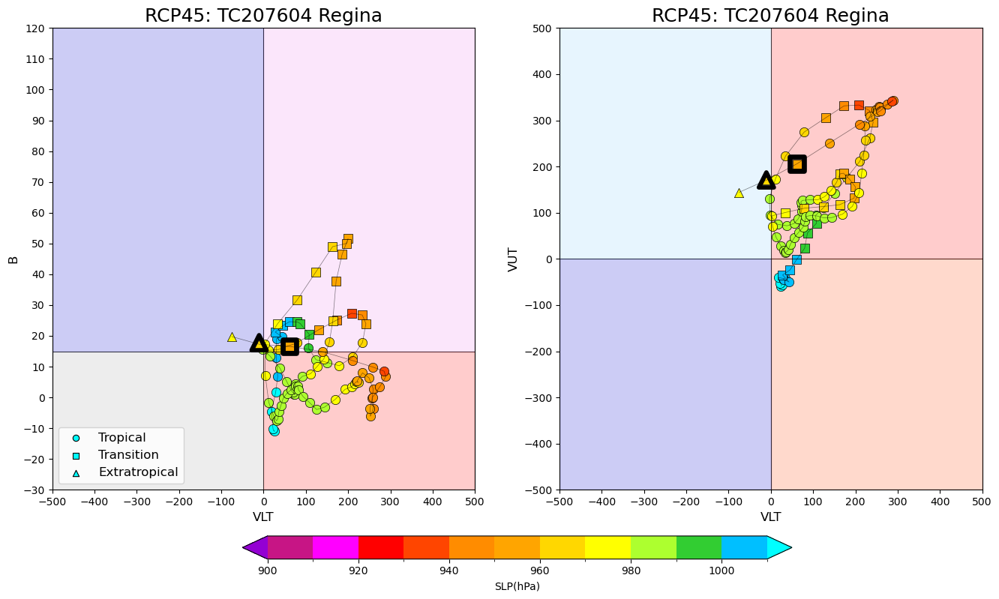

In [48]:
# Input Code
Code = 'TC207604'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP45", True, (7,6))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)

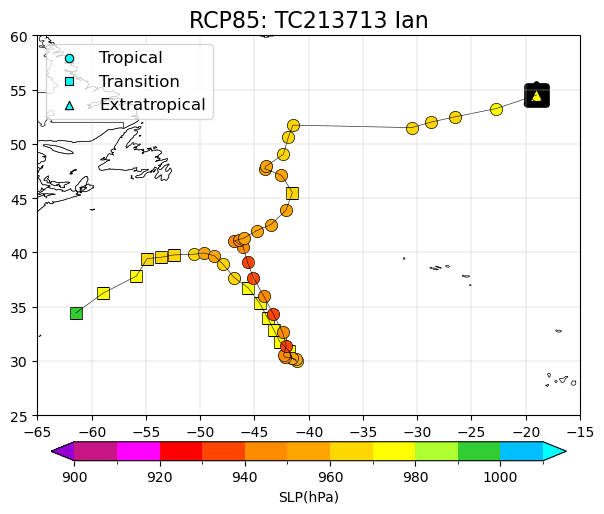

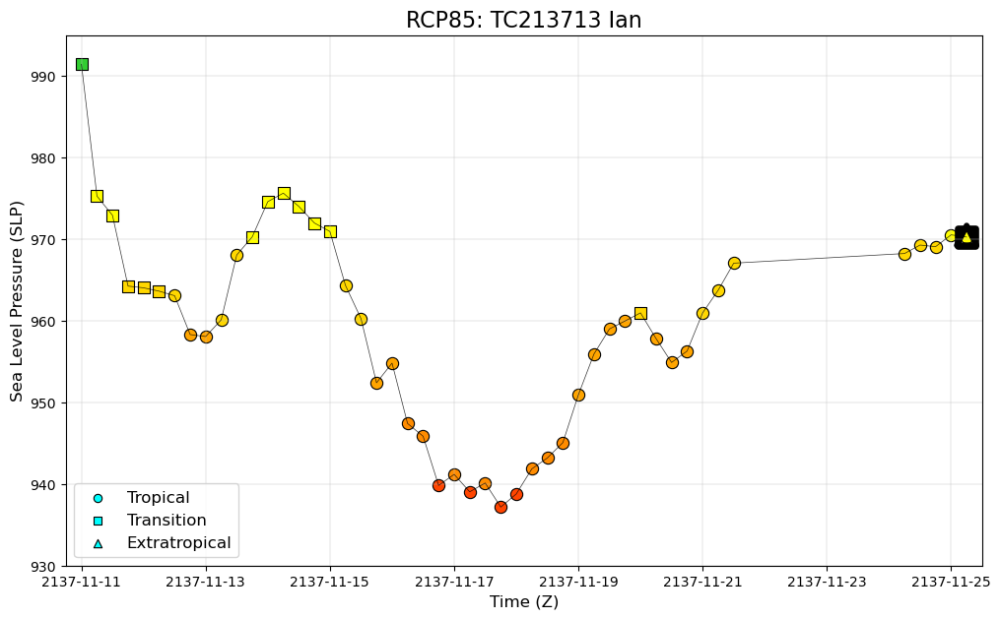

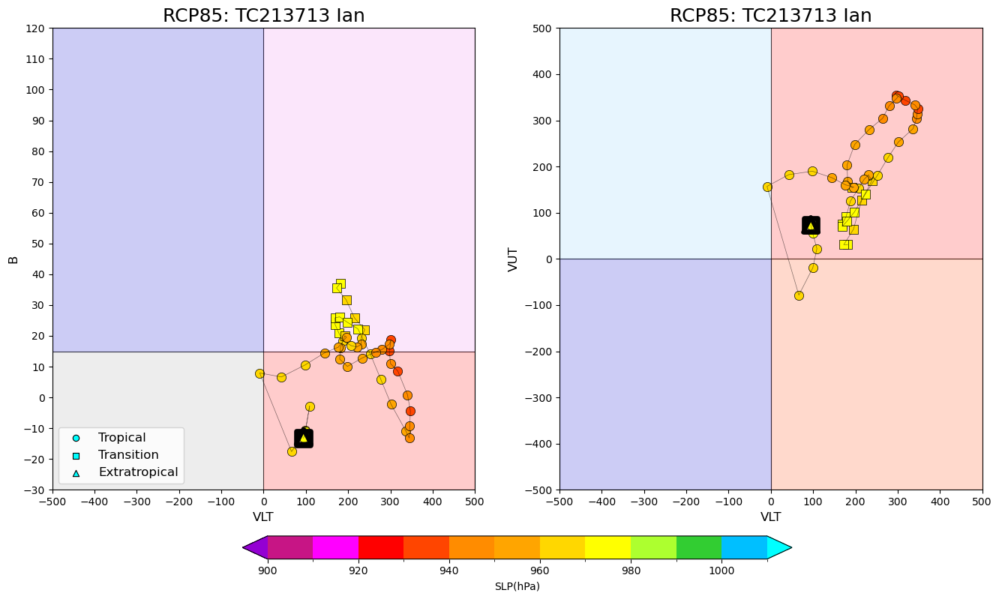

In [49]:
# Input Code
Code = 'TC213713'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP85", True, (7,6))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)

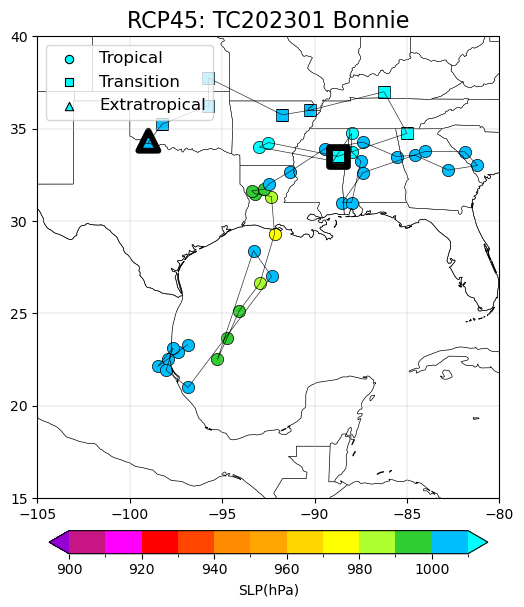

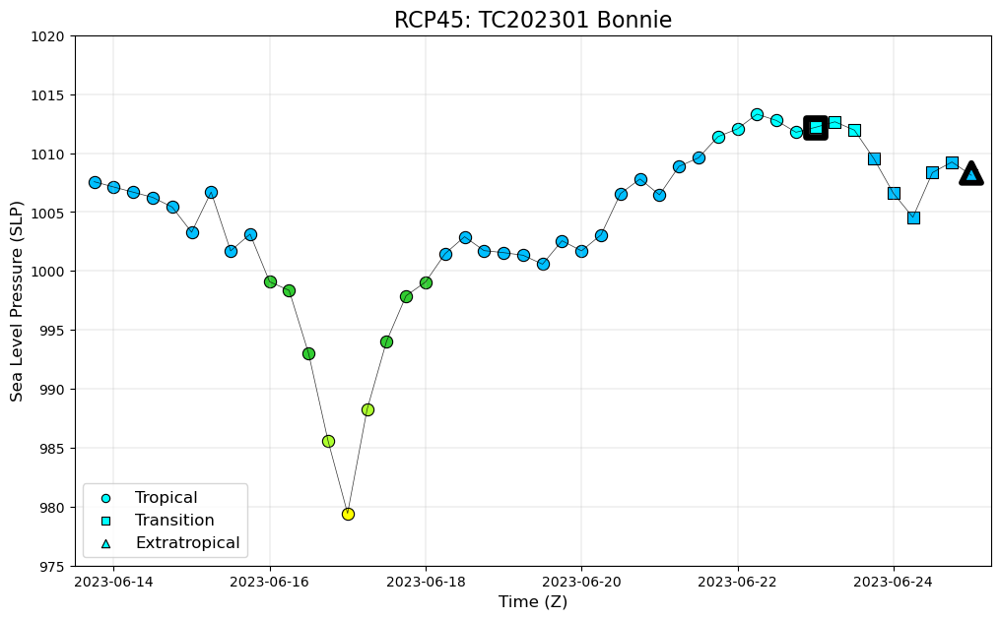

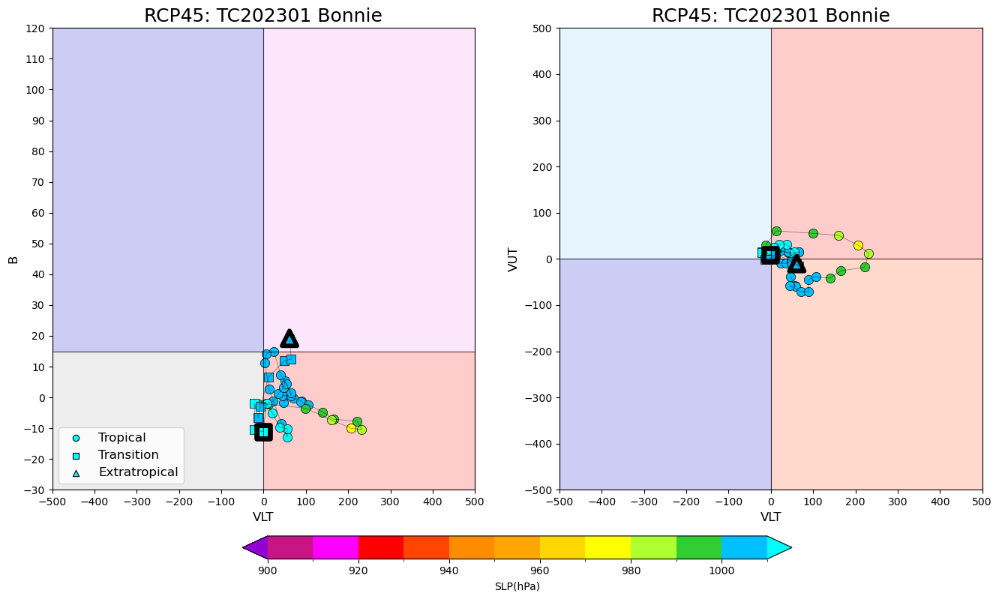

In [50]:
# Input Code
Code = 'TC202301'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP45", True, (6,6))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)

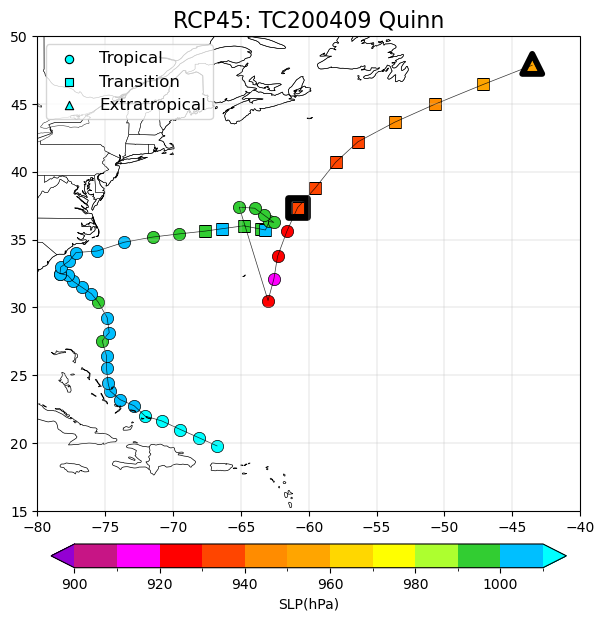

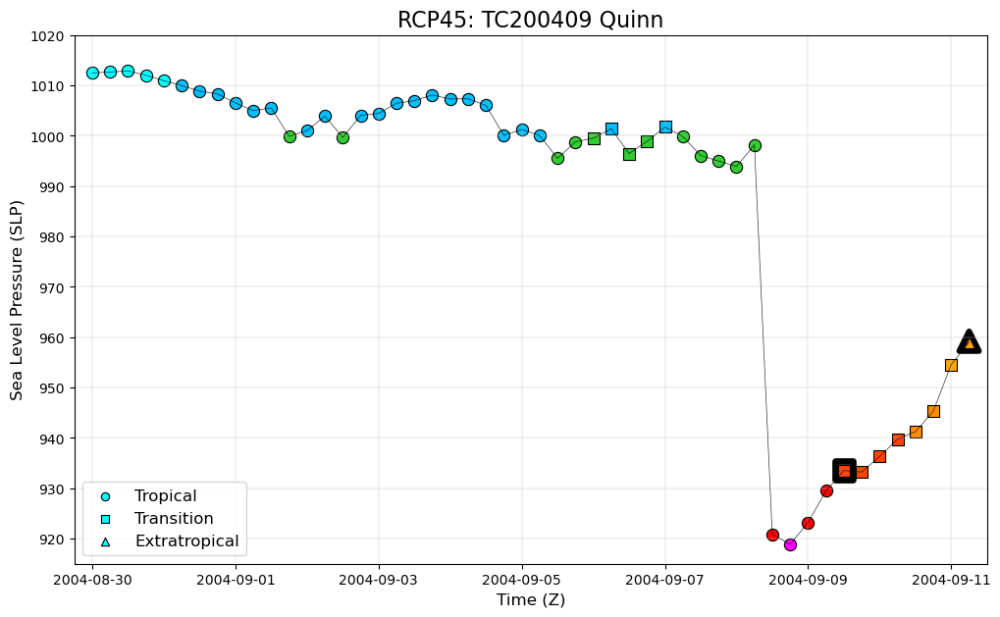

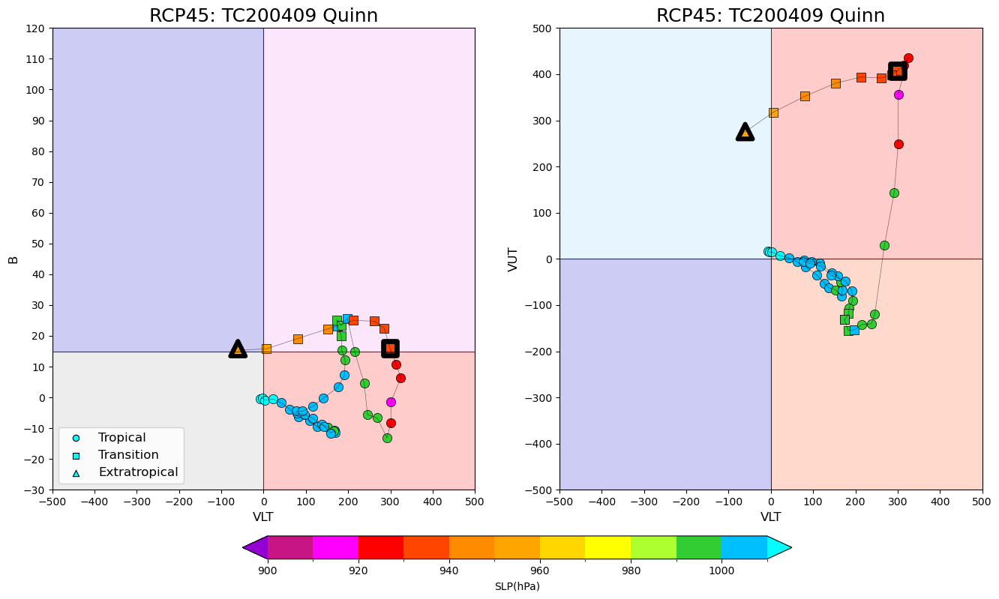

In [51]:
# Input Code
Code = 'TC200409'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP45", True, (7,7))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP45", True)

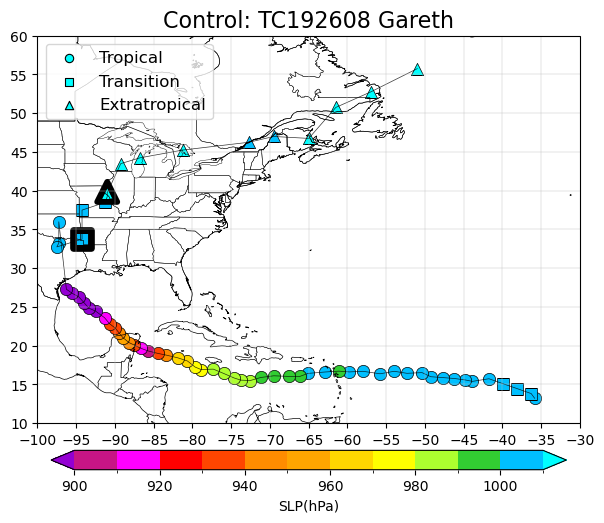

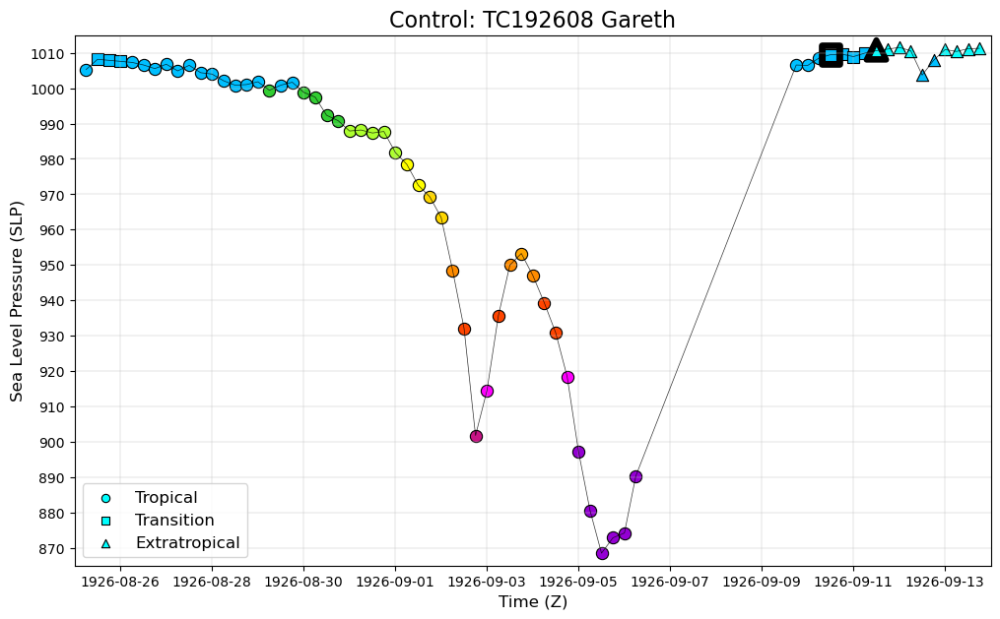

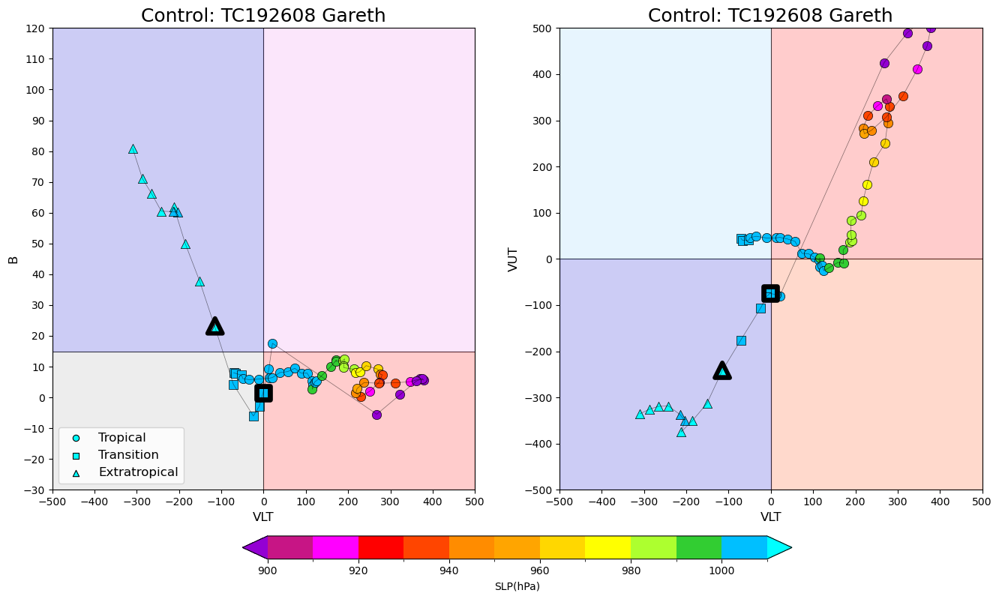

In [52]:
# Input Code
Code = 'TC192608'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 2, True, "Control", True, (7,7))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

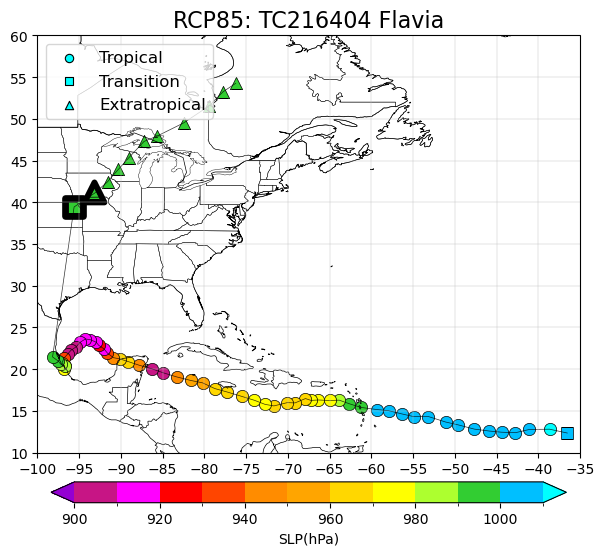

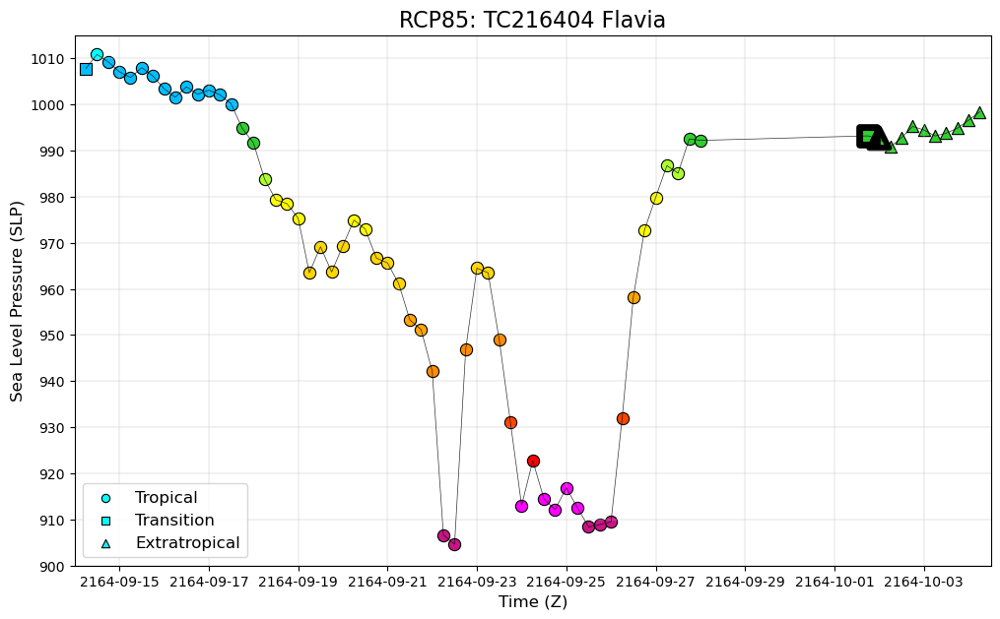

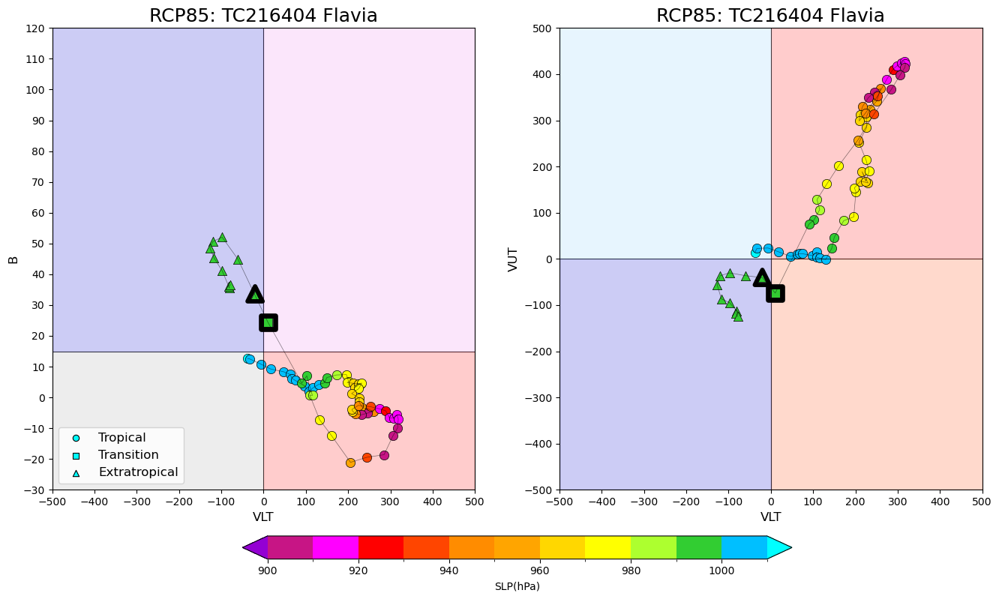

In [53]:
# Input Code
Code = 'TC216404'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP85", True, (7,7))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)

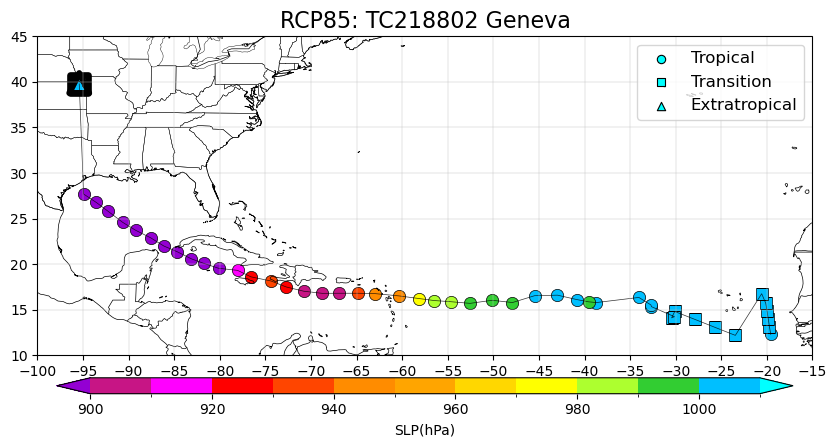

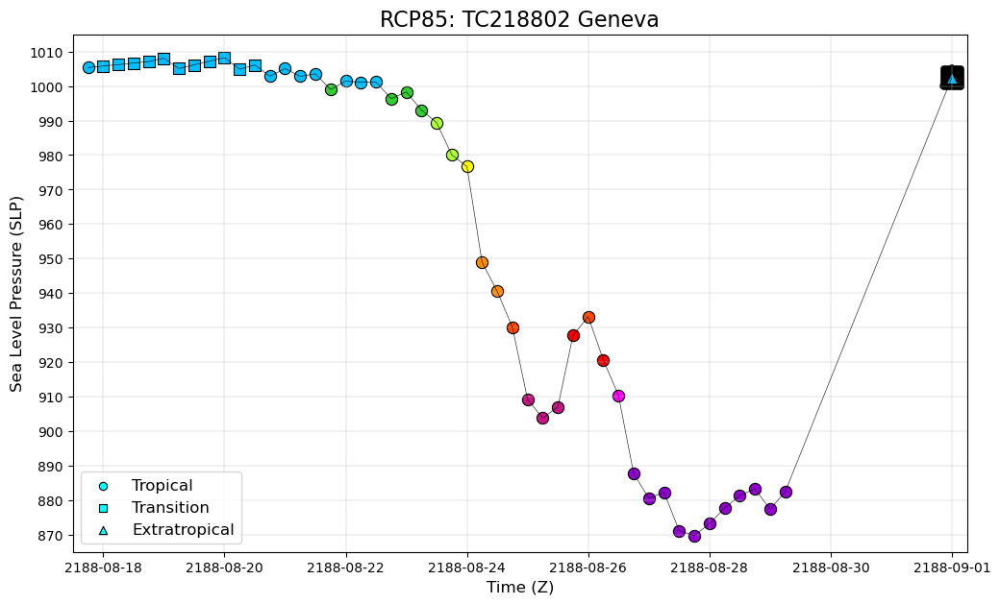

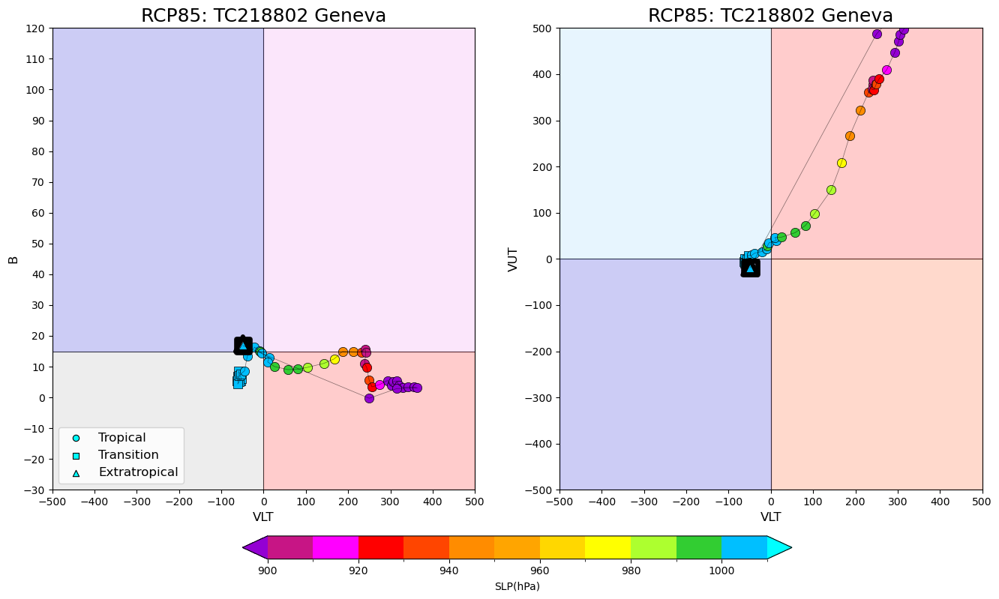

In [54]:
# Input Code
Code = 'TC218802'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 1, True, "RCP85", True, (10,5))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP85", True)

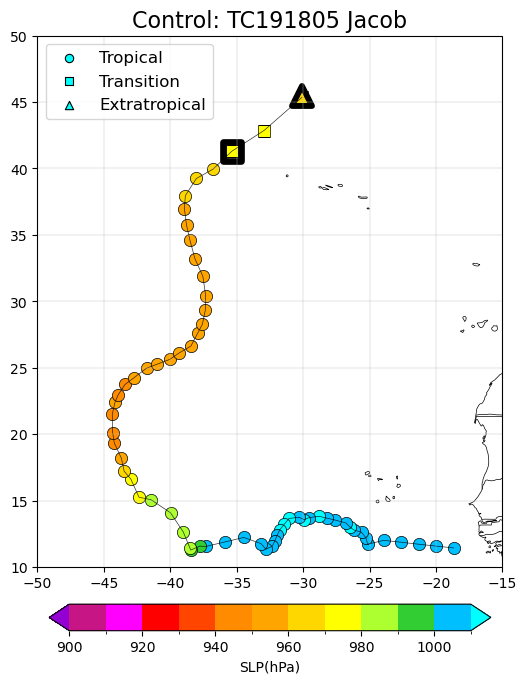

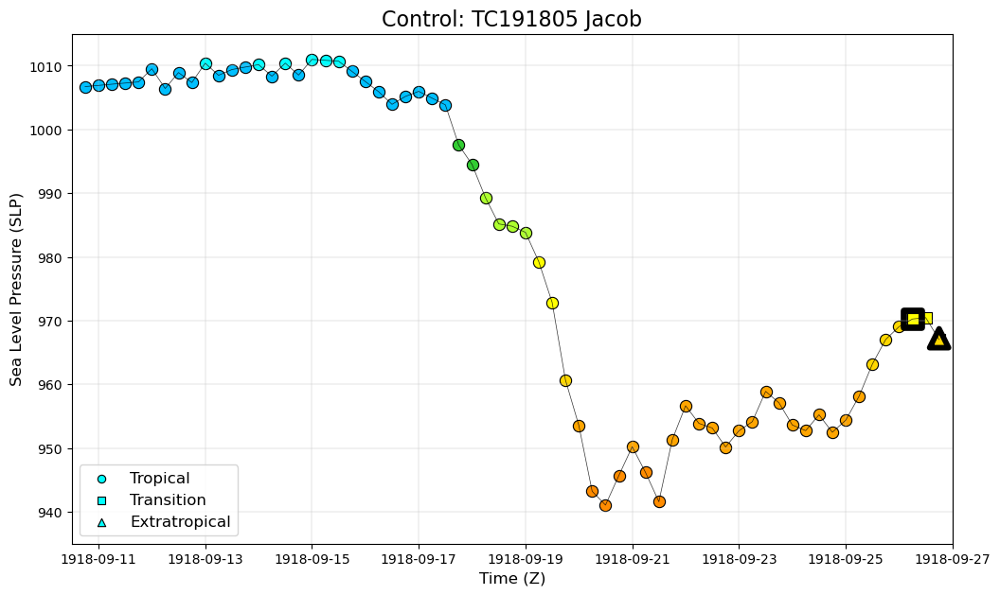

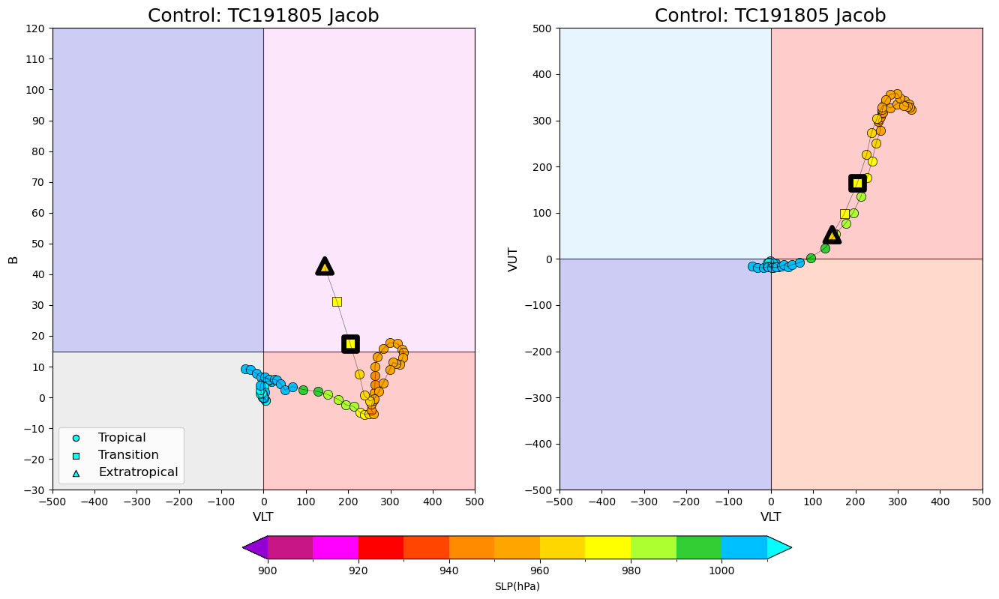

In [55]:
# Input Code
Code = 'TC191805'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 2, True, "Control", True, (6,8))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

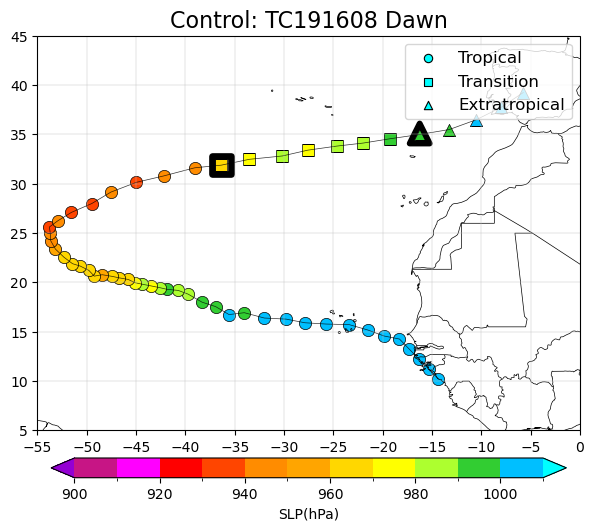

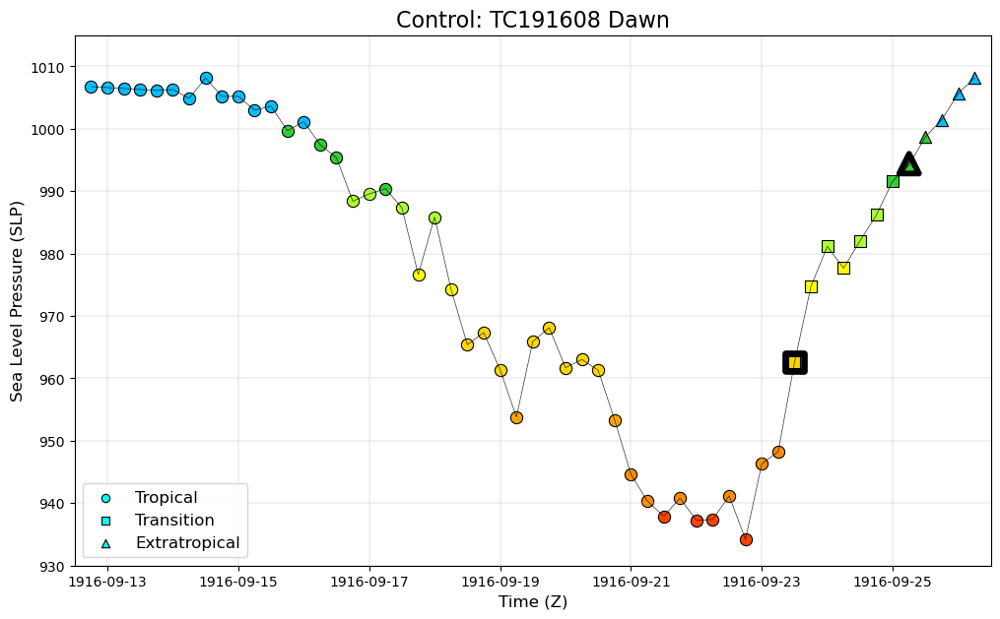

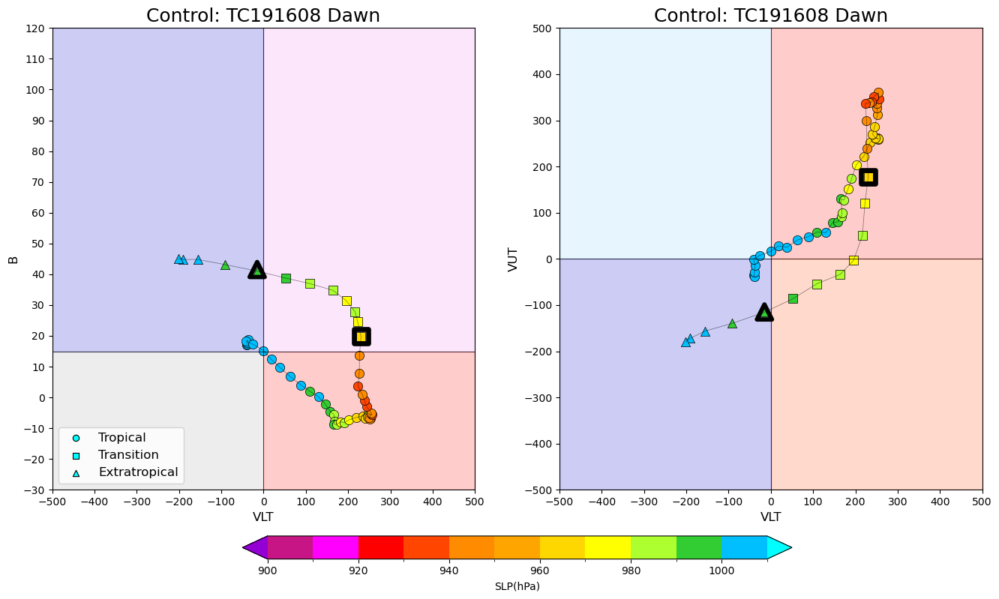

In [62]:
# Input Code
Code = 'TC191608'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 1, True, "Control", False, (7,7))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", False)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", False)

In [57]:
Control_ET[Control_ET["Min SLP"] < 900]

,Code,Name,Path Type,Start Time,End Time,ET Duration (hr),Start SLP,End SLP,Min SLP,Start Lon,Start Lat,End Lon,End Lat,ET Distance (km),Tropical Duration (hr)
55,TC191304,Melody,1.0,1913-09-05 18:00:00,1913-09-08 18:00:00,72.0,932.19,968.71,894.09,-71.04,31.75,-51.01,50.86,2669.249341,288.0
90,TC192006,Lily,1.0,1920-09-12 06:00:00,1920-09-13 00:00:00,18.0,962.47,983.28,881.40,-73.86,40.10,-78.50,47.75,928.029516,336.0
124,TC192608,Gareth,2.0,1926-09-10 12:00:00,1926-09-11 12:00:00,24.0,1009.48,1010.63,868.51,-94.25,33.75,-91.00,39.75,727.553932,390.0
162,TC193404,Victor,1.0,1934-08-24 00:00:00,1934-08-24 12:00:00,12.0,993.66,994.95,899.29,-84.16,39.94,-81.34,41.05,268.763082,288.0
250,TC195008,Cissy,1.0,1950-09-09 06:00:00,1950-09-09 12:00:00,6.0,994.94,998.23,895.09,-80.25,42.58,-79.61,44.33,201.542485,294.0
277,TC195507,Kyle,1.0,1955-08-29 06:00:00,1955-09-01 12:00:00,78.0,933.28,978.12,874.62,-72.74,38.62,-39.00,53.00,2998.710621,294.0
359,TC197304,Melody,1.0,1973-09-05 18:00:00,1973-09-08 18:00:00,72.0,932.19,968.71,894.09,-71.04,31.75,-51.01,50.86,2669.249341,288.0
394,TC198006,Lily,1.0,1980-09-12 06:00:00,1980-09-13 00:00:00,18.0,962.47,983.28,881.40,-73.86,40.10,-78.50,47.75,928.029516,336.0
428,TC198608,Gareth,2.0,1986-09-10 12:00:00,1986-09-11 12:00:00,24.0,1009.48,1010.63,868.51,-94.25,33.75,-91.00,39.75,727.553932,390.0


In [58]:
# Input Code
#for i in range(len(Control_ET)):
#    Control_Code = Control_ET['Code'][i]
#    if i >= 280 and i < 300:
#        Plot_Cyclone_Track(Control_Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 4, True, "Control", False, (8,8))